In [1]:
import numpy as np
import pandas as pd
import time 

# plots
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle

In [3]:
df = pd.read_csv("uszips.csv")
df

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,True,NaN,16834.0,100.9,72001,Adjuntas,"{""72001"": 98.73, ""72141"": 1.27}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,True,NaN,37642.0,479.2,72003,Aguada,"{""72003"": 100}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,True,NaN,49075.0,551.7,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,72005|72099,False,False,America/Puerto_Rico
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,True,NaN,5590.0,48.7,72093,Maricao,"{""72093"": 82.27, ""72153"": 11.66, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,True,NaN,25542.0,265.7,72011,Añasco,"{""72011"": 96.7, ""72099"": 2.81, ""72083"": 0.37, ...",Añasco|Moca|Las Marías|Aguada,72011|72099|72083|72003,False,False,America/Puerto_Rico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33783,99923,55.98043,-130.03803,Hyder,AK,Alaska,True,NaN,25.0,0.6,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,America/Sitka
33784,99925,55.55398,-132.96276,Klawock,AK,Alaska,True,NaN,920.0,6.6,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,America/Sitka
33785,99926,55.12617,-131.48928,Metlakatla,AK,Alaska,True,NaN,1465.0,4.3,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,America/Metlakatla
33786,99927,56.33305,-133.60044,Point Baker,AK,Alaska,True,NaN,14.0,1.2,2198,Prince of Wales-Hyder,"{""02198"": 100}",Prince of Wales-Hyder,02198,False,False,America/Sitka


In [4]:
df.head(5)

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,True,NaN,16834.0,100.9,72001,Adjuntas,"{""72001"": 98.73, ""72141"": 1.27}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,True,NaN,37642.0,479.2,72003,Aguada,"{""72003"": 100}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,True,NaN,49075.0,551.7,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,72005|72099,False,False,America/Puerto_Rico
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,True,NaN,5590.0,48.7,72093,Maricao,"{""72093"": 82.27, ""72153"": 11.66, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,True,NaN,25542.0,265.7,72011,Añasco,"{""72011"": 96.7, ""72099"": 2.81, ""72083"": 0.37, ...",Añasco|Moca|Las Marías|Aguada,72011|72099|72083|72003,False,False,America/Puerto_Rico


In [5]:
# drop anything unnecessary

In [6]:
df.drop('county_fips_all', axis=1, inplace=True)
df.drop('imprecise', axis=1, inplace=True)
df.drop('military', axis=1, inplace=True)
df.drop('timezone', axis=1, inplace=True)
df.drop('parent_zcta', axis=1, inplace=True)
df.drop('zcta', axis=1, inplace=True)



In [7]:
df.head(5)

,zip,lat,lng,city,state_id,state_name,population,density,county_fips,county_name,county_weights,county_names_all
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,16834.0,100.9,72001,Adjuntas,"{""72001"": 98.73, ""72141"": 1.27}",Adjuntas|Utuado
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,37642.0,479.2,72003,Aguada,"{""72003"": 100}",Aguada
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,49075.0,551.7,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,5590.0,48.7,72093,Maricao,"{""72093"": 82.27, ""72153"": 11.66, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,25542.0,265.7,72011,Añasco,"{""72011"": 96.7, ""72099"": 2.81, ""72083"": 0.37, ...",Añasco|Moca|Las Marías|Aguada


In [8]:
km_to_mi_conversion_factor = 0.386102

# Convert population density from per square kilometer to per square mile
df['density_per_mile'] = df['density'] / km_to_mi_conversion_factor

# Display the updated DataFrame with the new column
df.head()

,zip,lat,lng,city,state_id,state_name,population,density,county_fips,county_name,county_weights,county_names_all,density_per_mile
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,16834.0,100.9,72001,Adjuntas,"{""72001"": 98.73, ""72141"": 1.27}",Adjuntas|Utuado,261.329908
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,37642.0,479.2,72003,Aguada,"{""72003"": 100}",Aguada,1241.122812
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,49075.0,551.7,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,1428.897027
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,5590.0,48.7,72093,Maricao,"{""72093"": 82.27, ""72153"": 11.66, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande,126.132473
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,25542.0,265.7,72011,Añasco,"{""72011"": 96.7, ""72099"": 2.81, ""72083"": 0.37, ...",Añasco|Moca|Las Marías|Aguada,688.160123


In [9]:
avg_density = df['density_per_mile'].mean()

print(f"The average population density is: {avg_density:.2f} people per square mile.")


The average population density is: 1321.08 people per square mile.


In [10]:
# Group the DataFrame by the 'state_id' column
grouped_by_state = df.groupby('state_id')

# Iterate through the groups and display them (optional)
for state_id, state_group in grouped_by_state:
    print(f"State: {state_id}")
    print(state_group)
    print("\n")

State: AK
         zip       lat        lng         city state_id state_name  \
33543  99501  61.22005 -149.85872    Anchorage       AK     Alaska   
33544  99502  61.16323 -149.98644    Anchorage       AK     Alaska   
33545  99503  61.90744 -156.85203    Anchorage       AK     Alaska   
33546  99504  61.19195 -149.64255    Anchorage       AK     Alaska   
33547  99505  61.27512 -149.65197         Jber       AK     Alaska   
...      ...       ...        ...          ...      ...        ...   
33783  99923  55.98043 -130.03803        Hyder       AK     Alaska   
33784  99925  55.55398 -132.96276      Klawock       AK     Alaska   
33785  99926  55.12617 -131.48928   Metlakatla       AK     Alaska   
33786  99927  56.33305 -133.60044  Point Baker       AK     Alaska   
33787  99929  56.36089 -132.00635     Wrangell       AK     Alaska   

       population  density  county_fips            county_name  \
33543     16500.0    957.8         2020              Anchorage   
33544     26257.0

In [11]:
# lets see what we have

# Get the unique state names
unique_state_names = df['state_name'].unique()

# Display the unique state names
print('Unique State Names:')
for state_name in unique_state_names:
    print(state_name)

Unique State Names:
Puerto Rico
Virgin Islands
Massachusetts
Rhode Island
New Hampshire
Maine
Vermont
Connecticut
New York
New Jersey
Pennsylvania
Delaware
District of Columbia
Virginia
Maryland
West Virginia
North Carolina
South Carolina
Georgia
Florida
Alabama
Tennessee
Mississippi
Kentucky
Ohio
Indiana
Michigan
Iowa
Wisconsin
Minnesota
South Dakota
North Dakota
Montana
Illinois
Missouri
Kansas
Nebraska
Louisiana
Arkansas
Oklahoma
Texas
Colorado
Wyoming
Idaho
Utah
Arizona
New Mexico
Nevada
California
Hawaii
American Samoa
Guam
Northern Mariana Islands
Oregon
Washington
Alaska


In [12]:
average_density_by_state = df.groupby('state_name')['density'].mean()


In [13]:
# Create a DataFrame from the grouped result
result_df = pd.DataFrame({
    'State': average_density_by_state.index,
    'Average Density (ppl per sqmi)': average_density_by_state.values
})

# Display in table format- better looking! :)
print(result_df.to_string(index=False))

                   State  Average Density (ppl per sqmi)
                 Alabama                      189.383384
                  Alaska                       64.607755
          American Samoa                             NaN
                 Arizona                      513.369305
                Arkansas                       81.267154
              California                     1314.174251
                Colorado                      424.942125
             Connecticut                      646.089583
                Delaware                      558.780882
    District of Columbia                     3032.835088
                 Florida                      826.414144
                 Georgia                      318.931558
                    Guam                             NaN
                  Hawaii                      724.038144
                   Idaho                      100.010394
                Illinois                      546.249713
                 Indiana       

# Puerto Rico

In [358]:
PR = 'PR'

# Filter the DataFrame for the selected state (Puerto Rico)
PR_df = df[df['state_id'] == PR]

# Calculate the average population density per county
average_density_by_county_PR = PR_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_PR = pd.DataFrame({
    'County': average_density_by_county_PR.index,
    'Average Density': average_density_by_county_PR.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {PR}:')
print(result_df_PR.to_string(index=False))

Average Population Density by County in PR:
       County  Average Density
     Adjuntas       100.900000
       Aguada       479.200000
    Aguadilla       769.450000
 Aguas Buenas       304.600000
     Aibonito       171.800000
      Arecibo       258.500000
       Arroyo       406.500000
       Añasco       265.700000
  Barceloneta       474.800000
 Barranquitas       318.800000
      Bayamón      2131.000000
    Cabo Rojo       241.000000
       Caguas       816.150000
        Camuy       272.600000
    Canóvanas       516.500000
     Carolina      2077.600000
       Cataño      1572.400000
        Cayey       322.600000
        Ceiba       157.500000
       Ciales        95.200000
        Cidra       435.100000
        Coamo       172.200000
      Comerío       257.200000
      Corozal       313.600000
      Culebra        39.300000
       Dorado       329.450000
      Fajardo      1136.600000
      Florida       167.600000
      Guayama       207.800000
   Guayanilla       166.00

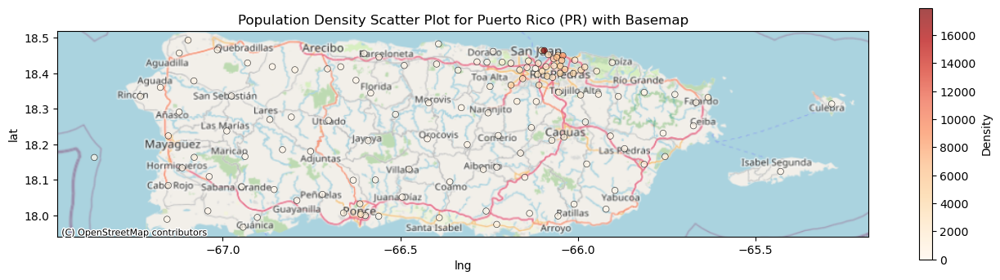

In [359]:
# Create a scatter plot with contextily basemap for the selected state (Puerto Rico)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Puerto Rico)
scatter = ax.scatter(PR_df['lng'], PR_df['lat'], c=PR_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Puerto Rico (PR) with Basemap')

# Show the plot
plt.show()

In [360]:
# Filter counties with average density greater than 100 for Puerto Rico
PR_high_density_df = result_df_PR[result_df_PR['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Puerto Rico
PR_low_density_df = result_df_PR[result_df_PR['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {PR}:')
print(PR_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {PR}:')
print(PR_low_density_df.to_string(index=False))


Counties with Average Density > 100 in PR:
       County  Average Density
     Adjuntas       100.900000
       Aguada       479.200000
    Aguadilla       769.450000
 Aguas Buenas       304.600000
     Aibonito       171.800000
      Arecibo       258.500000
       Arroyo       406.500000
       Añasco       265.700000
  Barceloneta       474.800000
 Barranquitas       318.800000
      Bayamón      2131.000000
    Cabo Rojo       241.000000
       Caguas       816.150000
        Camuy       272.600000
    Canóvanas       516.500000
     Carolina      2077.600000
       Cataño      1572.400000
        Cayey       322.600000
        Ceiba       157.500000
        Cidra       435.100000
        Coamo       172.200000
      Comerío       257.200000
      Corozal       313.600000
       Dorado       329.450000
      Fajardo      1136.600000
      Florida       167.600000
      Guayama       207.800000
   Guayanilla       166.000000
     Guaynabo      1933.300000
       Gurabo       529.300

In [361]:
# Calculate the number of firebots for each county with average density > 100 in Puerto Rico
PR_high_density_df['Number of Firebots'] = PR_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {PR}:')
print(PR_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in PR:
       County  Average Density  Number of Firebots
     Adjuntas       100.900000            1.009000
       Aguada       479.200000            4.792000
    Aguadilla       769.450000            7.694500
 Aguas Buenas       304.600000            3.046000
     Aibonito       171.800000            1.718000
      Arecibo       258.500000            2.585000
       Arroyo       406.500000            4.065000
       Añasco       265.700000            2.657000
  Barceloneta       474.800000            4.748000
 Barranquitas       318.800000            3.188000
      Bayamón      2131.000000           21.310000
    Cabo Rojo       241.000000            2.410000
       Caguas       816.150000            8.161500
        Camuy       272.600000            2.726000
    Canóvanas       516.500000            5.165000
     Carolina      2077.600000           20.776000
       Cataño      1572.400000           15.724000
        Cayey       322.600000         

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2672871272.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PR_high_density_df['Number of Firebots'] = PR_high_density_df['Average Density'] / 100


In [362]:
# Filter counties with average density less than or equal to 100 for Puerto Rico
PR_low_density_df = result_df_PR[result_df_PR['Average Density'] <= 100]

# Count the number of counties with average density <= 100
PR_low_density_counties = len(PR_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Puerto Rico (PR): {PR_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Puerto Rico
total_firebots_high_density_PR = PR_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Puerto Rico (PR):", total_firebots_high_density_PR)


Number of Counties with Average Density <= 100 in Puerto Rico (PR): 6

Total Number of Firebots for High Density Counties in Puerto Rico (PR): 377.8203515406163


In [363]:
# Display the total number of firebots for Puerto Rico
print("Total Number of Firebots for Puerto Rico:")
print(total_firebots_high_density_PR + PR_low_density_counties)

Total Number of Firebots for Puerto Rico:
383.8203515406163


# Alabama 

In [364]:
AL = 'AL'

# Filter the DataFrame for the selected state (Alabama)
AL_df = df[df['state_id'] == AL]

# Calculate the average population density per county
average_density_by_county_AL = AL_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_AL = pd.DataFrame({
    'County': average_density_by_county_AL.index,
    'Average Density': average_density_by_county_AL.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {AL}:')
print(result_df_AL.to_string(index=False))

Average Population Density by County in AL:
    County  Average Density
   Autauga        72.528571
   Baldwin       112.904348
   Barbour        10.940000
      Bibb       109.850000
    Blount       202.737500
   Bullock         5.900000
    Butler         7.200000
   Calhoun       126.200000
  Chambers        35.066667
  Cherokee        21.080000
   Chilton        24.075000
   Choctaw         4.610000
    Clarke        13.880000
      Clay        23.500000
  Cleburne        12.560000
    Coffee        36.080000
   Colbert       160.700000
   Conecuh         5.166667
     Coosa         7.060000
 Covington        58.250000
  Crenshaw         7.916667
   Cullman        63.200000
      Dale        38.528571
    Dallas        10.928571
    DeKalb        35.273333
    Elmore        81.244444
  Escambia      2965.260000
    Etowah        72.963636
   Fayette        67.314286
  Franklin        16.128571
    Geneva        17.475000
    Greene         3.660000
      Hale         9.900000
    

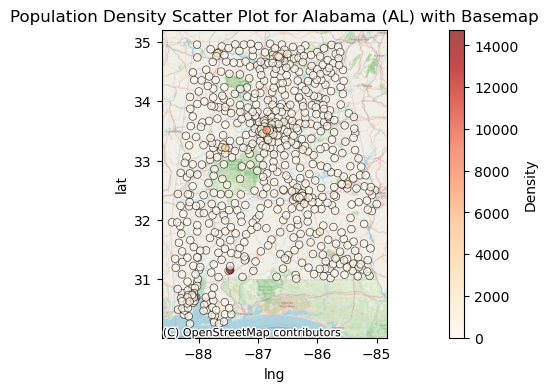

In [365]:
# Create a scatter plot with contextily basemap for the selected state (Alabama)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Alabama)
scatter = ax.scatter(AL_df['lng'], AL_df['lat'], c=AL_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Alabama (AL) with Basemap')

# Show the plot
plt.show()

In [366]:
# Filter counties with average density greater than 100 for Alabama
AL_high_density_df = result_df_AL[result_df_AL['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Alabama
AL_low_density_df = result_df_AL[result_df_AL['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {AL}:')
print(AL_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {AL}:')
print(AL_low_density_df.to_string(index=False))

Counties with Average Density > 100 in AL:
    County  Average Density
   Baldwin       112.904348
      Bibb       109.850000
    Blount       202.737500
   Calhoun       126.200000
   Colbert       160.700000
  Escambia      2965.260000
 Jefferson       681.657407
Lauderdale       506.055556
       Lee       435.555556
   Madison       347.995455
    Mobile       372.742105
Montgomery       481.077273
    Morgan       115.587500
      Pike       128.200000
   Russell       111.325000
    Shelby       144.123529
Tuscaloosa       349.315789


Counties with Average Density <= 100 in AL:
    County  Average Density
   Autauga        72.528571
   Barbour        10.940000
   Bullock         5.900000
    Butler         7.200000
  Chambers        35.066667
  Cherokee        21.080000
   Chilton        24.075000
   Choctaw         4.610000
    Clarke        13.880000
      Clay        23.500000
  Cleburne        12.560000
    Coffee        36.080000
   Conecuh         5.166667
     Coosa     

In [367]:
# Calculate the number of firebots for each county with average density > 100 in Alabama
AL_high_density_df['Number of Firebots'] = AL_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {AL}:')
print(AL_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in AL:
    County  Average Density  Number of Firebots
   Baldwin       112.904348            1.129043
      Bibb       109.850000            1.098500
    Blount       202.737500            2.027375
   Calhoun       126.200000            1.262000
   Colbert       160.700000            1.607000
  Escambia      2965.260000           29.652600
 Jefferson       681.657407            6.816574
Lauderdale       506.055556            5.060556
       Lee       435.555556            4.355556
   Madison       347.995455            3.479955
    Mobile       372.742105            3.727421
Montgomery       481.077273            4.810773
    Morgan       115.587500            1.155875
      Pike       128.200000            1.282000
   Russell       111.325000            1.113250
    Shelby       144.123529            1.441235
Tuscaloosa       349.315789            3.493158


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1998734974.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AL_high_density_df['Number of Firebots'] = AL_high_density_df['Average Density'] / 100


In [368]:
# Filter counties with average density less than or equal to 100 for Alabama
AL_low_density_df = result_df_AL[result_df_AL['Average Density'] <= 100]

# Count the number of counties with average density <= 100
AL_low_density_counties = len(AL_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Alabama (AL): {AL_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Alabama
total_firebots_high_density_AL = AL_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Alabama (AL):", total_firebots_high_density_AL)


Number of Counties with Average Density <= 100 in Alabama (AL): 50

Total Number of Firebots for High Density Counties in Alabama (AL): 73.5128701776594


In [369]:
# Display the total number of firebots for Alabama
print("Total Number of Firebots for Alabama:")
print(total_firebots_high_density_AL + AL_low_density_counties)

Total Number of Firebots for Alabama:
123.5128701776594


# Alaska

In [370]:
AK = 'AK'

# Filter the DataFrame for the selected state (Alaska)
AK_df = df[df['state_id'] == AK]

# Calculate the average population density per county
average_density_by_county_AK = AK_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_AK = pd.DataFrame({
    'County': average_density_by_county_AK.index,
    'Average Density': average_density_by_county_AK.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {AK}:')
print(result_df_AK.to_string(index=False))

Average Population Density by County in AK:
               County  Average Density
       Aleutians East         6.700000
       Aleutians West       131.942857
            Anchorage       501.847059
               Bethel        50.048148
          Bristol Bay         1.100000
              Chugach         1.500000
         Copper River         0.075000
               Denali         1.300000
           Dillingham         2.128571
 Fairbanks North Star       140.522222
               Haines         0.150000
        Hoonah-Angoon         1.533333
               Juneau       241.750000
      Kenai Peninsula         5.566667
    Ketchikan Gateway         2.700000
        Kodiak Island         3.000000
             Kusilvak        65.166667
   Lake and Peninsula         0.914286
    Matanuska-Susitna        21.418182
                 Nome        39.657143
          North Slope        18.440000
     Northwest Arctic       108.072727
           Petersburg         0.400000
Prince of Wales-Hyde

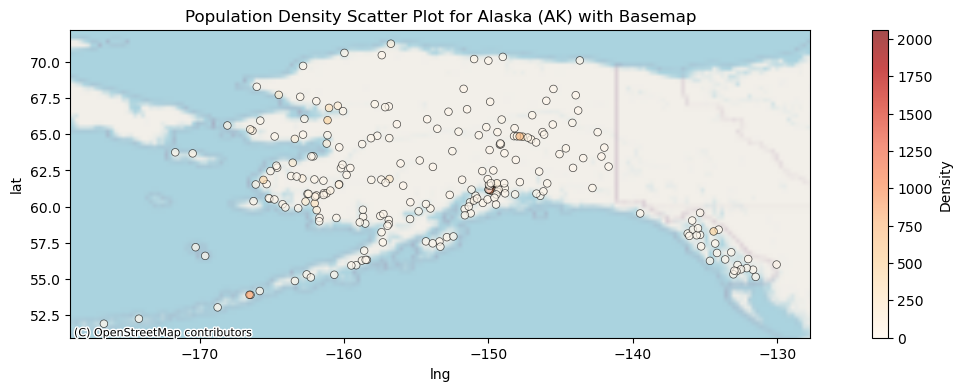

In [371]:
# Create a scatter plot with contextily basemap for the selected state (Alaska)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Alaska)
scatter = ax.scatter(AK_df['lng'], AK_df['lat'], c=AK_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Alaska (AK) with Basemap')

# Show the plot
plt.show()


In [372]:
# Filter counties with average density greater than 100 for Alaska
AK_high_density_df = result_df_AK[result_df_AK['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Alaska
AK_low_density_df = result_df_AK[result_df_AK['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {AK}:')
print(AK_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {AK}:')
print(AK_low_density_df.to_string(index=False))

Counties with Average Density > 100 in AK:
              County  Average Density
      Aleutians West       131.942857
           Anchorage       501.847059
Fairbanks North Star       140.522222
              Juneau       241.750000
    Northwest Arctic       108.072727


Counties with Average Density <= 100 in AK:
               County  Average Density
       Aleutians East         6.700000
               Bethel        50.048148
          Bristol Bay         1.100000
              Chugach         1.500000
         Copper River         0.075000
               Denali         1.300000
           Dillingham         2.128571
               Haines         0.150000
        Hoonah-Angoon         1.533333
      Kenai Peninsula         5.566667
    Ketchikan Gateway         2.700000
        Kodiak Island         3.000000
             Kusilvak        65.166667
   Lake and Peninsula         0.914286
    Matanuska-Susitna        21.418182
                 Nome        39.657143
          North Slop

In [373]:
# Calculate the number of firebots for each county with average density > 100 in Alaska
AK_high_density_df['Number of Firebots'] = AK_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {AK}:')
print(AK_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in AK:
              County  Average Density  Number of Firebots
      Aleutians West       131.942857            1.319429
           Anchorage       501.847059            5.018471
Fairbanks North Star       140.522222            1.405222
              Juneau       241.750000            2.417500
    Northwest Arctic       108.072727            1.080727


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1783574228.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AK_high_density_df['Number of Firebots'] = AK_high_density_df['Average Density'] / 100


In [374]:
# Filter counties with average density less than or equal to 100 for Alaska
AK_low_density_df = result_df_AK[result_df_AK['Average Density'] <= 100]

# Count the number of counties with average density <= 100
AK_low_density_counties = len(AK_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Alaska (AK): {AK_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Alaska
total_firebots_high_density_AK = AK_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Alaska (AK):", total_firebots_high_density_AK)


Number of Counties with Average Density <= 100 in Alaska (AK): 25

Total Number of Firebots for High Density Counties in Alaska (AK): 11.241348654613361


In [375]:
# Display the total number of firebots for Alaska
print("Total Number of Firebots for Alaska:")
print(total_firebots_high_density_AK + AK_low_density_counties)

Total Number of Firebots for Alaska:
36.24134865461336


# Arizona

In [51]:
AZ = 'AZ'

# Filter the DataFrame for the selected state
AZ_df = df[df['state_id'] == AZ]

# Calculate the average population density per county
average_density_by_county_AZ = AZ_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_AZ = pd.DataFrame({
    'County': average_density_by_county_AZ.index,
    'Average Density': average_density_by_county_AZ.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {AZ}:')
print(result_df_AZ.to_string(index=False))


Average Population Density by County in AZ:
    County  Average Density
    Apache         3.503571
   Cochise        87.104762
  Coconino       465.200000
      Gila        79.381818
    Graham        15.210000
  Greenlee         4.675000
    La Paz         3.087500
  Maricopa      1225.038060
  McKinley         9.600000
    Mohave        61.866667
    Navajo        11.673077
      Pima       517.311765
     Pinal        97.562069
Santa Cruz        13.300000
   Yavapai        65.596429
      Yuma       209.866667


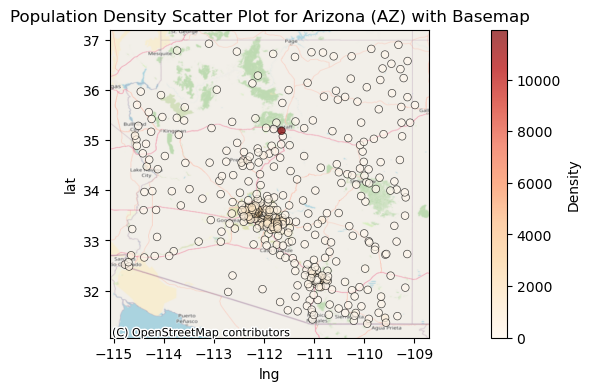

In [52]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(AZ_df['lng'], AZ_df['lat'], c=AZ_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Arizona (AZ) with Basemap')

# Show the plot
plt.show()

In [53]:
# Filter counties with average density greater than 100 for Arizona
AZ_high_density_df = result_df_AZ[result_df_AZ['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Arizona
AZ_low_density_df = result_df_AZ[result_df_AZ['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {AZ}:')
print(AZ_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {AZ}:')
print(AZ_low_density_df.to_string(index=False))

Counties with Average Density > 100 in AZ:
  County  Average Density
Coconino       465.200000
Maricopa      1225.038060
    Pima       517.311765
    Yuma       209.866667


Counties with Average Density <= 100 in AZ:
    County  Average Density
    Apache         3.503571
   Cochise        87.104762
      Gila        79.381818
    Graham        15.210000
  Greenlee         4.675000
    La Paz         3.087500
  McKinley         9.600000
    Mohave        61.866667
    Navajo        11.673077
     Pinal        97.562069
Santa Cruz        13.300000
   Yavapai        65.596429


In [54]:
# Calculate the number of firebots for each county with average density > 100
AZ_high_density_df['Number of Firebots'] = AZ_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {AZ}:')
print(AZ_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in AZ:
  County  Average Density  Number of Firebots
Coconino       465.200000            4.652000
Maricopa      1225.038060           12.250381
    Pima       517.311765            5.173118
    Yuma       209.866667            2.098667


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/505149597.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AZ_high_density_df['Number of Firebots'] = AZ_high_density_df['Average Density'] / 100


In [55]:
# Calculate the total sum of firebots for counties with average density > 100 in Arizona
total_firebots_high_density_AZ = AZ_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Arizona (AZ):", total_firebots_high_density_AZ)



Total Number of Firebots for High Density Counties in Arizona (AZ): 24.174164910740416


In [56]:
# Filter counties with average density less than or equal to 100 for Arizona
AZ_low_density_df = result_df_AZ[result_df_AZ['Average Density'] <= 100]

# Initialize variables
AZ_combined_density = 0
AZ_counties_to_combine = []

# Initialize a list to store the combined results
AZ_combined_results = []

# Iterate through counties until the sum of average density is over 100
for index, row in AZ_low_density_df.iterrows():
    AZ_combined_density += row['Average Density']
    AZ_counties_to_combine.append(row['County'])
    
    # Check if the sum is over 100
    if AZ_combined_density > 100:
        # Create a DataFrame for the combined counties
        AZ_combined_counties_df = result_df_AZ[result_df_AZ['County'].isin(AZ_counties_to_combine)]
        
        # Append the combined results to the list
        AZ_combined_results.append({
            'Combined Counties': '/'.join(AZ_counties_to_combine),
            'Avg Density': AZ_combined_counties_df['Average Density'].sum()
        })
        
        # Reset variables for the next iteration
        AZ_combined_density = 0
        AZ_counties_to_combine = []

# Display the results for Arizona
for result in AZ_combined_results:
    print(f"Combined Counties: {result['Combined Counties']}, Avg Density: {result['Avg Density']}")


Combined Counties: Apache/Cochise/Gila, Avg Density: 169.99015151515152
Combined Counties: Graham/Greenlee/La Paz/McKinley/Mohave/Navajo, Avg Density: 106.11224358974358
Combined Counties: Pinal/Santa Cruz, Avg Density: 110.86206896551724


In [57]:
AZ_combined_results_df = pd.DataFrame(AZ_combined_results)

# Calculate the number of firebots for each combined county
AZ_combined_results_df['Number of Firebots'] = AZ_combined_results_df['Avg Density'] / 100

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in AZ:")
print(AZ_combined_results_df.to_string(index=False))

Combined Counties with Total Average Density > 100 in AZ:
                            Combined Counties  Avg Density  Number of Firebots
                          Apache/Cochise/Gila   169.990152            1.699902
Graham/Greenlee/La Paz/McKinley/Mohave/Navajo   106.112244            1.061122
                             Pinal/Santa Cruz   110.862069            1.108621


In [58]:

# Calculate the total sum of firebots for combined counties in Arizona
total_firebots_AZ = AZ_combined_results_df['Number of Firebots'].sum()

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in AZ:")
print(AZ_combined_results_df.to_string(index=False))
print("\nTotal Number of Firebots in Arizona (AZ):", total_firebots_AZ)


Combined Counties with Total Average Density > 100 in AZ:
                            Combined Counties  Avg Density  Number of Firebots
                          Apache/Cochise/Gila   169.990152            1.699902
Graham/Greenlee/La Paz/McKinley/Mohave/Navajo   106.112244            1.061122
                             Pinal/Santa Cruz   110.862069            1.108621

Total Number of Firebots in Arizona (AZ): 3.8696446407041236


In [59]:
print("Total Number of Firebot for Arizona")
print(total_firebots_AZ + total_firebots_high_density_AZ)

Total Number of Firebot for Arizona
28.04380955144454


# Arkansas

In [60]:
AR = 'AR'

# Filter the DataFrame for the selected state
AR_df = df[df['state_id'] == AR]

# Calculate the average population density per county
average_density_by_county_AR = AR_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_AR = pd.DataFrame({
    'County': average_density_by_county_AR.index,
    'Average Density': average_density_by_county_AR.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {AR}:')
print(result_df_AR.to_string(index=False))

Average Population Density by County in AR:
      County  Average Density
    Arkansas         4.290000
      Ashley         5.900000
      Baxter        35.009091
      Benton       185.383333
       Boone        83.700000
     Bradley         5.775000
     Calhoun        16.033333
     Carroll        17.983333
      Chicot         4.700000
       Clark       762.566667
        Clay        29.309091
    Cleburne        14.350000
   Cleveland         4.133333
    Columbia         9.775000
      Conway        13.200000
   Craighead       164.453846
    Crawford        42.233333
  Crittenden        63.480000
       Cross         6.420000
      Dallas         4.940000
       Desha         4.675000
        Drew         7.450000
    Faulkner       529.981818
    Franklin        13.500000
      Fulton         5.266667
     Garland        55.887500
       Grant        10.775000
      Greene        17.020000
   Hempstead         6.057143
  Hot Spring        28.350000
      Howard         6.780

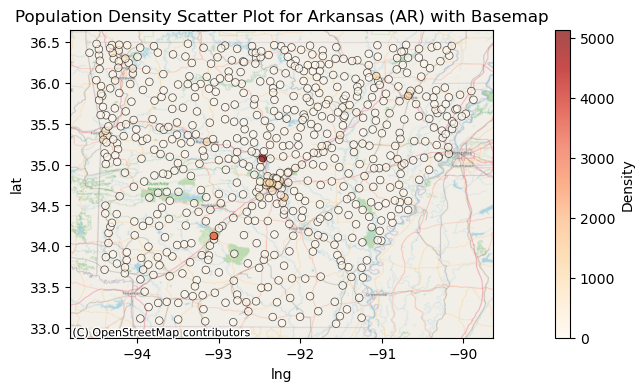

In [61]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(AR_df['lng'], AR_df['lat'], c=AR_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Arkansas (AR) with Basemap')

# Show the plot
plt.show()

In [62]:
# Filter counties with average density greater than 100 for Arkansas
AR_high_density_df = result_df_AR[result_df_AR['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Arkansas
AR_low_density_df = result_df_AR[result_df_AR['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {AR}:')
print(AR_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {AR}:')
print(AR_low_density_df.to_string(index=False))

Counties with Average Density > 100 in AR:
    County  Average Density
    Benton       185.383333
     Clark       762.566667
 Craighead       164.453846
  Faulkner       529.981818
  Lawrence       113.500000
      Pope       130.787500
   Pulaski       511.015385
    Saline       110.000000
 Sebastian       240.150000
Washington       123.100000


Counties with Average Density <= 100 in AR:
      County  Average Density
    Arkansas         4.290000
      Ashley         5.900000
      Baxter        35.009091
       Boone        83.700000
     Bradley         5.775000
     Calhoun        16.033333
     Carroll        17.983333
      Chicot         4.700000
        Clay        29.309091
    Cleburne        14.350000
   Cleveland         4.133333
    Columbia         9.775000
      Conway        13.200000
    Crawford        42.233333
  Crittenden        63.480000
       Cross         6.420000
      Dallas         4.940000
       Desha         4.675000
        Drew         7.450000
   

In [63]:
# Calculate the number of firebots for each county with average density > 100
AR_high_density_df['Number of Firebots'] = AR_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {AR}:')
print(AR_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))
#################################

# Calculate the total sum of firebots for counties with average density > 100 in Arkansas
total_firebots_high_density_AR = AR_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Arkansas (AR):", total_firebots_high_density_AR)


Counties with Average Density > 100 in AR:
    County  Average Density  Number of Firebots
    Benton       185.383333            1.853833
     Clark       762.566667            7.625667
 Craighead       164.453846            1.644538
  Faulkner       529.981818            5.299818
  Lawrence       113.500000            1.135000
      Pope       130.787500            1.307875
   Pulaski       511.015385            5.110154
    Saline       110.000000            1.100000
 Sebastian       240.150000            2.401500
Washington       123.100000            1.231000

Total Number of Firebots for High Density Counties in Arkansas (AR): 28.709385489510492


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2414567314.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AR_high_density_df['Number of Firebots'] = AR_high_density_df['Average Density'] / 100


In [64]:
# Filter counties with average density less than or equal to 100 for Arkansas
AR_low_density_df = result_df_AR[result_df_AR['Average Density'] <= 100]

# Initialize variables
AR_combined_density = 0
AR_counties_to_combine = []

# Initialize a list to store the combined results
AR_combined_results = []

# Iterate through counties until the sum of average density is over 100
for index, row in AR_low_density_df.iterrows():
    AR_combined_density += row['Average Density']
    AR_counties_to_combine.append(row['County'])
    
    # Check if the sum is over 100
    if AR_combined_density > 100:
        # Create a DataFrame for the combined counties
        AR_combined_counties_df = result_df_AR[result_df_AR['County'].isin(AR_counties_to_combine)]
        
        # Append the combined results to the list
        AR_combined_results.append({
            'Combined Counties': '/'.join(AR_counties_to_combine),
            'Avg Density': AR_combined_counties_df['Average Density'].sum()
        })
        
        # Reset variables for the next iteration
        AR_combined_density = 0
        AR_counties_to_combine = []
# Display the results for Arkansas
for result in AR_combined_results:
    print(f"Combined Counties: {result['Combined Counties']}, Avg Density: {result['Avg Density']}")


Combined Counties: Arkansas/Ashley/Baxter/Boone, Avg Density: 128.89909090909092
Combined Counties: Bradley/Calhoun/Carroll/Chicot/Clay/Cleburne/Cleveland/Columbia, Avg Density: 102.05909090909091
Combined Counties: Conway/Crawford/Crittenden, Avg Density: 118.91333333333333
Combined Counties: Cross/Dallas/Desha/Drew/Franklin/Fulton/Garland/Grant, Avg Density: 108.91416666666667
Combined Counties: Greene/Hempstead/Hot Spring/Howard/Independence/Izard/Jackson, Avg Density: 105.70555555555555
Combined Counties: Jefferson/Johnson/Lafayette/Lee/Lincoln/Little River, Avg Density: 107.29166666666667
Combined Counties: Logan/Lonoke/Madison/Marion/Miller, Avg Density: 109.05277777777778
Combined Counties: Mississippi/Monroe/Montgomery/Nevada/Newton/Ouachita/Perry/Phillips/Pike/Poinsett, Avg Density: 119.32590909090911
Combined Counties: Polk/Prairie/Randolph/Scott/Searcy/Sevier/Sharp/St. Francis, Avg Density: 123.02301587301585
Combined Counties: Stone/Tipton/Union/Van Buren/White, Avg Density

In [65]:
AR_combined_results_df = pd.DataFrame(AR_combined_results)

# Calculate the number of firebots for each combined county
AR_combined_results_df['Number of Firebots'] = AR_combined_results_df['Avg Density'] / 100

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in AR:")
print(AR_combined_results_df.to_string(index=False))

Combined Counties with Total Average Density > 100 in AR:
                                                                Combined Counties  Avg Density  Number of Firebots
                                                     Arkansas/Ashley/Baxter/Boone   128.899091            1.288991
                  Bradley/Calhoun/Carroll/Chicot/Clay/Cleburne/Cleveland/Columbia   102.059091            1.020591
                                                       Conway/Crawford/Crittenden   118.913333            1.189133
                            Cross/Dallas/Desha/Drew/Franklin/Fulton/Garland/Grant   108.914167            1.089142
                    Greene/Hempstead/Hot Spring/Howard/Independence/Izard/Jackson   105.705556            1.057056
                             Jefferson/Johnson/Lafayette/Lee/Lincoln/Little River   107.291667            1.072917
                                               Logan/Lonoke/Madison/Marion/Miller   109.052778            1.090528
Mississippi/Monroe/Mon

In [66]:
# Calculate the total sum of firebots for combined counties in Arkansas
total_firebots_AR = AR_combined_results_df['Number of Firebots'].sum()

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in AR:")
print(AR_combined_results_df.to_string(index=False))
print("\nTotal Number of Firebots in Arkansas (AR):", total_firebots_AR)


Combined Counties with Total Average Density > 100 in AR:
                                                                Combined Counties  Avg Density  Number of Firebots
                                                     Arkansas/Ashley/Baxter/Boone   128.899091            1.288991
                  Bradley/Calhoun/Carroll/Chicot/Clay/Cleburne/Cleveland/Columbia   102.059091            1.020591
                                                       Conway/Crawford/Crittenden   118.913333            1.189133
                            Cross/Dallas/Desha/Drew/Franklin/Fulton/Garland/Grant   108.914167            1.089142
                    Greene/Hempstead/Hot Spring/Howard/Independence/Izard/Jackson   105.705556            1.057056
                             Jefferson/Johnson/Lafayette/Lee/Lincoln/Little River   107.291667            1.072917
                                               Logan/Lonoke/Madison/Marion/Miller   109.052778            1.090528
Mississippi/Monroe/Mon

In [67]:
print("Total Number of Firebot for Arkansas")
print(total_firebots_AR + total_firebots_high_density_AR)

Total Number of Firebot for Arkansas
40.27264227161727


#  California 

In [68]:
CA = 'CA'

# Filter the DataFrame for the selected state
CA_df = df[df['state_id'] == CA]

# Calculate the average population density per county
average_density_by_county_CA = CA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_CA = pd.DataFrame({
    'County': average_density_by_county_CA.index,
    'Average Density': average_density_by_county_CA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {CA}:')
print(result_df_CA.to_string(index=False))


Average Population Density by County in CA:
         County  Average Density
        Alameda      2837.983673
         Alpine         2.033333
         Amador       116.554545
          Butte       197.980000
      Calaveras        56.861111
         Colusa         8.233333
   Contra Costa      1085.734884
      Del Norte        55.200000
      El Dorado        69.817391
         Fresno       697.634545
          Glenn        12.237500
       Humboldt        86.294286
       Imperial        60.246667
           Inyo         2.355556
           Kern       300.489362
          Kings       187.175000
           Lake       751.592857
         Lassen         6.287500
    Los Angeles      3317.284746
         Madera        35.169231
          Marin       424.462069
       Mariposa         3.612500
      Mendocino        10.834615
         Merced       124.473684
          Modoc         1.040000
           Mono         4.187500
       Monterey       493.896774
           Napa       117.350000

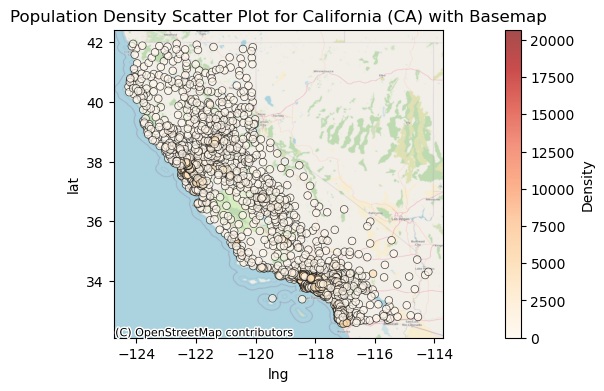

In [69]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(CA_df['lng'], CA_df['lat'], c=CA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for California (CA) with Basemap')

# Show the plot
plt.show()

In [70]:
# Filter counties with average density greater than 100 for California
CA_high_density_df = result_df_CA[result_df_CA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for California
CA_low_density_df = result_df_CA[result_df_CA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {CA}:')
print(CA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {CA}:')
print(CA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in CA:
         County  Average Density
        Alameda      2837.983673
         Amador       116.554545
          Butte       197.980000
   Contra Costa      1085.734884
         Fresno       697.634545
           Kern       300.489362
          Kings       187.175000
           Lake       751.592857
    Los Angeles      3317.284746
          Marin       424.462069
         Merced       124.473684
       Monterey       493.896774
           Napa       117.350000
         Orange      2356.536364
         Placer       297.893333
      Riverside       615.125352
     Sacramento      1366.656364
 San Bernardino       682.104396
      San Diego      1332.248696
  San Francisco      8145.700000
    San Joaquin       928.890000
San Luis Obispo       543.726087
      San Mateo      1582.203333
  Santa Barbara       575.875000
    Santa Clara      2235.636207
     Santa Cruz       794.629412
         Solano       563.426667
         Sonoma       307.136842


In [71]:
CA_high_density_df['Number of Firebots'] = CA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {CA}:')
print(CA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))

Counties with Average Density > 100 in CA:
         County  Average Density  Number of Firebots
        Alameda      2837.983673           28.379837
         Amador       116.554545            1.165545
          Butte       197.980000            1.979800
   Contra Costa      1085.734884           10.857349
         Fresno       697.634545            6.976345
           Kern       300.489362            3.004894
          Kings       187.175000            1.871750
           Lake       751.592857            7.515929
    Los Angeles      3317.284746           33.172847
          Marin       424.462069            4.244621
         Merced       124.473684            1.244737
       Monterey       493.896774            4.938968
           Napa       117.350000            1.173500
         Orange      2356.536364           23.565364
         Placer       297.893333            2.978933
      Riverside       615.125352            6.151254
     Sacramento      1366.656364           13.666564
 Sa

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/3580535850.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CA_high_density_df['Number of Firebots'] = CA_high_density_df['Average Density'] / 100


In [72]:
# Calculate the total sum of firebots for counties with average density > 100 in California
total_firebots_high_density_CA = CA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in California (CA):", total_firebots_high_density_CA)



Total Number of Firebots for High Density Counties in California (CA): 347.0079631054899


In [73]:
# Filter counties with average density less than or equal to 100 for California
CA_low_density_df = result_df_CA[result_df_CA['Average Density'] <= 100]

# Initialize variables
CA_combined_density = 0
CA_counties_to_combine = []

# Initialize a list to store the combined results
CA_combined_results = []

# Iterate through counties until the sum of average density is over 100
for index, row in CA_low_density_df.iterrows():
    CA_combined_density += row['Average Density']
    CA_counties_to_combine.append(row['County'])
    
    # Check if the sum is over 100
    if CA_combined_density > 100:
        # Create a DataFrame for the combined counties
        CA_combined_counties_df = result_df_CA[result_df_CA['County'].isin(CA_counties_to_combine)]
        
        # Append the combined results to the list
        CA_combined_results.append({
            'Combined Counties': '/'.join(CA_counties_to_combine),
            'Avg Density': CA_combined_counties_df['Average Density'].sum()
        })
        
        # Reset variables for the next iteration
        CA_combined_density = 0
        CA_counties_to_combine = []

# Display the results for California
for result in CA_combined_results:
    print(f"Combined Counties: {result['Combined Counties']}, Avg Density: {result['Avg Density']}")


Combined Counties: Alpine/Calaveras/Colusa/Del Norte, Avg Density: 122.32777777777778
Combined Counties: El Dorado/Glenn/Humboldt, Avg Density: 168.34917701863355
Combined Counties: Imperial/Inyo/Lassen/Madera, Avg Density: 104.05895299145298
Combined Counties: Mariposa/Mendocino/Modoc/Mono/Nevada/Plumas/San Benito, Avg Density: 102.4933653846154
Combined Counties: Shasta/Sierra/Siskiyou/Sutter, Avg Density: 136.46428571428572
Combined Counties: Tehama/Trinity/Tuolumne/Yuba, Avg Density: 133.25228937728937


In [74]:
CA_combined_results_df = pd.DataFrame(CA_combined_results)

# Calculate the number of firebots for each combined county
CA_combined_results_df['Number of Firebots'] = CA_combined_results_df['Avg Density'] / 100

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in CA:")
print(CA_combined_results_df.to_string(index=False))

Combined Counties with Total Average Density > 100 in CA:
                                     Combined Counties  Avg Density  Number of Firebots
                     Alpine/Calaveras/Colusa/Del Norte   122.327778            1.223278
                              El Dorado/Glenn/Humboldt   168.349177            1.683492
                           Imperial/Inyo/Lassen/Madera   104.058953            1.040590
Mariposa/Mendocino/Modoc/Mono/Nevada/Plumas/San Benito   102.493365            1.024934
                         Shasta/Sierra/Siskiyou/Sutter   136.464286            1.364643
                          Tehama/Trinity/Tuolumne/Yuba   133.252289            1.332523


In [75]:
# Calculate the total sum of firebots for combined counties in California
total_firebots_CA = CA_combined_results_df['Number of Firebots'].sum()

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in CA:")
print(CA_combined_results_df.to_string(index=False))
print("\nTotal Number of Firebots in California (CA):", total_firebots_CA)

Combined Counties with Total Average Density > 100 in CA:
                                     Combined Counties  Avg Density  Number of Firebots
                     Alpine/Calaveras/Colusa/Del Norte   122.327778            1.223278
                              El Dorado/Glenn/Humboldt   168.349177            1.683492
                           Imperial/Inyo/Lassen/Madera   104.058953            1.040590
Mariposa/Mendocino/Modoc/Mono/Nevada/Plumas/San Benito   102.493365            1.024934
                         Shasta/Sierra/Siskiyou/Sutter   136.464286            1.364643
                          Tehama/Trinity/Tuolumne/Yuba   133.252289            1.332523

Total Number of Firebots in California (CA): 7.6694584826405485


In [76]:
print("Total Number of Firebot for California")
print(total_firebots_CA + total_firebots_high_density_CA)

Total Number of Firebot for California
354.67742158813047


# Colorado

In [77]:
CO = 'CO'

# Filter the DataFrame for the selected state
CO_df = df[df['state_id'] == CO]

# Calculate the average population density per county
average_density_by_county_CO = CO_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_CO = pd.DataFrame({
    'County': average_density_by_county_CO.index,
    'Average Density': average_density_by_county_CO.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {CO}:')
print(result_df_CO.to_string(index=False))

Average Population Density by County in CO:
     County  Average Density
      Adams      1058.285000
    Alamosa         6.400000
   Arapahoe      1355.741176
  Archuleta        11.500000
       Baca         0.666667
       Bent         1.800000
    Boulder       624.177778
 Broomfield       794.150000
    Chaffee         6.083333
   Cheyenne         0.325000
Clear Creek        15.500000
    Conejos       111.633333
   Costilla         3.566667
    Crowley        32.300000
     Custer         2.250000
      Delta        10.833333
     Denver      2897.887097
    Dolores         2.140000
    Douglas       543.821429
      Eagle        16.400000
    El Paso       614.697561
     Elbert         8.028571
    Fremont        38.566667
   Garfield        10.283333
     Gilpin        14.266667
      Grand         7.287500
   Gunnison         2.580000
   Hinsdale         0.600000
   Huerfano         2.000000
    Jackson         0.375000
  Jefferson       866.696296
      Kiowa         0.200000

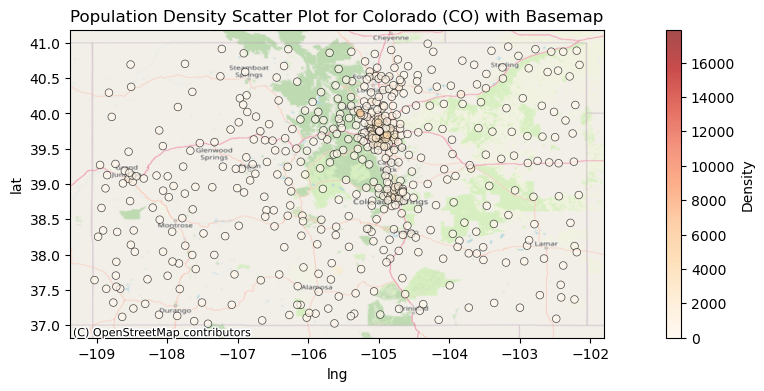

In [78]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(CO_df['lng'], CO_df['lat'], c=CO_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Colorado (CO) with Basemap')

# Show the plot
plt.show()

In [79]:
# Filter counties with average density greater than 100 for Colorado
CO_high_density_df = result_df_CO[result_df_CO['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Colorado
CO_low_density_df = result_df_CO[result_df_CO['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {CO}:')
print(CO_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {CO}:')
print(CO_low_density_df.to_string(index=False))

Counties with Average Density > 100 in CO:
    County  Average Density
     Adams      1058.285000
  Arapahoe      1355.741176
   Boulder       624.177778
Broomfield       794.150000
   Conejos       111.633333
    Denver      2897.887097
   Douglas       543.821429
   El Paso       614.697561
 Jefferson       866.696296
   Larimer       240.911765
   Lincoln       268.642857
      Mesa       143.947059
    Morgan       152.100000
    Pueblo       100.075000
      Weld       208.851429


Counties with Average Density <= 100 in CO:
     County  Average Density
    Alamosa         6.400000
  Archuleta        11.500000
       Baca         0.666667
       Bent         1.800000
    Chaffee         6.083333
   Cheyenne         0.325000
Clear Creek        15.500000
   Costilla         3.566667
    Crowley        32.300000
     Custer         2.250000
      Delta        10.833333
    Dolores         2.140000
      Eagle        16.400000
     Elbert         8.028571
    Fremont        38.566667

In [80]:
# Calculate the number of firebots for each county with average density > 100
CO_high_density_df['Number of Firebots'] = CO_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {CO}:')
print(CO_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))
#################################

# Calculate the total sum of firebots for counties with average density > 100 in Colorado
total_firebots_high_density_CO = CO_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Colorado (CO):", total_firebots_high_density_CO)


Counties with Average Density > 100 in CO:
    County  Average Density  Number of Firebots
     Adams      1058.285000           10.582850
  Arapahoe      1355.741176           13.557412
   Boulder       624.177778            6.241778
Broomfield       794.150000            7.941500
   Conejos       111.633333            1.116333
    Denver      2897.887097           28.978871
   Douglas       543.821429            5.438214
   El Paso       614.697561            6.146976
 Jefferson       866.696296            8.666963
   Larimer       240.911765            2.409118
   Lincoln       268.642857            2.686429
      Mesa       143.947059            1.439471
    Morgan       152.100000            1.521000
    Pueblo       100.075000            1.000750
      Weld       208.851429            2.088514

Total Number of Firebots for High Density Counties in Colorado (CO): 99.81617779442924


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1005026750.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CO_high_density_df['Number of Firebots'] = CO_high_density_df['Average Density'] / 100


In [81]:
# Filter counties with average density less than or equal to 100 for Colorado
CO_low_density_df = result_df_CO[result_df_CO['Average Density'] <= 100]

# Initialize variables
CO_combined_density = 0
CO_counties_to_combine = []

# Initialize a list to store the combined results
CO_combined_results = []

# Iterate through counties until the sum of average density is over 100
for index, row in CO_low_density_df.iterrows():
    CO_combined_density += row['Average Density']
    CO_counties_to_combine.append(row['County'])
    
    # Check if the sum is over 100
    if CO_combined_density > 100:
        # Create a DataFrame for the combined counties
        CO_combined_counties_df = result_df_CO[result_df_CO['County'].isin(CO_counties_to_combine)]
        
        # Append the combined results to the list
        CO_combined_results.append({
            'Combined Counties': '/'.join(CO_counties_to_combine),
            'Avg Density': CO_combined_counties_df['Average Density'].sum()
        })
        
        # Reset variables for the next iteration
        CO_combined_density = 0
        CO_counties_to_combine = []

# Display the results for Colorado
for result in CO_combined_results:
    print(f"Combined Counties: {result['Combined Counties']}, Avg Density: {result['Avg Density']}")


Combined Counties: Alamosa/Archuleta/Baca/Bent/Chaffee/Cheyenne/Clear Creek/Costilla/Crowley/Custer/Delta/Dolores/Eagle, Avg Density: 109.76499999999999
Combined Counties: Elbert/Fremont/Garfield/Gilpin/Grand/Gunnison/Hinsdale/Huerfano/Jackson/Kiowa/Kit Carson/La Plata/Lake, Avg Density: 103.06773809523811
Combined Counties: Las Animas/Logan/Mineral/Moffat/Montezuma/Montrose/Otero/Ouray/Park/Phillips/Pitkin, Avg Density: 109.94103174603175


In [82]:
CO_combined_results_df = pd.DataFrame(CO_combined_results)

# Calculate the number of firebots for each combined county
CO_combined_results_df['Number of Firebots'] = CO_combined_results_df['Avg Density'] / 100

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in CO:")
print(CO_combined_results_df.to_string(index=False))

Combined Counties with Total Average Density > 100 in CO:
                                                                                     Combined Counties  Avg Density  Number of Firebots
  Alamosa/Archuleta/Baca/Bent/Chaffee/Cheyenne/Clear Creek/Costilla/Crowley/Custer/Delta/Dolores/Eagle   109.765000            1.097650
Elbert/Fremont/Garfield/Gilpin/Grand/Gunnison/Hinsdale/Huerfano/Jackson/Kiowa/Kit Carson/La Plata/Lake   103.067738            1.030677
                   Las Animas/Logan/Mineral/Moffat/Montezuma/Montrose/Otero/Ouray/Park/Phillips/Pitkin   109.941032            1.099410


In [83]:
# Calculate the total sum of firebots for combined counties in Colorado
total_firebots_CO = CO_combined_results_df['Number of Firebots'].sum()

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in CO:")
print(CO_combined_results_df.to_string(index=False))
print("\nTotal Number of Firebots in Colorado (CO):", total_firebots_CO)


Combined Counties with Total Average Density > 100 in CO:
                                                                                     Combined Counties  Avg Density  Number of Firebots
  Alamosa/Archuleta/Baca/Bent/Chaffee/Cheyenne/Clear Creek/Costilla/Crowley/Custer/Delta/Dolores/Eagle   109.765000            1.097650
Elbert/Fremont/Garfield/Gilpin/Grand/Gunnison/Hinsdale/Huerfano/Jackson/Kiowa/Kit Carson/La Plata/Lake   103.067738            1.030677
                   Las Animas/Logan/Mineral/Moffat/Montezuma/Montrose/Otero/Ouray/Park/Phillips/Pitkin   109.941032            1.099410

Total Number of Firebots in Colorado (CO): 3.2277376984126986


In [84]:
print("Total Number of Firebot for Colorado")
print(total_firebots_CO + total_firebots_high_density_CO)

Total Number of Firebot for Colorado
103.04391549284193


# Connecticut 

In [85]:
CT = 'CT'

# Filter the DataFrame for the selected state
CT_df = df[df['state_id'] == CT]

# Calculate the average population density per county
average_density_by_county_CT = CT_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_CT = pd.DataFrame({
    'County': average_density_by_county_CT.index,
    'Average Density': average_density_by_county_CT.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {CT}:')
print(result_df_CT.to_string(index=False))

Average Population Density by County in CT:
                        County  Average Density
                       Capitol       749.301408
            Greater Bridgeport      1911.371429
Lower Connecticut River Valley       232.473077
              Naugatuck Valley       784.296154
      Northeastern Connecticut       191.523077
               Northwest Hills        88.064706
     South Central Connecticut      1195.791667
      Southeastern Connecticut       264.493939
           Western Connecticut      1008.150000


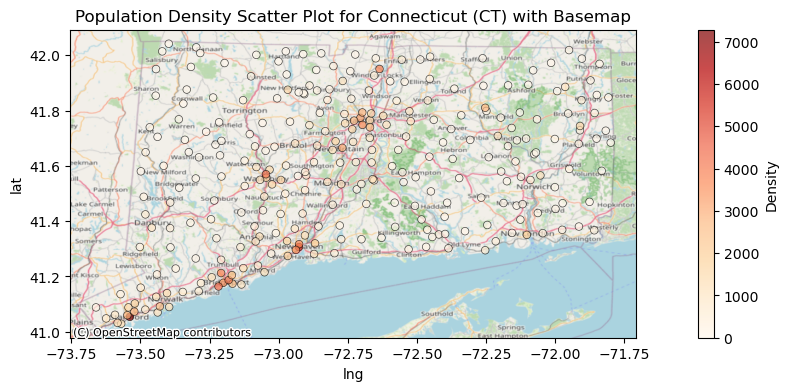

In [86]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(CT_df['lng'], CT_df['lat'], c=CT_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Connecticut (CT) with Basemap')

# Show the plot
plt.show()

In [87]:
# Filter counties with average density greater than 100 for Connecticut
CT_high_density_df = result_df_CT[result_df_CT['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Connecticut
CT_low_density_df = result_df_CT[result_df_CT['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {CT}:')
print(CT_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {CT}:')
print(CT_low_density_df.to_string(index=False))

Counties with Average Density > 100 in CT:
                        County  Average Density
                       Capitol       749.301408
            Greater Bridgeport      1911.371429
Lower Connecticut River Valley       232.473077
              Naugatuck Valley       784.296154
      Northeastern Connecticut       191.523077
     South Central Connecticut      1195.791667
      Southeastern Connecticut       264.493939
           Western Connecticut      1008.150000


Counties with Average Density <= 100 in CT:
         County  Average Density
Northwest Hills        88.064706


In [88]:
# Calculate the number of firebots for each county with average density > 100
CT_high_density_df['Number of Firebots'] = CT_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {CT}:')
print(CT_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))
#################################

# Calculate the total sum of firebots for counties with average density > 100 in Connecticut
total_firebots_high_density_CT = CT_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Connecticut (CT):", total_firebots_high_density_CT)


Counties with Average Density > 100 in CT:
                        County  Average Density  Number of Firebots
                       Capitol       749.301408            7.493014
            Greater Bridgeport      1911.371429           19.113714
Lower Connecticut River Valley       232.473077            2.324731
              Naugatuck Valley       784.296154            7.842962
      Northeastern Connecticut       191.523077            1.915231
     South Central Connecticut      1195.791667           11.957917
      Southeastern Connecticut       264.493939            2.644939
           Western Connecticut      1008.150000           10.081500

Total Number of Firebots for High Density Counties in Connecticut (CT): 63.37400750775047


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/37614549.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CT_high_density_df['Number of Firebots'] = CT_high_density_df['Average Density'] / 100


In [89]:
# Since there is only 1 county, adding one fb for northwest hills
total_firebots_CT = 1

In [90]:
print("Total Number of Firebot for Connecticut")
print(total_firebots_CT + total_firebots_high_density_CT)

Total Number of Firebot for Connecticut
64.37400750775046


# Delaware

In [91]:
DE = 'DE'

# Filter the DataFrame for the selected state
DE_df = df[df['state_id'] == DE]

# Calculate the average population density per county
average_density_by_county_DE = DE_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_DE = pd.DataFrame({
    'County': average_density_by_county_DE.index,
    'Average Density': average_density_by_county_DE.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {DE}:')
print(result_df_DE.to_string(index=False))

Average Population Density by County in DE:
    County  Average Density
      Kent       225.452941
New Castle      1070.951724
    Sussex       141.218182


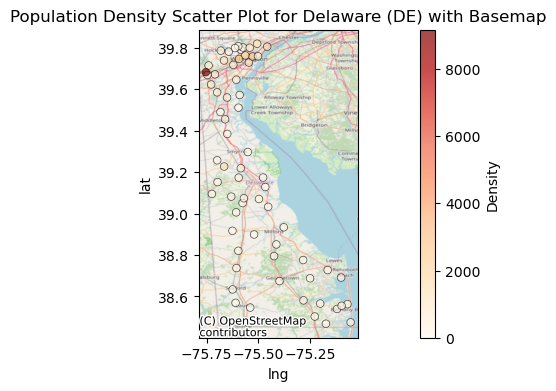

In [92]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(DE_df['lng'], DE_df['lat'], c=DE_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Delaware (DE) with Basemap')

# Show the plot
plt.show()

In [93]:
# Filter counties with average density greater than 100 for Delaware
DE_high_density_df = result_df_DE[result_df_DE['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Delaware
DE_low_density_df = result_df_DE[result_df_DE['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {DE}:')
print(DE_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {DE}:')
print(DE_low_density_df.to_string(index=False))

Counties with Average Density > 100 in DE:
    County  Average Density
      Kent       225.452941
New Castle      1070.951724
    Sussex       141.218182


Counties with Average Density <= 100 in DE:
Empty DataFrame
Columns: [County, Average Density]
Index: []


In [94]:
# no county under 100! yay
DE_high_density_df['Number of Firebots'] = DE_high_density_df['Average Density'] / 100


In [95]:
total_firebots_high_density_DE = DE_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for Delaware (DE):", total_firebots_high_density_DE)



Total Number of Firebots for Delaware (DE): 14.376228471325833


# Florida

In [96]:
FL = 'FL'

# Filter the DataFrame for the selected state
FL_df = df[df['state_id'] == FL]

# Calculate the average population density per county
average_density_by_county_FL = FL_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_FL = pd.DataFrame({
    'County': average_density_by_county_FL.index,
    'Average Density': average_density_by_county_FL.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {FL}:')
print(result_df_FL.to_string(index=False))

Average Population Density by County in FL:
      County  Average Density
     Alachua       599.128571
       Baker        38.066667
         Bay       299.491667
    Bradford        30.450000
     Brevard       479.073333
     Broward      1875.680000
     Calhoun        10.650000
   Charlotte       394.200000
      Citrus       110.680000
        Clay       453.428571
     Collier       497.072727
    Columbia        36.283333
      DeSoto        48.750000
       Dixie        11.400000
       Duval       848.891667
    Escambia       498.842105
     Flagler       271.750000
    Franklin        22.200000
     Gadsden        53.557143
   Gilchrist        19.750000
      Glades        11.233333
        Gulf        18.950000
    Hamilton        12.200000
      Hardee        17.500000
      Hendry        80.350000
    Hernando       321.880000
   Highlands        74.225000
Hillsborough      1043.981818
      Holmes        14.000000
Indian River       325.500000
     Jackson        18.275

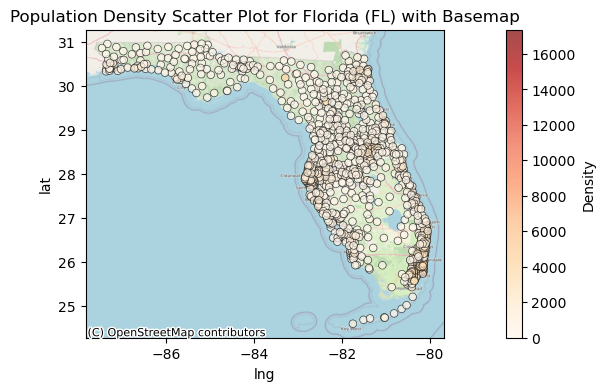

In [97]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(FL_df['lng'], FL_df['lat'], c=FL_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Florida (FL) with Basemap')

# Show the plot
plt.show()


In [98]:
# Filter counties with average density greater than 100 for Florida
FL_high_density_df = result_df_FL[result_df_FL['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Florida
FL_low_density_df = result_df_FL[result_df_FL['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {FL}:')
print(FL_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {FL}:')
print(FL_low_density_df.to_string(index=False))

Counties with Average Density > 100 in FL:
      County  Average Density
     Alachua       599.128571
         Bay       299.491667
     Brevard       479.073333
     Broward      1875.680000
   Charlotte       394.200000
      Citrus       110.680000
        Clay       453.428571
     Collier       497.072727
       Duval       848.891667
    Escambia       498.842105
     Flagler       271.750000
    Hernando       321.880000
Hillsborough      1043.981818
Indian River       325.500000
   Lafayette      1386.866667
        Lake       238.333333
         Lee       586.841176
        Leon       772.271429
     Manatee       687.740000
      Marion       191.765517
      Martin       331.212500
  Miami-Dade      2829.558750
      Monroe       333.211111
    Okaloosa       415.684615
      Orange      1108.157778
     Osceola       586.684615
  Palm Beach      1248.994000
       Pasco       584.504167
    Pinellas      1442.764583
        Polk       323.542500
  Santa Rosa       174.5000

In [99]:
# Calculate the number of firebots for each county with average density > 100
FL_high_density_df['Number of Firebots'] = FL_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {FL}:')
print(FL_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))
#################################

# Calculate the total sum of firebots for counties with average density > 100 in Florida
total_firebots_high_density_FL = FL_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Florida (FL):", total_firebots_high_density_FL)


Counties with Average Density > 100 in FL:
      County  Average Density  Number of Firebots
     Alachua       599.128571            5.991286
         Bay       299.491667            2.994917
     Brevard       479.073333            4.790733
     Broward      1875.680000           18.756800
   Charlotte       394.200000            3.942000
      Citrus       110.680000            1.106800
        Clay       453.428571            4.534286
     Collier       497.072727            4.970727
       Duval       848.891667            8.488917
    Escambia       498.842105            4.988421
     Flagler       271.750000            2.717500
    Hernando       321.880000            3.218800
Hillsborough      1043.981818           10.439818
Indian River       325.500000            3.255000
   Lafayette      1386.866667           13.868667
        Lake       238.333333            2.383333
         Lee       586.841176            5.868412
        Leon       772.271429            7.722714
     Ma

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/4215981677.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  FL_high_density_df['Number of Firebots'] = FL_high_density_df['Average Density'] / 100


In [100]:
# Filter counties with average density less than or equal to 100 for Florida
FL_low_density_df = result_df_FL[result_df_FL['Average Density'] <= 100]

# Initialize variables
FL_combined_density = 0
FL_counties_to_combine = []

# Initialize a list to store the combined results
FL_combined_results = []

# Iterate through counties until the sum of average density is over 100
for index, row in FL_low_density_df.iterrows():
    FL_combined_density += row['Average Density']
    FL_counties_to_combine.append(row['County'])
    
    # Check if the sum is over 100
    if FL_combined_density > 100:
        # Create a DataFrame for the combined counties
        FL_combined_counties_df = result_df_FL[result_df_FL['County'].isin(FL_counties_to_combine)]
        
        # Append the combined results to the list
        FL_combined_results.append({
            'Combined Counties': '/'.join(FL_counties_to_combine),
            'Avg Density': FL_combined_counties_df['Average Density'].sum()
        })
        
        # Reset variables for the next iteration
        FL_combined_density = 0
        FL_counties_to_combine = []

# Display the results for Florida
for result in FL_combined_results:
    print(f"Combined Counties: {result['Combined Counties']}, Avg Density: {result['Avg Density']}")


Combined Counties: Baker/Bradford/Calhoun/Columbia, Avg Density: 115.45
Combined Counties: DeSoto/Dixie/Franklin/Gadsden, Avg Density: 135.90714285714284
Combined Counties: Gilchrist/Glades/Gulf/Hamilton/Hardee/Hendry, Avg Density: 159.98333333333335
Combined Counties: Highlands/Holmes/Jackson, Avg Density: 106.5
Combined Counties: Jefferson/Levy, Avg Density: 106.04444444444442
Combined Counties: Liberty/Madison/Nassau, Avg Density: 128.88666666666666
Combined Counties: Okeechobee/Putnam/Suwannee, Avg Density: 140.2076923076923


In [101]:
FL_combined_results_df = pd.DataFrame(FL_combined_results)

# Calculate the number of firebots for each combined county
FL_combined_results_df['Number of Firebots'] = FL_combined_results_df['Avg Density'] / 100

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in FL:")
print(FL_combined_results_df.to_string(index=False))

Combined Counties with Total Average Density > 100 in FL:
                           Combined Counties  Avg Density  Number of Firebots
             Baker/Bradford/Calhoun/Columbia   115.450000            1.154500
               DeSoto/Dixie/Franklin/Gadsden   135.907143            1.359071
Gilchrist/Glades/Gulf/Hamilton/Hardee/Hendry   159.983333            1.599833
                    Highlands/Holmes/Jackson   106.500000            1.065000
                              Jefferson/Levy   106.044444            1.060444
                      Liberty/Madison/Nassau   128.886667            1.288867
                  Okeechobee/Putnam/Suwannee   140.207692            1.402077


In [102]:
# Calculate the total sum of firebots for combined counties in Florida
total_firebots_FL = FL_combined_results_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots in Florida (FL):", total_firebots_FL)


Total Number of Firebots in Florida (FL): 8.929792796092796


In [103]:
print("Total Number of Firebot for Florida")
print(total_firebots_FL + total_firebots_high_density_FL)

Total Number of Firebot for Florida
255.16001062422626


# Georgia

In [104]:
GA = 'GA'

# Filter the DataFrame for the selected state
GA_df = df[df['state_id'] == GA]

# Calculate the average population density per county
average_density_by_county_GA = GA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_GA = pd.DataFrame({
    'County': average_density_by_county_GA.index,
    'Average Density': average_density_by_county_GA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {GA}:')
print(result_df_GA.to_string(index=False))

Average Population Density by County in GA:
       County  Average Density
      Appling        10.000000
     Atkinson         9.000000
        Bacon        15.800000
        Baker         3.900000
      Baldwin       395.200000
        Banks        43.875000
       Barrow       217.050000
       Bartow        96.037500
     Ben Hill        24.700000
      Berrien        19.350000
         Bibb       601.166667
     Bleckley        24.200000
     Brantley        14.375000
       Brooks        14.433333
        Bryan        53.666667
      Bulloch        34.900000
        Burke         8.850000
        Butts        53.666667
      Calhoun         7.275000
       Camden        55.850000
      Candler        21.566667
      Carroll       305.588889
      Catoosa       181.266667
     Charlton         6.700000
      Chatham       456.753333
Chattahoochee        40.400000
    Chattooga        32.875000
     Cherokee       363.971429
       Clarke      1191.360000
         Clay         5.40

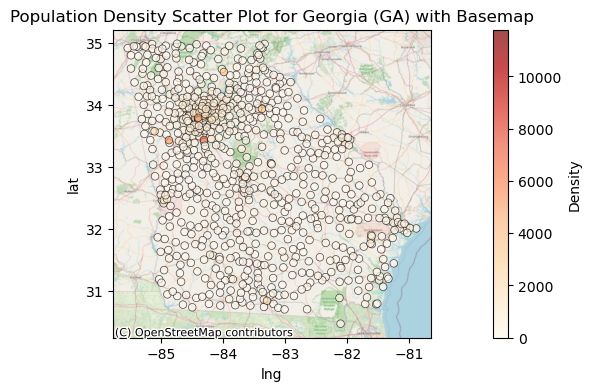

In [105]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(GA_df['lng'], GA_df['lat'], c=GA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Georgia (GA) with Basemap')

# Show the plot
plt.show()

In [106]:
# Filter counties with average density greater than 100 for Georgia
GA_high_density_df = result_df_GA[result_df_GA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Georgia
GA_low_density_df = result_df_GA[result_df_GA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {GA}:')
print(GA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {GA}:')
print(GA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in GA:
   County  Average Density
  Baldwin       395.200000
   Barrow       217.050000
     Bibb       601.166667
  Carroll       305.588889
  Catoosa       181.266667
  Chatham       456.753333
 Cherokee       363.971429
   Clarke      1191.360000
  Clayton      1713.000000
   Clinch       103.366667
     Cobb       848.057895
 Colquitt       324.037500
 Columbia       337.220000
   Coweta       746.855556
   DeKalb      1364.672414
Dougherty       216.340000
  Douglas       287.425000
  Fayette       251.020000
  Forsyth       421.966667
   Fulton      1753.923684
    Glynn       107.442857
 Gwinnett       944.131250
     Hall       248.520000
    Henry       307.020000
  Houston       340.375000
  Jackson       109.822222
  Liberty       274.512500
  Lowndes       359.737500
  Lumpkin      1660.450000
 Muscogee       613.800000
   Newton       214.820000
 Paulding       256.866667
 Richmond       444.255556
 Rockdale       329.133333
 Spalding   

In [107]:
# Calculate the number of firebots for each county with average density > 100
GA_high_density_df['Number of Firebots'] = GA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {GA}:')
print(GA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))

Counties with Average Density > 100 in GA:
   County  Average Density  Number of Firebots
  Baldwin       395.200000            3.952000
   Barrow       217.050000            2.170500
     Bibb       601.166667            6.011667
  Carroll       305.588889            3.055889
  Catoosa       181.266667            1.812667
  Chatham       456.753333            4.567533
 Cherokee       363.971429            3.639714
   Clarke      1191.360000           11.913600
  Clayton      1713.000000           17.130000
   Clinch       103.366667            1.033667
     Cobb       848.057895            8.480579
 Colquitt       324.037500            3.240375
 Columbia       337.220000            3.372200
   Coweta       746.855556            7.468556
   DeKalb      1364.672414           13.646724
Dougherty       216.340000            2.163400
  Douglas       287.425000            2.874250
  Fayette       251.020000            2.510200
  Forsyth       421.966667            4.219667
   Fulton      17

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/831744384.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  GA_high_density_df['Number of Firebots'] = GA_high_density_df['Average Density'] / 100


In [108]:
# Calculate the total sum of firebots for counties with average density > 100 in Georgia
total_firebots_high_density_GA = GA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Georgia (GA):", total_firebots_high_density_GA)



Total Number of Firebots for High Density Counties in Georgia (GA): 190.12762584010312


In [109]:
# Filter counties with average density less than or equal to 100 for Georgia
GA_low_density_df = result_df_GA[result_df_GA['Average Density'] <= 100]

# Initialize variables
GA_combined_density = 0
GA_counties_to_combine = []

# Initialize a list to store the combined results
GA_combined_results = []

# Iterate through counties until the sum of average density is over 100
for index, row in GA_low_density_df.iterrows():
    GA_combined_density += row['Average Density']
    GA_counties_to_combine.append(row['County'])
    
    # Check if the sum is over 100
    if GA_combined_density > 100:
        # Create a DataFrame for the combined counties
        GA_combined_counties_df = result_df_GA[result_df_GA['County'].isin(GA_counties_to_combine)]
        
        # Append the combined results to the list
        GA_combined_results.append({
            'Combined Counties': '/'.join(GA_counties_to_combine),
            'Avg Density': GA_combined_counties_df['Average Density'].sum()
        })
        
        # Reset variables for the next iteration
        GA_combined_density = 0
        GA_counties_to_combine = []

# Display the results for Georgia
for result in GA_combined_results:
    print(f"Combined Counties: {result['Combined Counties']}, Avg Density: {result['Avg Density']}")


Combined Counties: Appling/Atkinson/Bacon/Baker/Banks/Bartow, Avg Density: 178.6125
Combined Counties: Ben Hill/Berrien/Bleckley/Brantley/Brooks/Bryan, Avg Density: 150.725
Combined Counties: Bulloch/Burke/Butts/Calhoun, Avg Density: 104.69166666666666
Combined Counties: Camden/Candler/Charlton/Chattahoochee, Avg Density: 124.51666666666668
Combined Counties: Chattooga/Clay/Coffee/Cook, Avg Density: 124.38333333333334
Combined Counties: Crawford/Crisp/Dade/Dawson, Avg Density: 115.66666666666667
Combined Counties: Decatur/Dodge/Dooly/Early/Echols/Effingham, Avg Density: 146.24
Combined Counties: Elbert/Emanuel/Evans, Avg Density: 138.62142857142857
Combined Counties: Fannin/Floyd, Avg Density: 107.70857142857142
Combined Counties: Franklin/Gilmer, Avg Density: 154.23000000000002
Combined Counties: Glascock/Gordon/Grady/Greene, Avg Density: 152.73333333333335
Combined Counties: Habersham/Hancock/Haralson, Avg Density: 127.82499999999999
Combined Counties: Harris/Hart/Heard/Irwin/Jasper,

In [110]:
GA_combined_results_df = pd.DataFrame(GA_combined_results)

# Calculate the number of firebots for each combined county
GA_combined_results_df['Number of Firebots'] = GA_combined_results_df['Avg Density'] / 100

# Display the results in a formatted table
print("Combined Counties with Total Average Density > 100 in GA:")
print(GA_combined_results_df.to_string(index=False))

Combined Counties with Total Average Density > 100 in GA:
                                                                Combined Counties  Avg Density  Number of Firebots
                                        Appling/Atkinson/Bacon/Baker/Banks/Bartow   178.612500            1.786125
                                  Ben Hill/Berrien/Bleckley/Brantley/Brooks/Bryan   150.725000            1.507250
                                                      Bulloch/Burke/Butts/Calhoun   104.691667            1.046917
                                            Camden/Candler/Charlton/Chattahoochee   124.516667            1.245167
                                                       Chattooga/Clay/Coffee/Cook   124.383333            1.243833
                                                       Crawford/Crisp/Dade/Dawson   115.666667            1.156667
                                       Decatur/Dodge/Dooly/Early/Echols/Effingham   146.240000            1.462400
                      

In [111]:
# Calculate the total sum of firebots for combined counties in Georgia
total_firebots_GA = GA_combined_results_df['Number of Firebots'].sum()


print("\nTotal Number of Firebots in Georgia (GA):", total_firebots_GA)



Total Number of Firebots in Georgia (GA): 35.01395039682539


In [112]:
print("Total Number of Firebot for Georgia")
print(total_firebots_GA + total_firebots_high_density_GA)

Total Number of Firebot for Georgia
225.14157623692853


# Hawaii

In [113]:
HI = 'HI'

# Filter the DataFrame for the selected state
HI_df = df[df['state_id'] == HI]

# Calculate the average population density per county
average_density_by_county_HI = HI_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_HI = pd.DataFrame({
    'County': average_density_by_county_HI.index,
    'Average Density': average_density_by_county_HI.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {HI}:')
print(result_df_HI.to_string(index=False))

Average Population Density by County in HI:
  County  Average Density
  Hawaii        37.764286
Honolulu      1688.607895
 Kalawao         1.600000
   Kauai       199.362500
    Maui       129.700000


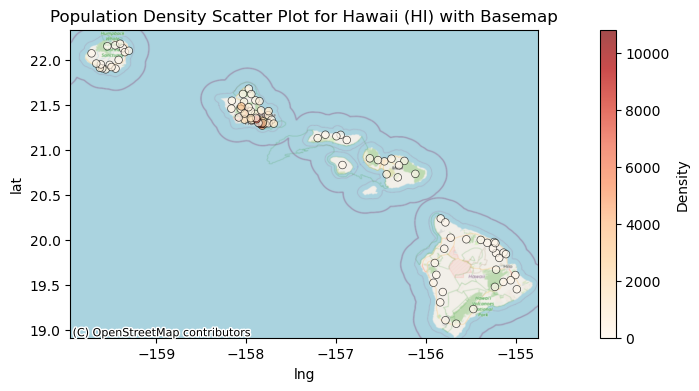

In [114]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(HI_df['lng'], HI_df['lat'], c=HI_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Hawaii (HI) with Basemap')

# Show the plot
plt.show()


In [115]:
# Filter counties with average density greater than 100 for Hawaii
HI_high_density_df = result_df_HI[result_df_HI['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Hawaii
HI_low_density_df = result_df_HI[result_df_HI['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {HI}:')
print(HI_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {HI}:')
print(HI_low_density_df.to_string(index=False))

Counties with Average Density > 100 in HI:
  County  Average Density
Honolulu      1688.607895
   Kauai       199.362500
    Maui       129.700000


Counties with Average Density <= 100 in HI:
 County  Average Density
 Hawaii        37.764286
Kalawao         1.600000


In [116]:
# Calculate the number of firebots for each county with average density > 100
HI_high_density_df['Number of Firebots'] = HI_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {HI}:')
print(HI_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in HI:
  County  Average Density  Number of Firebots
Honolulu      1688.607895           16.886079
   Kauai       199.362500            1.993625
    Maui       129.700000            1.297000


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1717401344.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HI_high_density_df['Number of Firebots'] = HI_high_density_df['Average Density'] / 100


In [117]:


# Calculate the total sum of firebots for counties with average density > 100 in Hawaii
total_firebots_high_density_HI = HI_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Hawaii (HI):", total_firebots_high_density_HI)



Total Number of Firebots for High Density Counties in Hawaii (HI): 20.176703947368424


In [118]:
# Filter counties with average density less than or equal to 100 for Hawaii
HI_low_density_df = result_df_HI[result_df_HI['Average Density'] <= 100]

# Count the number of counties with average density <= 100
HI_low_density_counties = len(HI_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Hawaii (HI): {HI_low_density_counties}')

Number of Counties with Average Density <= 100 in Hawaii (HI): 2


In [119]:
print("Total Number of Firebot for Hawaii")
print(total_firebots_high_density_HI + HI_low_density_counties)

Total Number of Firebot for Hawaii
22.176703947368424


# Idaho

In [120]:
ID = 'ID'

# Filter the DataFrame for the selected state
ID_df = df[df['state_id'] == ID]

# Calculate the average population density per county
average_density_by_county_ID = ID_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_ID = pd.DataFrame({
    'County': average_density_by_county_ID.index,
    'Average Density': average_density_by_county_ID.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {ID}:')
print(result_df_ID.to_string(index=False))

Average Population Density by County in ID:
    County  Average Density
       Ada       640.675000
     Adams         4.450000
   Bannock       141.766667
 Bear Lake         5.955556
   Benewah         3.400000
   Bingham        64.288889
    Blaine        39.457143
     Boise         2.000000
    Bonner        82.318750
Bonneville       172.500000
  Boundary         5.825000
     Butte         1.000000
     Camas         0.350000
    Canyon       332.130000
   Caribou         2.700000
    Cassia         5.828571
     Clark         0.400000
Clearwater         7.380000
    Custer         0.380000
    Elmore        23.483333
  Franklin        11.466667
   Fremont       454.350000
       Gem        30.650000
   Gooding        12.800000
     Idaho         2.491667
 Jefferson        17.800000
    Jerome        15.300000
  Kootenai       135.109091
     Latah       279.145455
     Lemhi         0.611111
     Lewis         1.850000
   Lincoln         4.900000
   Madison        39.820000
  Mi

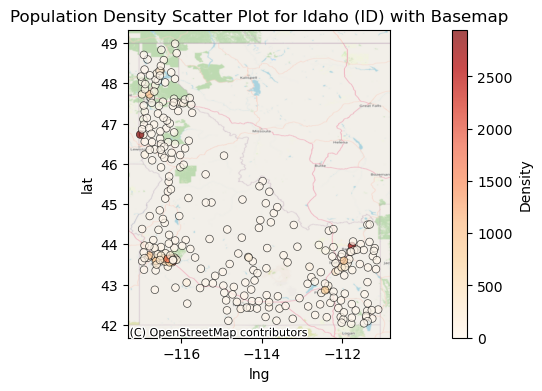

In [121]:
# Create a scatter plot with contextily basemap for the selected state
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state
scatter = ax.scatter(ID_df['lng'], ID_df['lat'], c=ID_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Idaho (ID) with Basemap')

# Show the plot
plt.show()

In [122]:
# Filter counties with average density greater than 100 for Idaho
ID_high_density_df = result_df_ID[result_df_ID['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Idaho
ID_low_density_df = result_df_ID[result_df_ID['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {ID}:')
print(ID_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {ID}:')
print(ID_low_density_df.to_string(index=False))

Counties with Average Density > 100 in ID:
    County  Average Density
       Ada       640.675000
   Bannock       141.766667
Bonneville       172.500000
    Canyon       332.130000
   Fremont       454.350000
  Kootenai       135.109091
     Latah       279.145455


Counties with Average Density <= 100 in ID:
    County  Average Density
     Adams         4.450000
 Bear Lake         5.955556
   Benewah         3.400000
   Bingham        64.288889
    Blaine        39.457143
     Boise         2.000000
    Bonner        82.318750
  Boundary         5.825000
     Butte         1.000000
     Camas         0.350000
   Caribou         2.700000
    Cassia         5.828571
     Clark         0.400000
Clearwater         7.380000
    Custer         0.380000
    Elmore        23.483333
  Franklin        11.466667
       Gem        30.650000
   Gooding        12.800000
     Idaho         2.491667
 Jefferson        17.800000
    Jerome        15.300000
     Lemhi         0.611111
     Lewis     

In [123]:
# Calculate the number of firebots for each county with average density > 100
ID_high_density_df['Number of Firebots'] = ID_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {ID}:')
print(ID_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in ID:
    County  Average Density  Number of Firebots
       Ada       640.675000            6.406750
   Bannock       141.766667            1.417667
Bonneville       172.500000            1.725000
    Canyon       332.130000            3.321300
   Fremont       454.350000            4.543500
  Kootenai       135.109091            1.351091
     Latah       279.145455            2.791455


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2968415638.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ID_high_density_df['Number of Firebots'] = ID_high_density_df['Average Density'] / 100


In [124]:
# Filter counties with average density less than or equal to 100 for Idaho
ID_low_density_df = result_df_ID[result_df_ID['Average Density'] <= 100]

# Count the number of counties with average density <= 100
ID_low_density_counties = len(ID_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Idaho (ID): {ID_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Idaho
total_firebots_high_density_ID = ID_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Idaho (ID):", total_firebots_high_density_ID)

Number of Counties with Average Density <= 100 in Idaho (ID): 37

Total Number of Firebots for High Density Counties in Idaho (ID): 21.556762121212124


In [125]:
print("Total Number of Firebot for Idaho")
print(total_firebots_high_density_ID + ID_low_density_counties)

Total Number of Firebot for Idaho
58.556762121212124


# Illinois

In [126]:
IL = 'IL'

# Filter the DataFrame for the selected state (Illinois)
IL_df = df[df['state_id'] == IL]

# Calculate the average population density per county
average_density_by_county_IL = IL_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_IL = pd.DataFrame({
    'County': average_density_by_county_IL.index,
    'Average Density': average_density_by_county_IL.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {IL}:')
print(result_df_IL.to_string(index=False))

Average Population Density by County in IL:
     County  Average Density
      Adams        80.075000
  Alexander        11.233333
       Bond        19.637500
      Boone        60.320000
      Brown         6.400000
     Bureau        74.095833
    Calhoun         7.816667
    Carroll        13.442857
       Cass        10.550000
  Champaign       265.555172
  Christian        51.657143
      Clark         9.242857
       Clay        30.228571
    Clinton       117.045455
      Coles        26.750000
       Cook      3313.444910
   Crawford        18.457143
 Cumberland        12.640000
    De Witt        72.300000
     DeKalb        91.038462
    Douglas        19.985714
     DuPage      1197.940541
      Edgar        36.225000
    Edwards         7.650000
  Effingham        23.214286
    Fayette         9.988889
       Ford        12.755556
   Franklin       107.237500
     Fulton        70.210000
   Gallatin         5.320000
     Greene        13.430000
     Grundy        43.025000

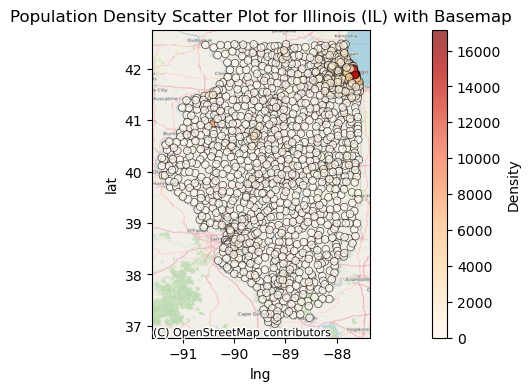

In [127]:
# Create a scatter plot with contextily basemap for the selected state (Illinois)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Illinois)
scatter = ax.scatter(IL_df['lng'], IL_df['lat'], c=IL_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Illinois (IL) with Basemap')

# Show the plot
plt.show()

In [128]:
# Filter counties with average density greater than 100 for Illinois
IL_high_density_df = result_df_IL[result_df_IL['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Illinois
IL_low_density_df = result_df_IL[result_df_IL['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {IL}:')
print(IL_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {IL}:')
print(IL_low_density_df.to_string(index=False))


Counties with Average Density > 100 in IL:
     County  Average Density
  Champaign       265.555172
    Clinton       117.045455
       Cook      3313.444910
     DuPage      1197.940541
   Franklin       107.237500
       Kane       577.359091
   Kankakee       119.306250
    Kendall       282.362500
       Knox       504.723529
       Lake       841.317857
      Macon       152.556250
    Madison       232.378571
    McHenry       355.788889
     McLean       114.875000
     Monroe       142.000000
     Peoria       491.668000
      Perry       103.083333
Rock Island       279.070588
   Sangamon       198.984615
  St. Clair       244.429630
   Tazewell       119.650000
     Wabash       150.650000
       Will       586.446667
 Williamson       152.375000
  Winnebago       377.185000


Counties with Average Density <= 100 in IL:
    County  Average Density
     Adams        80.075000
 Alexander        11.233333
      Bond        19.637500
     Boone        60.320000
     Brown       

In [129]:
# Calculate the number of firebots for each county with average density > 100 in Illinois
IL_high_density_df['Number of Firebots'] = IL_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {IL}:')
print(IL_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in IL:
     County  Average Density  Number of Firebots
  Champaign       265.555172            2.655552
    Clinton       117.045455            1.170455
       Cook      3313.444910           33.134449
     DuPage      1197.940541           11.979405
   Franklin       107.237500            1.072375
       Kane       577.359091            5.773591
   Kankakee       119.306250            1.193063
    Kendall       282.362500            2.823625
       Knox       504.723529            5.047235
       Lake       841.317857            8.413179
      Macon       152.556250            1.525563
    Madison       232.378571            2.323786
    McHenry       355.788889            3.557889
     McLean       114.875000            1.148750
     Monroe       142.000000            1.420000
     Peoria       491.668000            4.916680
      Perry       103.083333            1.030833
Rock Island       279.070588            2.790706
   Sangamon       198.9846

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2092428729.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IL_high_density_df['Number of Firebots'] = IL_high_density_df['Average Density'] / 100


In [130]:
# Filter counties with average density less than or equal to 100 for Illinois
IL_low_density_df = result_df_IL[result_df_IL['Average Density'] <= 100]

# Count the number of counties with average density <= 100
IL_low_density_counties = len(IL_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Illinois (IL): {IL_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Illinois
total_firebots_high_density_IL = IL_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Illinois (IL):", total_firebots_high_density_IL)


Number of Counties with Average Density <= 100 in Illinois (IL): 77

Total Number of Firebots for High Density Counties in Illinois (IL): 110.27434348710142


In [131]:
# Display the total number of firebots for Illinois
print("Total Number of Firebots for Illinois:")
print(total_firebots_high_density_IL + IL_low_density_counties)

Total Number of Firebots for Illinois:
187.27434348710142


# Indiana

In [132]:
IN = 'IN'

# Filter the DataFrame for the selected state (Indiana)
IN_df = df[df['state_id'] == IN]

# Calculate the average population density per county
average_density_by_county_IN = IN_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_IN = pd.DataFrame({
    'County': average_density_by_county_IN.index,
    'Average Density': average_density_by_county_IN.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {IN}:')
print(result_df_IN.to_string(index=False))

Average Population Density by County in IN:
     County  Average Density
      Adams        40.700000
      Allen       464.015385
Bartholomew       268.033333
     Benton         7.360000
  Blackford        26.750000
      Boone       125.800000
      Brown      2262.000000
    Carroll       104.157143
       Cass       112.366667
      Clark       162.133333
       Clay       189.430000
    Clinton        23.785714
   Crawford        15.375000
    Daviess        22.600000
     DeKalb        48.262500
   Dearborn        55.100000
    Decatur       207.340000
   Delaware       660.641667
     Dubois        27.533333
    Elkhart       190.563636
    Fayette        45.800000
      Floyd       186.525000
   Fountain        70.814286
   Franklin        42.742857
     Fulton       102.666667
     Gibson        54.500000
      Grant       153.658333
     Greene        21.236364
   Hamilton       435.992308
    Hancock       365.271429
   Harrison        48.358333
  Hendricks       215.336364

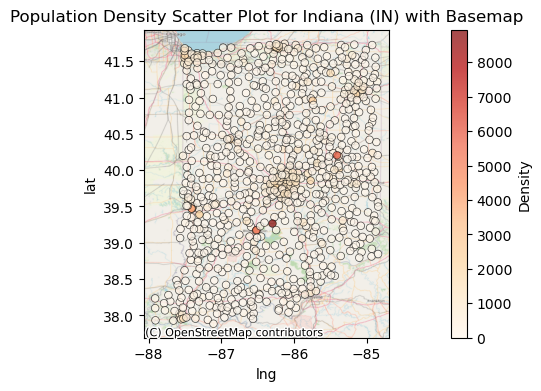

In [133]:
# Create a scatter plot with contextily basemap for the selected state (Indiana)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Indiana)
scatter = ax.scatter(IN_df['lng'], IN_df['lat'], c=IN_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Indiana (IN) with Basemap')

# Show the plot
plt.show()

In [134]:
# Filter counties with average density greater than 100 for Indiana
IN_high_density_df = result_df_IN[result_df_IN['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Indiana
IN_low_density_df = result_df_IN[result_df_IN['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {IN}:')
print(IN_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {IN}:')
print(IN_low_density_df.to_string(index=False))

Counties with Average Density > 100 in IN:
     County  Average Density
      Allen       464.015385
Bartholomew       268.033333
      Boone       125.800000
      Brown      2262.000000
    Carroll       104.157143
       Cass       112.366667
      Clark       162.133333
       Clay       189.430000
    Decatur       207.340000
   Delaware       660.641667
    Elkhart       190.563636
      Floyd       186.525000
     Fulton       102.666667
      Grant       153.658333
   Hamilton       435.992308
    Hancock       365.271429
  Hendricks       215.336364
      Henry       344.440000
    Johnson       273.371429
  Kosciusko       161.214286
   LaGrange       177.037500
    LaPorte       123.350000
       Lake       697.003704
    Madison       269.664286
     Marion      1056.578378
     Monroe       920.863636
     Morgan       246.912500
      Noble       189.310000
     Porter       148.222222
   Randolph       109.400000
 St. Joseph       743.280000
 Tippecanoe       442.553846


In [135]:
# Calculate the number of firebots for each county with average density > 100 in Indiana
IN_high_density_df['Number of Firebots'] = IN_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {IN}:')
print(IN_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in IN:
     County  Average Density  Number of Firebots
      Allen       464.015385            4.640154
Bartholomew       268.033333            2.680333
      Boone       125.800000            1.258000
      Brown      2262.000000           22.620000
    Carroll       104.157143            1.041571
       Cass       112.366667            1.123667
      Clark       162.133333            1.621333
       Clay       189.430000            1.894300
    Decatur       207.340000            2.073400
   Delaware       660.641667            6.606417
    Elkhart       190.563636            1.905636
      Floyd       186.525000            1.865250
     Fulton       102.666667            1.026667
      Grant       153.658333            1.536583
   Hamilton       435.992308            4.359923
    Hancock       365.271429            3.652714
  Hendricks       215.336364            2.153364
      Henry       344.440000            3.444400
    Johnson       273.3714

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/85135006.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IN_high_density_df['Number of Firebots'] = IN_high_density_df['Average Density'] / 100


In [136]:
# Filter counties with average density less than or equal to 100 for Indiana
IN_low_density_df = result_df_IN[result_df_IN['Average Density'] <= 100]

# Count the number of counties with average density <= 100
IN_low_density_counties = len(IN_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Indiana (IN): {IN_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Indiana
total_firebots_high_density_IN = IN_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Indiana (IN):", total_firebots_high_density_IN)


Number of Counties with Average Density <= 100 in Indiana (IN): 55

Total Number of Firebots for High Density Counties in Indiana (IN): 143.23226042011044


In [137]:
# Display the total number of firebots for Indiana
print("Total Number of Firebots for Indiana:")
print(total_firebots_high_density_IN + IN_low_density_counties)

Total Number of Firebots for Indiana:
198.23226042011044


# Iowa

In [138]:
IA = 'IA'

# Filter the DataFrame for the selected state (Iowa)
IA_df = df[df['state_id'] == IA]

# Calculate the average population density per county
average_density_by_county_IA = IA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_IA = pd.DataFrame({
    'County': average_density_by_county_IA.index,
    'Average Density': average_density_by_county_IA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {IA}:')
print(result_df_IA.to_string(index=False))

Average Population Density by County in IA:
       County  Average Density
        Adair         5.560000
        Adams        13.675000
    Allamakee         8.337500
    Appanoose         6.388889
      Audubon         7.200000
       Benton        41.743750
   Black Hawk       217.383333
        Boone        46.100000
       Bremer        84.287500
     Buchanan        36.700000
  Buena Vista        55.625000
       Butler        33.990909
      Calhoun        10.550000
      Carroll        26.918182
         Cass         5.637500
        Cedar        13.611111
  Cerro Gordo        19.522222
     Cherokee         6.025000
    Chickasaw         7.833333
       Clarke         6.250000
         Clay        40.190000
      Clayton        13.766667
      Clinton        45.300000
     Crawford        12.633333
       Dallas       140.153846
        Davis         7.450000
      Decatur         4.728571
     Delaware        25.911111
   Des Moines        29.912500
    Dickinson        81.22

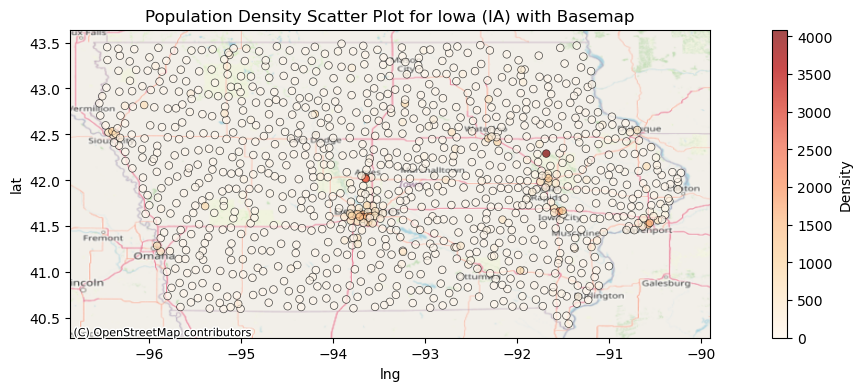

In [139]:
# Create a scatter plot with contextily basemap for the selected state (Iowa)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Iowa)
scatter = ax.scatter(IA_df['lng'], IA_df['lat'], c=IA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Iowa (IA) with Basemap')

# Show the plot
plt.show()

In [140]:
# Filter counties with average density greater than 100 for Iowa
IA_high_density_df = result_df_IA[result_df_IA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Iowa
IA_low_density_df = result_df_IA[result_df_IA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {IA}:')
print(IA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {IA}:')
print(IA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in IA:
       County  Average Density
   Black Hawk       217.383333
       Dallas       140.153846
     Franklin       114.281818
       Grundy       104.066667
    Jefferson       129.357143
      Johnson       395.946154
         Linn       420.622727
       Louisa       140.416667
         Polk       628.860606
Pottawattamie       101.112500
        Scott       286.235000
        Story       377.053333
       Warren       103.375000
     Woodbury       163.135000


Counties with Average Density <= 100 in IA:
     County  Average Density
      Adair         5.560000
      Adams        13.675000
  Allamakee         8.337500
  Appanoose         6.388889
    Audubon         7.200000
     Benton        41.743750
      Boone        46.100000
     Bremer        84.287500
   Buchanan        36.700000
Buena Vista        55.625000
     Butler        33.990909
    Calhoun        10.550000
    Carroll        26.918182
       Cass         5.637500
      Cedar

In [141]:
# Calculate the number of firebots for each county with average density > 100 in Iowa
IA_high_density_df['Number of Firebots'] = IA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {IA}:')
print(IA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in IA:
       County  Average Density  Number of Firebots
   Black Hawk       217.383333            2.173833
       Dallas       140.153846            1.401538
     Franklin       114.281818            1.142818
       Grundy       104.066667            1.040667
    Jefferson       129.357143            1.293571
      Johnson       395.946154            3.959462
         Linn       420.622727            4.206227
       Louisa       140.416667            1.404167
         Polk       628.860606            6.288606
Pottawattamie       101.112500            1.011125
        Scott       286.235000            2.862350
        Story       377.053333            3.770533
       Warren       103.375000            1.033750
     Woodbury       163.135000            1.631350


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/379815253.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IA_high_density_df['Number of Firebots'] = IA_high_density_df['Average Density'] / 100


In [142]:
# Filter counties with average density less than or equal to 100 for Iowa
IA_low_density_df = result_df_IA[result_df_IA['Average Density'] <= 100]

# Count the number of counties with average density <= 100
IA_low_density_counties = len(IA_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Iowa (IA): {IA_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Iowa
total_firebots_high_density_IA = IA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Iowa (IA):", total_firebots_high_density_IA)


Number of Counties with Average Density <= 100 in Iowa (IA): 85

Total Number of Firebots for High Density Counties in Iowa (IA): 33.219997943722944


In [143]:
# Display the total number of firebots for Iowa
print("Total Number of Firebots for Iowa:")
print(total_firebots_high_density_IA + IA_low_density_counties)

Total Number of Firebots for Iowa:
118.21999794372294


# Kansas

In [144]:
KS = 'KS'

# Filter the DataFrame for the selected state (Kansas)
KS_df = df[df['state_id'] == KS]

# Calculate the average population density per county
average_density_by_county_KS = KS_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_KS = pd.DataFrame({
    'County': average_density_by_county_KS.index,
    'Average Density': average_density_by_county_KS.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {KS}:')
print(result_df_KS.to_string(index=False))

Average Population Density by County in KS:
      County  Average Density
       Allen        23.885714
    Anderson         4.183333
    Atchison        10.020000
      Barber         1.314286
      Barton         8.660000
     Bourbon         5.357143
       Brown         4.950000
      Butler        70.018750
       Chase         1.280000
  Chautauqua        14.380000
    Cherokee        41.544444
    Cheyenne         1.050000
       Clark         1.100000
        Clay         3.580000
       Cloud         3.266667
      Coffey         4.960000
    Comanche         0.900000
      Cowley         9.444444
    Crawford        33.676923
     Decatur         0.900000
   Dickinson        68.466667
    Doniphan        35.500000
     Douglas       178.112500
     Edwards         1.400000
         Elk         1.540000
       Ellis       100.050000
   Ellsworth         3.750000
      Finney         8.000000
        Ford        58.883333
    Franklin        12.187500
       Geary        43.550

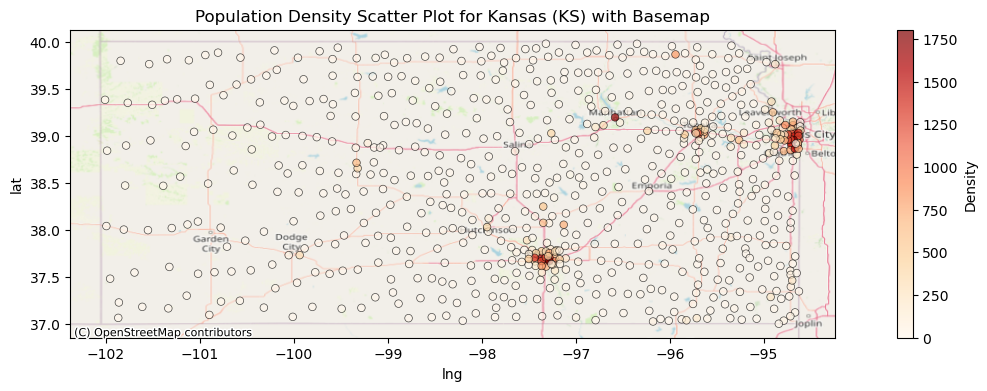

In [145]:
# Create a scatter plot with contextily basemap for the selected state (Kansas)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Kansas)
scatter = ax.scatter(KS_df['lng'], KS_df['lat'], c=KS_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Kansas (KS) with Basemap')

# Show the plot
plt.show()


In [146]:
# Filter counties with average density greater than 100 for Kansas
KS_high_density_df = result_df_KS[result_df_KS['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Kansas
KS_low_density_df = result_df_KS[result_df_KS['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {KS}:')
print(KS_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {KS}:')
print(KS_low_density_df.to_string(index=False))


Counties with Average Density > 100 in KS:
     County  Average Density
    Douglas       178.112500
      Ellis       100.050000
     Harvey       103.714286
    Johnson       817.581250
Leavenworth       157.262500
      Riley       303.187500
   Sedgwick       480.460465
    Shawnee       389.012500
  Wyandotte       558.633333


Counties with Average Density <= 100 in KS:
      County  Average Density
       Allen        23.885714
    Anderson         4.183333
    Atchison        10.020000
      Barber         1.314286
      Barton         8.660000
     Bourbon         5.357143
       Brown         4.950000
      Butler        70.018750
       Chase         1.280000
  Chautauqua        14.380000
    Cherokee        41.544444
    Cheyenne         1.050000
       Clark         1.100000
        Clay         3.580000
       Cloud         3.266667
      Coffey         4.960000
    Comanche         0.900000
      Cowley         9.444444
    Crawford        33.676923
     Decatur         

In [147]:
# Calculate the number of firebots for each county with average density > 100 in Kansas
KS_high_density_df['Number of Firebots'] = KS_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {KS}:')
print(KS_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in KS:
     County  Average Density  Number of Firebots
    Douglas       178.112500            1.781125
      Ellis       100.050000            1.000500
     Harvey       103.714286            1.037143
    Johnson       817.581250            8.175812
Leavenworth       157.262500            1.572625
      Riley       303.187500            3.031875
   Sedgwick       480.460465            4.804605
    Shawnee       389.012500            3.890125
  Wyandotte       558.633333            5.586333


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/3661634603.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  KS_high_density_df['Number of Firebots'] = KS_high_density_df['Average Density'] / 100


In [148]:
# Filter counties with average density less than or equal to 100 for Kansas
KS_low_density_df = result_df_KS[result_df_KS['Average Density'] <= 100]

# Count the number of counties with average density <= 100
KS_low_density_counties = len(KS_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Kansas (KS): {KS_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Kansas
total_firebots_high_density_KS = KS_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Kansas (KS):", total_firebots_high_density_KS)


Number of Counties with Average Density <= 100 in Kansas (KS): 96

Total Number of Firebots for High Density Counties in Kansas (KS): 30.88014334163898


In [149]:
# Display the total number of firebots for Kansas
print("Total Number of Firebots for Kansas:")
print(total_firebots_high_density_KS + KS_low_density_counties)

Total Number of Firebots for Kansas:
126.88014334163898


# Kentucky

In [150]:
KY = 'KY'

# Filter the DataFrame for the selected state (Kentucky)
KY_df = df[df['state_id'] == KY]

# Calculate the average population density per county
average_density_by_county_KY = KY_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_KY = pd.DataFrame({
    'County': average_density_by_county_KY.index,
    'Average Density': average_density_by_county_KY.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {KY}:')
print(result_df_KY.to_string(index=False))

Average Population Density by County in KY:
      County  Average Density
       Adair        14.280000
       Allen        19.266667
    Anderson        48.900000
     Ballard        30.250000
      Barren        23.433333
        Bath        17.000000
        Bell        17.072727
       Boone       241.714286
     Bourbon       499.500000
        Boyd       232.825000
       Boyle        49.800000
     Bracken        16.466667
   Breathitt         8.485714
Breckinridge        15.153846
     Bullitt        98.283333
      Butler        12.825000
    Caldwell        12.650000
    Calloway        23.283333
    Campbell       904.400000
    Carlisle        10.100000
     Carroll        31.900000
      Carter        31.966667
       Casey        13.642857
   Christian        29.762500
       Clark        59.500000
        Clay       107.900000
     Clinton        18.700000
  Crittenden        53.800000
  Cumberland        60.450000
     Daviess       414.533333
    Edmonson        17.833

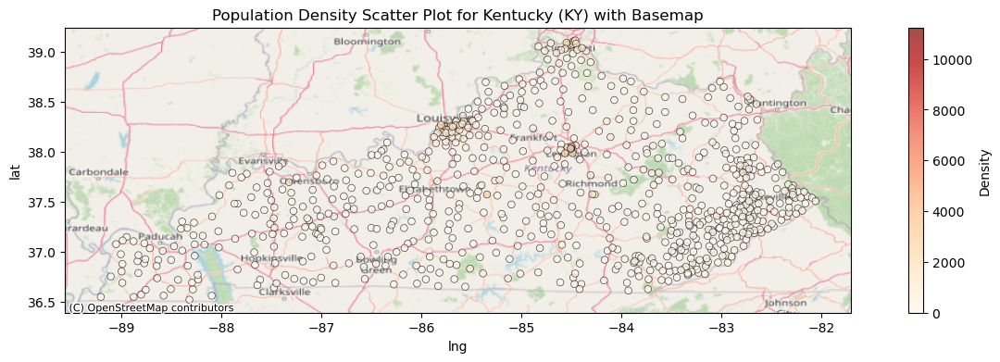

In [151]:
# Create a scatter plot with contextily basemap for the selected state (Kentucky)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Kentucky)
scatter = ax.scatter(KY_df['lng'], KY_df['lat'], c=KY_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Kentucky (KY) with Basemap')

# Show the plot
plt.show()

In [152]:
# Filter counties with average density greater than 100 for Kentucky
KY_high_density_df = result_df_KY[result_df_KY['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Kentucky
KY_low_density_df = result_df_KY[result_df_KY['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {KY}:')
print(KY_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {KY}:')
print(KY_low_density_df.to_string(index=False))


Counties with Average Density > 100 in KY:
    County  Average Density
     Boone       241.714286
   Bourbon       499.500000
      Boyd       232.825000
  Campbell       904.400000
      Clay       107.900000
   Daviess       414.533333
   Fayette      1665.737500
   Greenup       178.728571
 Jefferson      1064.921053
 Jessamine       340.700000
   Johnson       107.552941
    Kenton      1021.612500
   Madison       498.125000
    Marion       415.637500
 McCracken       125.333333
    Mercer       142.900000
Montgomery       149.300000
    Oldham       183.285714
Washington       215.525000


Counties with Average Density <= 100 in KY:
      County  Average Density
       Adair        14.280000
       Allen        19.266667
    Anderson        48.900000
     Ballard        30.250000
      Barren        23.433333
        Bath        17.000000
        Bell        17.072727
       Boyle        49.800000
     Bracken        16.466667
   Breathitt         8.485714
Breckinridge        1

In [153]:
# Calculate the number of firebots for each county with average density > 100 in Kentucky
KY_high_density_df['Number of Firebots'] = KY_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {KY}:')
print(KY_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in KY:
    County  Average Density  Number of Firebots
     Boone       241.714286            2.417143
   Bourbon       499.500000            4.995000
      Boyd       232.825000            2.328250
  Campbell       904.400000            9.044000
      Clay       107.900000            1.079000
   Daviess       414.533333            4.145333
   Fayette      1665.737500           16.657375
   Greenup       178.728571            1.787286
 Jefferson      1064.921053           10.649211
 Jessamine       340.700000            3.407000
   Johnson       107.552941            1.075529
    Kenton      1021.612500           10.216125
   Madison       498.125000            4.981250
    Marion       415.637500            4.156375
 McCracken       125.333333            1.253333
    Mercer       142.900000            1.429000
Montgomery       149.300000            1.493000
    Oldham       183.285714            1.832857
Washington       215.525000            2.1552

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2904709201.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  KY_high_density_df['Number of Firebots'] = KY_high_density_df['Average Density'] / 100


In [154]:
# Filter counties with average density less than or equal to 100 for Kentucky
KY_low_density_df = result_df_KY[result_df_KY['Average Density'] <= 100]

# Count the number of counties with average density <= 100
KY_low_density_counties = len(KY_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Kentucky (KY): {KY_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Kentucky
total_firebots_high_density_KY = KY_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Kentucky (KY):", total_firebots_high_density_KY)


Number of Counties with Average Density <= 100 in Kentucky (KY): 101

Total Number of Firebots for High Density Counties in Kentucky (KY): 85.10231731903286


In [155]:
# Display the total number of firebots for Kentucky
print("Total Number of Firebots for Kentucky:")
print(total_firebots_high_density_KY + KY_low_density_counties)

Total Number of Firebots for Kentucky:
186.10231731903286


# Louisiana

In [156]:
LA = 'LA'

# Filter the DataFrame for the selected state (Louisiana)
LA_df = df[df['state_id'] == LA]

# Calculate the average population density per county
average_density_by_county_LA = LA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_LA = pd.DataFrame({
    'County': average_density_by_county_LA.index,
    'Average Density': average_density_by_county_LA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {LA}:')
print(result_df_LA.to_string(index=False))

Average Population Density by County in LA:
              County  Average Density
              Acadia        41.191667
               Allen         8.644444
           Ascension       150.042857
          Assumption        33.000000
           Avoyelles        18.707692
          Beauregard         9.866667
           Bienville         6.216667
             Bossier       110.437500
               Caddo       271.812500
           Calcasieu      1575.964286
            Caldwell        62.375000
             Cameron        17.416667
           Catahoula         3.483333
           Claiborne         5.300000
           Concordia        10.550000
             De Soto        16.537500
    East Baton Rouge       822.520000
        East Carroll         4.300000
      East Feliciana        18.616667
          Evangeline       154.057143
            Franklin         8.050000
               Grant        14.450000
              Iberia        58.616667
           Iberville        29.337500
      

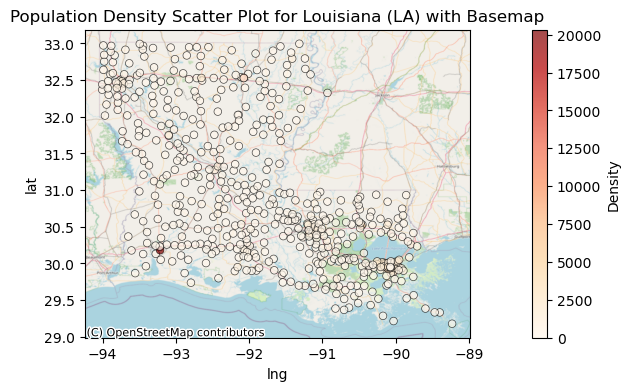

In [157]:
# Create a scatter plot with contextily basemap for the selected state (Louisiana)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Louisiana)
scatter = ax.scatter(LA_df['lng'], LA_df['lat'], c=LA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Louisiana (LA) with Basemap')

# Show the plot
plt.show()

In [158]:
# Filter counties with average density greater than 100 for Louisiana
LA_high_density_df = result_df_LA[result_df_LA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Louisiana
LA_low_density_df = result_df_LA[result_df_LA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {LA}:')
print(LA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {LA}:')
print(LA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in LA:
              County  Average Density
           Ascension       150.042857
             Bossier       110.437500
               Caddo       271.812500
           Calcasieu      1575.964286
    East Baton Rouge       822.520000
          Evangeline       154.057143
           Jefferson      1406.664706
           Lafayette       398.172727
           Lafourche       104.345455
             Lincoln       394.850000
             Orleans      1823.040000
            Ouachita      1431.587500
             Rapides       121.368421
            Richland       118.250000
         St. Bernard       599.660000
         St. Charles       182.455556
           St. James       149.528571
St. John the Baptist       106.380000
            St. Mary       225.500000
         St. Tammany       264.200000
          Tangipahoa       492.420000
           Vermilion       146.216667
    West Baton Rouge       122.050000
        West Carroll       216.260000


Count

In [159]:
# Calculate the number of firebots for each county with average density > 100 in Louisiana
LA_high_density_df['Number of Firebots'] = LA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {LA}:')
print(LA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in LA:
              County  Average Density  Number of Firebots
           Ascension       150.042857            1.500429
             Bossier       110.437500            1.104375
               Caddo       271.812500            2.718125
           Calcasieu      1575.964286           15.759643
    East Baton Rouge       822.520000            8.225200
          Evangeline       154.057143            1.540571
           Jefferson      1406.664706           14.066647
           Lafayette       398.172727            3.981727
           Lafourche       104.345455            1.043455
             Lincoln       394.850000            3.948500
             Orleans      1823.040000           18.230400
            Ouachita      1431.587500           14.315875
             Rapides       121.368421            1.213684
            Richland       118.250000            1.182500
         St. Bernard       599.660000            5.996600
         St. Charles       18

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2871533006.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LA_high_density_df['Number of Firebots'] = LA_high_density_df['Average Density'] / 100


In [160]:
# Filter counties with average density less than or equal to 100 for Louisiana
LA_low_density_df = result_df_LA[result_df_LA['Average Density'] <= 100]

# Count the number of counties with average density <= 100
LA_low_density_counties = len(LA_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Louisiana (LA): {LA_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Louisiana
total_firebots_high_density_LA = LA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Louisiana (LA):", total_firebots_high_density_LA)


Number of Counties with Average Density <= 100 in Louisiana (LA): 40

Total Number of Firebots for High Density Counties in Louisiana (LA): 113.87783888118247


In [161]:
# Display the total number of firebots for Louisiana
print("Total Number of Firebots for Louisiana:")
print(total_firebots_high_density_LA + LA_low_density_counties)

Total Number of Firebots for Louisiana:
153.87783888118247


# Maine

In [162]:
ME = 'ME'

# Filter the DataFrame for the selected state (Maine)
ME_df = df[df['state_id'] == ME]

# Calculate the average population density per county
average_density_by_county_ME = ME_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_ME = pd.DataFrame({
    'County': average_density_by_county_ME.index,
    'Average Density': average_density_by_county_ME.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {ME}:')
print(result_df_ME.to_string(index=False))

Average Population Density by County in ME:
      County  Average Density
Androscoggin       100.371429
   Aroostook         8.675610
  Cumberland       272.528947
    Franklin         9.100000
     Hancock        30.217500
    Kennebec        61.150000
        Knox        52.321053
     Lincoln        60.500000
      Oxford        18.903030
   Penobscot        76.063415
 Piscataquis        54.276923
   Sagadahoc        56.787500
    Somerset        24.524000
       Waldo        20.022222
  Washington        12.706452
        York       119.647222


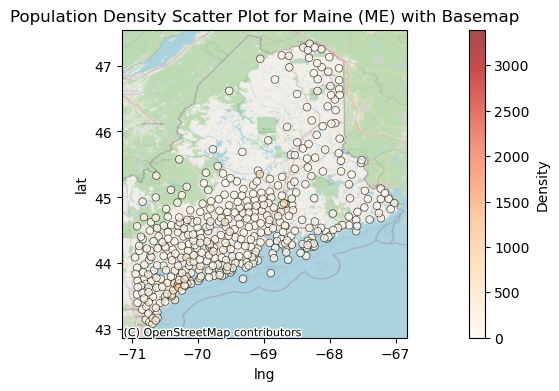

In [163]:
# Create a scatter plot with contextily basemap for the selected state (Maine)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Maine)
scatter = ax.scatter(ME_df['lng'], ME_df['lat'], c=ME_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Maine (ME) with Basemap')

# Show the plot
plt.show()

In [164]:
# Filter counties with average density greater than 100 for Maine
ME_high_density_df = result_df_ME[result_df_ME['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Maine
ME_low_density_df = result_df_ME[result_df_ME['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {ME}:')
print(ME_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {ME}:')
print(ME_low_density_df.to_string(index=False))


Counties with Average Density > 100 in ME:
      County  Average Density
Androscoggin       100.371429
  Cumberland       272.528947
        York       119.647222


Counties with Average Density <= 100 in ME:
     County  Average Density
  Aroostook         8.675610
   Franklin         9.100000
    Hancock        30.217500
   Kennebec        61.150000
       Knox        52.321053
    Lincoln        60.500000
     Oxford        18.903030
  Penobscot        76.063415
Piscataquis        54.276923
  Sagadahoc        56.787500
   Somerset        24.524000
      Waldo        20.022222
 Washington        12.706452


In [165]:
# Calculate the number of firebots for each county with average density > 100 in Maine
ME_high_density_df['Number of Firebots'] = ME_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {ME}:')
print(ME_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in ME:
      County  Average Density  Number of Firebots
Androscoggin       100.371429            1.003714
  Cumberland       272.528947            2.725289
        York       119.647222            1.196472


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1834930910.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ME_high_density_df['Number of Firebots'] = ME_high_density_df['Average Density'] / 100


In [166]:
# Filter counties with average density less than or equal to 100 for Maine
ME_low_density_df = result_df_ME[result_df_ME['Average Density'] <= 100]

# Count the number of counties with average density <= 100
ME_low_density_counties = len(ME_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Maine (ME): {ME_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Maine
total_firebots_high_density_ME = ME_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Maine (ME):", total_firebots_high_density_ME)


Number of Counties with Average Density <= 100 in Maine (ME): 13

Total Number of Firebots for High Density Counties in Maine (ME): 4.9254759816207185


In [167]:
# Display the total number of firebots for Maine
print("Total Number of Firebots for Maine:")
print(total_firebots_high_density_ME + ME_low_density_counties)

Total Number of Firebots for Maine:
17.925475981620718


# Maryland

In [168]:
MD = 'MD'

# Filter the DataFrame for the selected state (Maryland)
MD_df = df[df['state_id'] == MD]

# Calculate the average population density per county
average_density_by_county_MD = MD_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MD = pd.DataFrame({
    'County': average_density_by_county_MD.index,
    'Average Density': average_density_by_county_MD.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MD}:')
print(result_df_MD.to_string(index=False))

Average Population Density by County in MD:
         County  Average Density
       Allegany       270.050000
   Anne Arundel       610.762162
      Baltimore      1557.786567
        Calvert       221.983333
       Caroline        84.537500
        Carroll       127.944444
          Cecil       147.786667
        Charles       208.018182
     Dorchester        68.325000
      Frederick       216.940741
        Garrett        23.170000
        Harford       316.440000
         Howard       541.250000
           Kent        33.866667
     Montgomery      1169.881250
Prince George's      1494.041667
   Queen Anne's        85.608333
       Somerset       442.055556
     St. Mary's       152.988462
         Talbot        64.673333
     Washington       369.673684
       Wicomico       106.512500
      Worcester        68.690000


In [169]:
 Create a scatter plot with contextily basemap for the selected state (Maryland)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Maryland)
scatter = ax.scatter(MD_df['lng'], MD_df['lat'], c=MD_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Maryland (MD) with Basemap')

# Show the plot
plt.show()


SyntaxError: invalid syntax (2982835094.py, line 1)

In [170]:
# Filter counties with average density greater than 100 for Maryland
MD_high_density_df = result_df_MD[result_df_MD['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Maryland
MD_low_density_df = result_df_MD[result_df_MD['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MD}:')
print(MD_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MD}:')
print(MD_low_density_df.to_string(index=False))

Counties with Average Density > 100 in MD:
         County  Average Density
       Allegany       270.050000
   Anne Arundel       610.762162
      Baltimore      1557.786567
        Calvert       221.983333
        Carroll       127.944444
          Cecil       147.786667
        Charles       208.018182
      Frederick       216.940741
        Harford       316.440000
         Howard       541.250000
     Montgomery      1169.881250
Prince George's      1494.041667
       Somerset       442.055556
     St. Mary's       152.988462
     Washington       369.673684
       Wicomico       106.512500


Counties with Average Density <= 100 in MD:
      County  Average Density
    Caroline        84.537500
  Dorchester        68.325000
     Garrett        23.170000
        Kent        33.866667
Queen Anne's        85.608333
      Talbot        64.673333
   Worcester        68.690000


In [171]:
# Calculate the number of firebots for each county with average density > 100 in Maryland
MD_high_density_df['Number of Firebots'] = MD_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MD}:')
print(MD_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MD:
         County  Average Density  Number of Firebots
       Allegany       270.050000            2.700500
   Anne Arundel       610.762162            6.107622
      Baltimore      1557.786567           15.577866
        Calvert       221.983333            2.219833
        Carroll       127.944444            1.279444
          Cecil       147.786667            1.477867
        Charles       208.018182            2.080182
      Frederick       216.940741            2.169407
        Harford       316.440000            3.164400
         Howard       541.250000            5.412500
     Montgomery      1169.881250           11.698813
Prince George's      1494.041667           14.940417
       Somerset       442.055556            4.420556
     St. Mary's       152.988462            1.529885
     Washington       369.673684            3.696737
       Wicomico       106.512500            1.065125


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2019540921.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MD_high_density_df['Number of Firebots'] = MD_high_density_df['Average Density'] / 100


In [172]:
# Filter counties with average density less than or equal to 100 for Maryland
MD_low_density_df = result_df_MD[result_df_MD['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MD_low_density_counties = len(MD_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Maryland (MD): {MD_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Maryland
total_firebots_high_density_MD = MD_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Maryland (MD):", total_firebots_high_density_MD)


Number of Counties with Average Density <= 100 in Maryland (MD): 7

Total Number of Firebots for High Density Counties in Maryland (MD): 79.54115214300919


In [173]:
# Display the total number of firebots for Maryland
print("Total Number of Firebots for Maryland:")
print(total_firebots_high_density_MD + MD_low_density_counties)

Total Number of Firebots for Maryland:
86.54115214300919


# Massachusetts

In [174]:
MA = 'MA'

# Filter the DataFrame for the selected state (Massachusetts)
MA_df = df[df['state_id'] == MA]

# Calculate the average population density per county
average_density_by_county_MA = MA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MA = pd.DataFrame({
    'County': average_density_by_county_MA.index,
    'Average Density': average_density_by_county_MA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MA}:')
print(result_df_MA.to_string(index=False))

Average Population Density by County in MA:
    County  Average Density
Barnstable       233.578723
 Berkshire        52.157576
   Bristol       902.548571
     Dukes        95.900000
     Essex      1222.902273
  Franklin        58.996552
   Hampden       796.087179
 Hampshire       664.388462
 Middlesex      1905.986420
 Nantucket        71.100000
   Norfolk      1271.945000
  Plymouth       557.885714
   Suffolk      6886.745714
 Worcester       470.237647


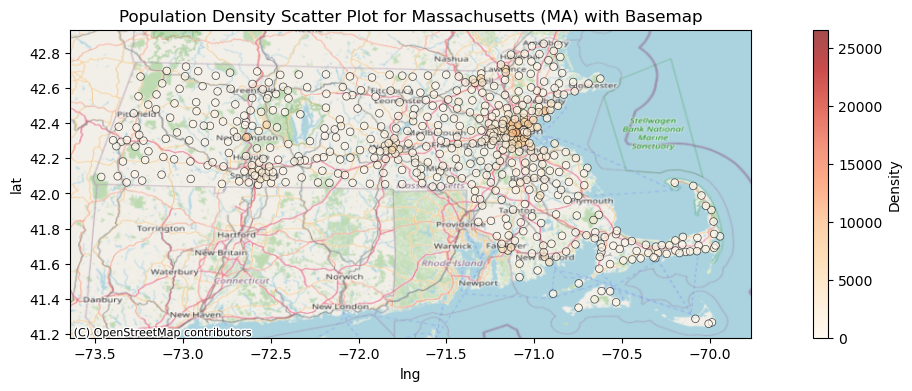

In [175]:
# Create a scatter plot with contextily basemap for the selected state (Massachusetts)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Massachusetts)
scatter = ax.scatter(MA_df['lng'], MA_df['lat'], c=MA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Massachusetts (MA) with Basemap')

# Show the plot
plt.show()

In [176]:
# Filter counties with average density greater than 100 for Massachusetts
MA_high_density_df = result_df_MA[result_df_MA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Massachusetts
MA_low_density_df = result_df_MA[result_df_MA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MA}:')
print(MA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MA}:')
print(MA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in MA:
    County  Average Density
Barnstable       233.578723
   Bristol       902.548571
     Essex      1222.902273
   Hampden       796.087179
 Hampshire       664.388462
 Middlesex      1905.986420
   Norfolk      1271.945000
  Plymouth       557.885714
   Suffolk      6886.745714
 Worcester       470.237647


Counties with Average Density <= 100 in MA:
   County  Average Density
Berkshire        52.157576
    Dukes        95.900000
 Franklin        58.996552
Nantucket        71.100000


In [177]:
# Calculate the number of firebots for each county with average density > 100 in Massachusetts
MA_high_density_df['Number of Firebots'] = MA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MA}:')
print(MA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MA:
    County  Average Density  Number of Firebots
Barnstable       233.578723            2.335787
   Bristol       902.548571            9.025486
     Essex      1222.902273           12.229023
   Hampden       796.087179            7.960872
 Hampshire       664.388462            6.643885
 Middlesex      1905.986420           19.059864
   Norfolk      1271.945000           12.719450
  Plymouth       557.885714            5.578857
   Suffolk      6886.745714           68.867457
 Worcester       470.237647            4.702376


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2505227611.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MA_high_density_df['Number of Firebots'] = MA_high_density_df['Average Density'] / 100


In [178]:
# Filter counties with average density less than or equal to 100 for Massachusetts
MA_low_density_df = result_df_MA[result_df_MA['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MA_low_density_counties = len(MA_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Massachusetts (MA): {MA_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Massachusetts
total_firebots_high_density_MA = MA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Massachusetts (MA):", total_firebots_high_density_MA)


Number of Counties with Average Density <= 100 in Massachusetts (MA): 4

Total Number of Firebots for High Density Counties in Massachusetts (MA): 149.1230570396908


In [179]:
# Display the total number of firebots for Massachusetts
print("Total Number of Firebots for Massachusetts:")
print(total_firebots_high_density_MA + MA_low_density_counties)


Total Number of Firebots for Massachusetts:
153.1230570396908


# Michigan

In [180]:
MI = 'MI'

# Filter the DataFrame for the selected state (Michigan)
MI_df = df[df['state_id'] == MI]

# Calculate the average population density per county
average_density_by_county_MI = MI_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MI = pd.DataFrame({
    'County': average_density_by_county_MI.index,
    'Average Density': average_density_by_county_MI.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MI}:')
print(result_df_MI.to_string(index=False))

Average Population Density by County in MI:
        County  Average Density
        Alcona         9.080000
         Alger         4.433333
       Allegan        83.786667
        Alpena        18.325000
        Antrim        49.190000
        Arenac        14.716667
        Baraga         3.433333
         Barry        37.625000
           Bay        94.710000
        Benzie        40.050000
       Berrien       134.600000
        Branch        29.566667
       Calhoun       109.575000
          Cass        39.514286
    Charlevoix        34.450000
     Cheboygan        39.850000
      Chippewa       257.462500
         Clare        22.060000
       Clinton       113.330000
      Crawford         8.500000
         Delta        67.100000
     Dickinson        63.945455
         Eaton        99.436364
         Emmet        21.760000
       Genesee       361.443478
       Gladwin        16.850000
       Gogebic        29.300000
Grand Traverse        78.828571
       Gratiot        33.471

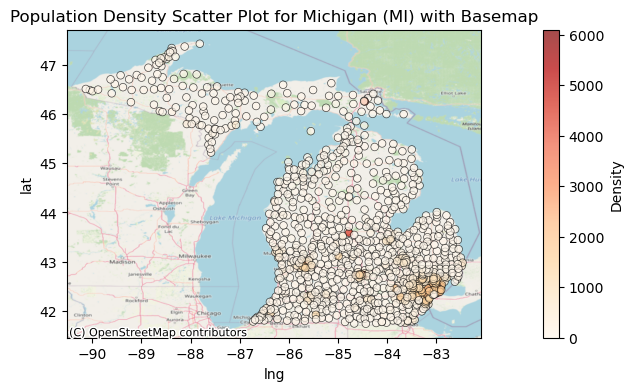

In [181]:
# Create a scatter plot with contextily basemap for the selected state (Michigan)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Michigan)
scatter = ax.scatter(MI_df['lng'], MI_df['lat'], c=MI_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Michigan (MI) with Basemap')

# Show the plot
plt.show()

In [182]:
# Filter counties with average density greater than 100 for Michigan
MI_high_density_df = result_df_MI[result_df_MI['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Michigan
MI_low_density_df = result_df_MI[result_df_MI['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MI}:')
print(MI_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MI}:')
print(MI_low_density_df.to_string(index=False))


Counties with Average Density > 100 in MI:
    County  Average Density
   Berrien       134.600000
   Calhoun       109.575000
  Chippewa       257.462500
   Clinton       113.330000
   Genesee       361.443478
    Ingham       849.066667
     Ionia       143.133333
  Isabella       730.271429
   Jackson       138.483333
 Kalamazoo       415.333333
      Kent       700.229630
Livingston       305.641667
    Macomb      1133.913889
    Monroe       153.217647
  Muskegon       237.857143
   Oakland       884.601471
    Ottawa       209.575000
   Saginaw       254.305263
 St. Clair       126.471429
St. Joseph       153.940000
 Washtenaw       485.914286
     Wayne      1438.549275


Counties with Average Density <= 100 in MI:
        County  Average Density
        Alcona         9.080000
         Alger         4.433333
       Allegan        83.786667
        Alpena        18.325000
        Antrim        49.190000
        Arenac        14.716667
        Baraga         3.433333
         Ba

In [183]:
# Calculate the number of firebots for each county with average density > 100 in Michigan
MI_high_density_df['Number of Firebots'] = MI_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MI}:')
print(MI_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MI:
    County  Average Density  Number of Firebots
   Berrien       134.600000            1.346000
   Calhoun       109.575000            1.095750
  Chippewa       257.462500            2.574625
   Clinton       113.330000            1.133300
   Genesee       361.443478            3.614435
    Ingham       849.066667            8.490667
     Ionia       143.133333            1.431333
  Isabella       730.271429            7.302714
   Jackson       138.483333            1.384833
 Kalamazoo       415.333333            4.153333
      Kent       700.229630            7.002296
Livingston       305.641667            3.056417
    Macomb      1133.913889           11.339139
    Monroe       153.217647            1.532176
  Muskegon       237.857143            2.378571
   Oakland       884.601471            8.846015
    Ottawa       209.575000            2.095750
   Saginaw       254.305263            2.543053
 St. Clair       126.471429            1.2647

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/4045878472.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MI_high_density_df['Number of Firebots'] = MI_high_density_df['Average Density'] / 100


In [184]:
# Filter counties with average density less than or equal to 100 for Michigan
MI_low_density_df = result_df_MI[result_df_MI['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MI_low_density_counties = len(MI_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Michigan (MI): {MI_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Michigan
total_firebots_high_density_MI = MI_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Michigan (MI):", total_firebots_high_density_MI)


Number of Counties with Average Density <= 100 in Michigan (MI): 61

Total Number of Firebots for High Density Counties in Michigan (MI): 93.36915771994279


In [185]:
# Display the total number of firebots for Michigan
print("Total Number of Firebots for Michigan:")
print(total_firebots_high_density_MI + MI_low_density_counties)

Total Number of Firebots for Michigan:
154.3691577199428


# Minnesota

In [186]:
MN = 'MN'

# Filter the DataFrame for the selected state (Minnesota)
MN_df = df[df['state_id'] == MN]

# Calculate the average population density per county
average_density_by_county_MN = MN_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MN = pd.DataFrame({
    'County': average_density_by_county_MN.index,
    'Average Density': average_density_by_county_MN.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MN}:')
print(result_df_MN.to_string(index=False))

Average Population Density by County in MN:
           County  Average Density
           Aitkin         2.922222
            Anoka       646.464286
           Becker        18.700000
         Beltrami         7.258333
           Benton        32.325000
        Big Stone         8.100000
       Blue Earth        83.200000
            Brown        67.516667
          Carlton        16.972727
           Carver       167.891667
             Cass         7.900000
         Chippewa         6.620000
          Chisago        47.666667
             Clay       545.115385
       Clearwater         3.850000
             Cook         1.433333
       Cottonwood         6.233333
        Crow Wing        33.583333
           Dakota       580.873684
            Dodge        21.350000
          Douglas        16.750000
        Faribault         5.977778
         Fillmore         9.054545
         Freeborn        76.733333
          Goodhue        24.560000
            Grant         4.271429
         He

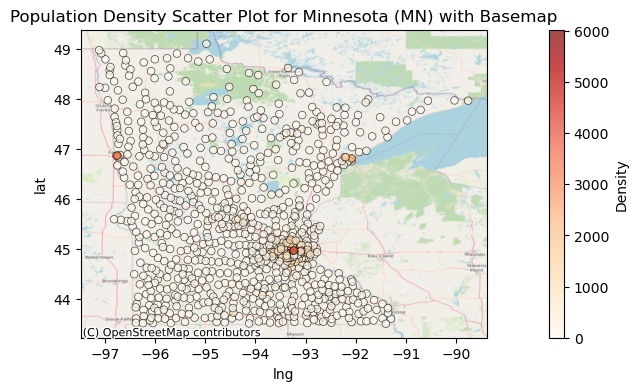

In [187]:
# Create a scatter plot with contextily basemap for the selected state (Minnesota)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Minnesota)
scatter = ax.scatter(MN_df['lng'], MN_df['lat'], c=MN_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Minnesota (MN) with Basemap')

# Show the plot
plt.show()

In [188]:
# Filter counties with average density greater than 100 for Minnesota
MN_high_density_df = result_df_MN[result_df_MN['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Minnesota
MN_low_density_df = result_df_MN[result_df_MN['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MN}:')
print(MN_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MN}:')
print(MN_low_density_df.to_string(index=False))

Counties with Average Density > 100 in MN:
    County  Average Density
     Anoka       646.464286
    Carver       167.891667
      Clay       545.115385
    Dakota       580.873684
  Hennepin      1696.802985
   Olmsted       116.375000
    Ramsey      1747.680000
     Scott       367.057143
 St. Louis       233.471429
   Stearns       167.911538
Washington       483.443750
    Wright       138.750000


Counties with Average Density <= 100 in MN:
           County  Average Density
           Aitkin         2.922222
           Becker        18.700000
         Beltrami         7.258333
           Benton        32.325000
        Big Stone         8.100000
       Blue Earth        83.200000
            Brown        67.516667
          Carlton        16.972727
             Cass         7.900000
         Chippewa         6.620000
          Chisago        47.666667
       Clearwater         3.850000
             Cook         1.433333
       Cottonwood         6.233333
        Crow Wing     

In [189]:
# Calculate the number of firebots for each county with average density > 100 in Minnesota
MN_high_density_df['Number of Firebots'] = MN_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MN}:')
print(MN_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MN:
    County  Average Density  Number of Firebots
     Anoka       646.464286            6.464643
    Carver       167.891667            1.678917
      Clay       545.115385            5.451154
    Dakota       580.873684            5.808737
  Hennepin      1696.802985           16.968030
   Olmsted       116.375000            1.163750
    Ramsey      1747.680000           17.476800
     Scott       367.057143            3.670571
 St. Louis       233.471429            2.334714
   Stearns       167.911538            1.679115
Washington       483.443750            4.834437
    Wright       138.750000            1.387500


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2579402280.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MN_high_density_df['Number of Firebots'] = MN_high_density_df['Average Density'] / 100


In [190]:
# Filter counties with average density less than or equal to 100 for Minnesota
MN_low_density_df = result_df_MN[result_df_MN['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MN_low_density_counties = len(MN_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Minnesota (MN): {MN_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Minnesota
total_firebots_high_density_MN = MN_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Minnesota (MN):", total_firebots_high_density_MN)


Number of Counties with Average Density <= 100 in Minnesota (MN): 76

Total Number of Firebots for High Density Counties in Minnesota (MN): 68.918368661716


In [191]:
# Display the total number of firebots for Minnesota
print("Total Number of Firebots for Minnesota:")
print(total_firebots_high_density_MN + MN_low_density_counties)

Total Number of Firebots for Minnesota:
144.918368661716


# Mississippi

In [192]:
MS = 'MS'

# Filter the DataFrame for the selected state (Mississippi)
MS_df = df[df['state_id'] == MS]

# Calculate the average population density per county
average_density_by_county_MS = MS_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MS = pd.DataFrame({
    'County': average_density_by_county_MS.index,
    'Average Density': average_density_by_county_MS.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MS}:')
print(result_df_MS.to_string(index=False))

Average Population Density by County in MS:
         County  Average Density
          Adams        23.500000
         Alcorn        28.700000
          Amite         6.433333
         Attala         7.285714
         Benton         8.175000
        Bolivar        32.013333
        Calhoun        29.214286
        Carroll        23.160000
      Chickasaw        11.675000
        Choctaw        10.666667
      Claiborne         5.133333
         Clarke        10.480000
           Clay        11.850000
        Coahoma        43.600000
         Copiah        16.025000
      Covington        17.733333
         DeSoto       284.950000
        Forrest       856.333333
       Franklin        33.400000
         George        20.500000
         Greene         6.250000
        Grenada        15.033333
        Hancock       140.366667
       Harrison       448.563636
          Hinds       641.309524
         Holmes         7.375000
      Humphreys         5.880000
      Issaquena         4.066667

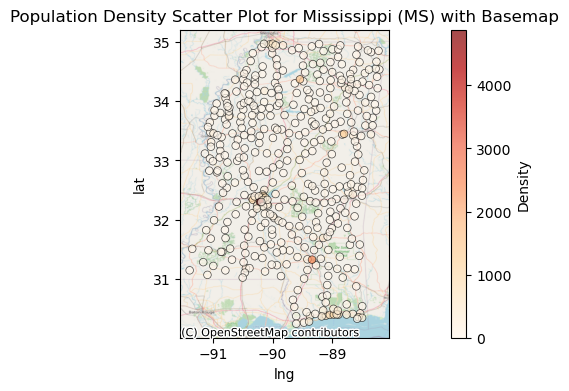

In [193]:
# Create a scatter plot with contextily basemap for the selected state (Mississippi)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Mississippi)
scatter = ax.scatter(MS_df['lng'], MS_df['lat'], c=MS_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Mississippi (MS) with Basemap')

# Show the plot
plt.show()

In [194]:
# Filter counties with average density greater than 100 for Mississippi
MS_high_density_df = result_df_MS[result_df_MS['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Mississippi
MS_low_density_df = result_df_MS[result_df_MS['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MS}:')
print(MS_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MS}:')
print(MS_low_density_df.to_string(index=False))

Counties with Average Density > 100 in MS:
   County  Average Density
   DeSoto       284.950000
  Forrest       856.333333
  Hancock       140.366667
 Harrison       448.563636
    Hinds       641.309524
  Jackson       225.462500
Lafayette       264.833333
  Madison       245.200000
Oktibbeha       482.200000
   Rankin       127.810000


Counties with Average Density <= 100 in MS:
         County  Average Density
          Adams        23.500000
         Alcorn        28.700000
          Amite         6.433333
         Attala         7.285714
         Benton         8.175000
        Bolivar        32.013333
        Calhoun        29.214286
        Carroll        23.160000
      Chickasaw        11.675000
        Choctaw        10.666667
      Claiborne         5.133333
         Clarke        10.480000
           Clay        11.850000
        Coahoma        43.600000
         Copiah        16.025000
      Covington        17.733333
       Franklin        33.400000
         George     

In [195]:
# Calculate the number of firebots for each county with average density > 100 in Mississippi
MS_high_density_df['Number of Firebots'] = MS_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MS}:')
print(MS_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MS:
   County  Average Density  Number of Firebots
   DeSoto       284.950000            2.849500
  Forrest       856.333333            8.563333
  Hancock       140.366667            1.403667
 Harrison       448.563636            4.485636
    Hinds       641.309524            6.413095
  Jackson       225.462500            2.254625
Lafayette       264.833333            2.648333
  Madison       245.200000            2.452000
Oktibbeha       482.200000            4.822000
   Rankin       127.810000            1.278100


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1202365705.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MS_high_density_df['Number of Firebots'] = MS_high_density_df['Average Density'] / 100


In [196]:
# Filter counties with average density less than or equal to 100 for Mississippi
MS_low_density_df = result_df_MS[result_df_MS['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MS_low_density_counties = len(MS_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Mississippi (MS): {MS_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Mississippi
total_firebots_high_density_MS = MS_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Mississippi (MS):", total_firebots_high_density_MS)


Number of Counties with Average Density <= 100 in Mississippi (MS): 72

Total Number of Firebots for High Density Counties in Mississippi (MS): 37.17028993506494


In [197]:
# Display the total number of firebots for Mississippi
print("Total Number of Firebots for Mississippi:")
print(total_firebots_high_density_MS + MS_low_density_counties)

Total Number of Firebots for Mississippi:
109.17028993506494


# Missouri

In [198]:
MO = 'MO'

# Filter the DataFrame for the selected state (Missouri)
MO_df = df[df['state_id'] == MO]

# Calculate the average population density per county
average_density_by_county_MO = MO_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MO = pd.DataFrame({
    'County': average_density_by_county_MO.index,
    'Average Density': average_density_by_county_MO.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MO}:')
print(result_df_MO.to_string(index=False))

Average Population Density by County in MO:
        County  Average Density
         Adair        11.266667
        Andrew        20.690000
      Atchison         3.560000
       Audrain         9.900000
         Barry       101.016667
        Barton         6.900000
         Bates         8.350000
        Benton         9.280000
     Bollinger         5.662500
         Boone       502.090909
      Buchanan       251.040000
        Butler       566.314286
      Caldwell         6.314286
      Callaway        18.270000
        Camden        48.340000
Cape Girardeau        64.645455
       Carroll         3.600000
        Carter         3.575000
          Cass        96.384615
         Cedar         8.566667
      Chariton         4.355556
     Christian        45.453846
         Clark        34.428571
          Clay       412.172222
       Clinton        13.633333
          Cole        54.733333
        Cooper         9.666667
      Crawford        10.944444
          Dade         5.916

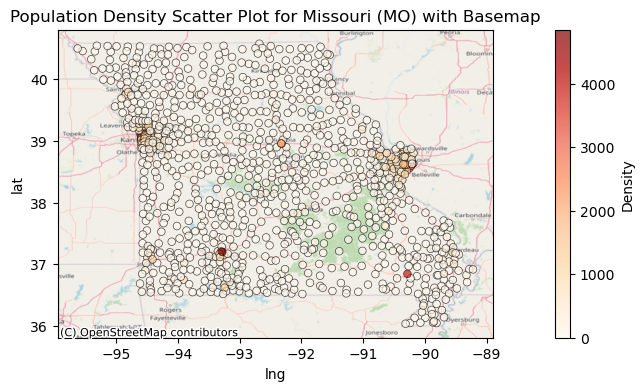

In [199]:
# Create a scatter plot with contextily basemap for the selected state (Missouri)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Missouri)
scatter = ax.scatter(MO_df['lng'], MO_df['lat'], c=MO_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Missouri (MO) with Basemap')

# Show the plot
plt.show()

In [200]:
# Filter counties with average density greater than 100 for Missouri
MO_high_density_df = result_df_MO[result_df_MO['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Missouri
MO_low_density_df = result_df_MO[result_df_MO['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MO}:')
print(MO_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MO}:')
print(MO_low_density_df.to_string(index=False))

Counties with Average Density > 100 in MO:
     County  Average Density
      Barry       101.016667
      Boone       502.090909
   Buchanan       251.040000
     Butler       566.314286
       Clay       412.172222
     Greene       629.333333
    Jackson       819.548214
     Jasper       200.793333
  Jefferson       260.246667
     Platte       155.485714
      Scott       235.427273
St. Charles       349.100000
  St. Louis      1242.869841
      Taney       125.593333


Counties with Average Density <= 100 in MO:
        County  Average Density
         Adair        11.266667
        Andrew        20.690000
      Atchison         3.560000
       Audrain         9.900000
        Barton         6.900000
         Bates         8.350000
        Benton         9.280000
     Bollinger         5.662500
      Caldwell         6.314286
      Callaway        18.270000
        Camden        48.340000
Cape Girardeau        64.645455
       Carroll         3.600000
        Carter         3.575

In [201]:
# Calculate the number of firebots for each county with average density > 100 in Missouri
MO_high_density_df['Number of Firebots'] = MO_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MO}:')
print(MO_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MO:
     County  Average Density  Number of Firebots
      Barry       101.016667            1.010167
      Boone       502.090909            5.020909
   Buchanan       251.040000            2.510400
     Butler       566.314286            5.663143
       Clay       412.172222            4.121722
     Greene       629.333333            6.293333
    Jackson       819.548214            8.195482
     Jasper       200.793333            2.007933
  Jefferson       260.246667            2.602467
     Platte       155.485714            1.554857
      Scott       235.427273            2.354273
St. Charles       349.100000            3.491000
  St. Louis      1242.869841           12.428698
      Taney       125.593333            1.255933


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2369077475.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MO_high_density_df['Number of Firebots'] = MO_high_density_df['Average Density'] / 100


In [202]:
# Filter counties with average density less than or equal to 100 for Missouri
MO_low_density_df = result_df_MO[result_df_MO['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MO_low_density_counties = len(MO_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Missouri (MO): {MO_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Missouri
total_firebots_high_density_MO = MO_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Missouri (MO):", total_firebots_high_density_MO)


Number of Counties with Average Density <= 100 in Missouri (MO): 100

Total Number of Firebots for High Density Counties in Missouri (MO): 58.510317929292924


In [203]:
# Display the total number of firebots for Missouri
print("Total Number of Firebots for Missouri:")
print(total_firebots_high_density_MO + MO_low_density_counties)

Total Number of Firebots for Missouri:
158.5103179292929


# Montana

In [204]:
MT = 'MT'

# Filter the DataFrame for the selected state (Montana)
MT_df = df[df['state_id'] == MT]

# Calculate the average population density per county
average_density_by_county_MT = MT_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_MT = pd.DataFrame({
    'County': average_density_by_county_MT.index,
    'Average Density': average_density_by_county_MT.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {MT}:')
print(result_df_MT.to_string(index=False))

Average Population Density by County in MT:
         County  Average Density
     Beaverhead         0.375000
       Big Horn         1.318182
         Blaine         0.671429
     Broadwater         1.766667
         Carbon         3.180000
         Carter         0.125000
        Cascade       134.613333
       Chouteau         0.457143
         Custer         0.625000
        Daniels         0.325000
         Dawson         0.925000
     Deer Lodge         6.466667
         Fallon         1.033333
         Fergus         0.700000
       Flathead        22.542857
       Gallatin        24.287500
       Garfield         0.050000
        Glacier         1.725000
  Golden Valley         0.300000
        Granite         1.225000
           Hill         1.471429
      Jefferson         3.166667
   Judith Basin         0.416667
           Lake        42.291667
Lewis and Clark        74.554545
        Liberty         0.420000
        Lincoln         2.871429
        Madison         2.400000

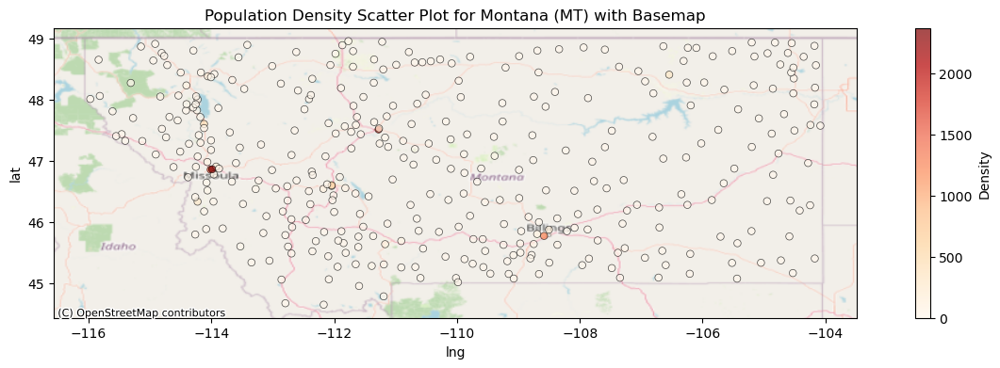

In [205]:
# Create a scatter plot with contextily basemap for the selected state (Montana)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Montana)
scatter = ax.scatter(MT_df['lng'], MT_df['lat'], c=MT_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Montana (MT) with Basemap')

# Show the plot
plt.show()

In [206]:
# Filter counties with average density greater than 100 for Montana
MT_high_density_df = result_df_MT[result_df_MT['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Montana
MT_low_density_df = result_df_MT[result_df_MT['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {MT}:')
print(MT_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {MT}:')
print(MT_low_density_df.to_string(index=False))

Counties with Average Density > 100 in MT:
     County  Average Density
    Cascade       134.613333
   Missoula       308.400000
Yellowstone       127.275000


Counties with Average Density <= 100 in MT:
         County  Average Density
     Beaverhead         0.375000
       Big Horn         1.318182
         Blaine         0.671429
     Broadwater         1.766667
         Carbon         3.180000
         Carter         0.125000
       Chouteau         0.457143
         Custer         0.625000
        Daniels         0.325000
         Dawson         0.925000
     Deer Lodge         6.466667
         Fallon         1.033333
         Fergus         0.700000
       Flathead        22.542857
       Gallatin        24.287500
       Garfield         0.050000
        Glacier         1.725000
  Golden Valley         0.300000
        Granite         1.225000
           Hill         1.471429
      Jefferson         3.166667
   Judith Basin         0.416667
           Lake        42.291667
Lew

In [207]:
# Calculate the number of firebots for each county with average density > 100 in Montana
MT_high_density_df['Number of Firebots'] = MT_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {MT}:')
print(MT_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in MT:
     County  Average Density  Number of Firebots
    Cascade       134.613333            1.346133
   Missoula       308.400000            3.084000
Yellowstone       127.275000            1.272750


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1144468116.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MT_high_density_df['Number of Firebots'] = MT_high_density_df['Average Density'] / 100


In [208]:
# Filter counties with average density less than or equal to 100 for Montana
MT_low_density_df = result_df_MT[result_df_MT['Average Density'] <= 100]

# Count the number of counties with average density <= 100
MT_low_density_counties = len(MT_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Montana (MT): {MT_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Montana
total_firebots_high_density_MT = MT_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Montana (MT):", total_firebots_high_density_MT)


Number of Counties with Average Density <= 100 in Montana (MT): 53

Total Number of Firebots for High Density Counties in Montana (MT): 5.702883333333334


In [209]:
# Display the total number of firebots for Montana
print("Total Number of Firebots for Montana:")
print(total_firebots_high_density_MT + MT_low_density_counties)

Total Number of Firebots for Montana:
58.70288333333333


# Nebraska

In [210]:
NE = 'NE'

# Filter the DataFrame for the selected state (Nebraska)
NE_df = df[df['state_id'] == NE]

# Calculate the average population density per county
average_density_by_county_NE = NE_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NE = pd.DataFrame({
    'County': average_density_by_county_NE.index,
    'Average Density': average_density_by_county_NE.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NE}:')
print(result_df_NE.to_string(index=False))

Average Population Density by County in NE:
      County  Average Density
       Adams        15.016667
    Antelope         2.825000
      Arthur         0.300000
      Banner         0.400000
      Blaine         0.166667
       Boone         2.400000
   Box Butte         2.200000
        Boyd         1.160000
       Brown         0.900000
     Buffalo       212.150000
        Burt         4.940000
      Butler         5.170000
        Cass        34.046667
       Cedar         5.877778
       Chase         1.175000
      Cherry         0.327273
    Cheyenne         2.060000
        Clay         3.170000
      Colfax         7.325000
      Cuming         6.450000
      Custer         1.536364
      Dakota        63.660000
       Dawes         1.666667
      Dawson         5.328571
       Deuel         1.300000
       Dixon        24.675000
       Dodge        71.590000
     Douglas      1199.914286
       Dundy         0.875000
    Fillmore         3.187500
    Franklin         1.775

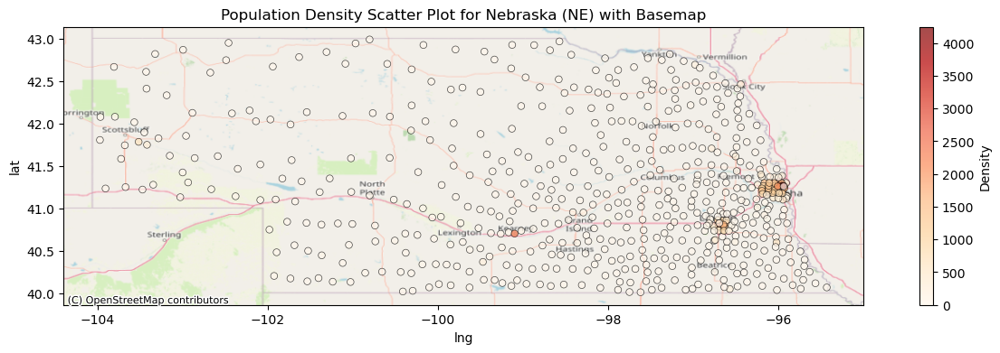

In [211]:
# Create a scatter plot with contextily basemap for the selected state (Nebraska)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Nebraska)
scatter = ax.scatter(NE_df['lng'], NE_df['lat'], c=NE_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Nebraska (NE) with Basemap')

# Show the plot
plt.show()

In [212]:
# Filter counties with average density greater than 100 for Nebraska
NE_high_density_df = result_df_NE[result_df_NE['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Nebraska
NE_low_density_df = result_df_NE[result_df_NE['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NE}:')
print(NE_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NE}:')
print(NE_low_density_df.to_string(index=False))


Counties with Average Density > 100 in NE:
      County  Average Density
     Buffalo       212.150000
     Douglas      1199.914286
   Lancaster       450.602703
       Sarpy       482.707692
Scotts Bluff       202.840000


Counties with Average Density <= 100 in NE:
    County  Average Density
     Adams        15.016667
  Antelope         2.825000
    Arthur         0.300000
    Banner         0.400000
    Blaine         0.166667
     Boone         2.400000
 Box Butte         2.200000
      Boyd         1.160000
     Brown         0.900000
      Burt         4.940000
    Butler         5.170000
      Cass        34.046667
     Cedar         5.877778
     Chase         1.175000
    Cherry         0.327273
  Cheyenne         2.060000
      Clay         3.170000
    Colfax         7.325000
    Cuming         6.450000
    Custer         1.536364
    Dakota        63.660000
     Dawes         1.666667
    Dawson         5.328571
     Deuel         1.300000
     Dixon        24.675000
   

In [213]:
# Calculate the number of firebots for each county with average density > 100 in Nebraska
NE_high_density_df['Number of Firebots'] = NE_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NE}:')
print(NE_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NE:
      County  Average Density  Number of Firebots
     Buffalo       212.150000            2.121500
     Douglas      1199.914286           11.999143
   Lancaster       450.602703            4.506027
       Sarpy       482.707692            4.827077
Scotts Bluff       202.840000            2.028400


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/627554638.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NE_high_density_df['Number of Firebots'] = NE_high_density_df['Average Density'] / 100


In [214]:
# Filter counties with average density less than or equal to 100 for Nebraska
NE_low_density_df = result_df_NE[result_df_NE['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NE_low_density_counties = len(NE_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Nebraska (NE): {NE_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Nebraska
total_firebots_high_density_NE = NE_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Nebraska (NE):", total_firebots_high_density_NE)


Number of Counties with Average Density <= 100 in Nebraska (NE): 88

Total Number of Firebots for High Density Counties in Nebraska (NE): 25.482146807246806


In [215]:
# Display the total number of firebots for Nebraska
print("Total Number of Firebots for Nebraska:")
print(total_firebots_high_density_NE + NE_low_density_counties)


Total Number of Firebots for Nebraska:
113.4821468072468


# Nevada

In [216]:
NV = 'NV'

# Filter the DataFrame for the selected state (Nevada)
NV_df = df[df['state_id'] == NV]

# Calculate the average population density per county
average_density_by_county_NV = NV_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NV = pd.DataFrame({
    'County': average_density_by_county_NV.index,
    'Average Density': average_density_by_county_NV.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NV}:')
print(result_df_NV.to_string(index=False))

Average Population Density by County in NV:
     County  Average Density
Carson City       213.933333
  Churchill         8.233333
      Clark      1302.960526
    Douglas        58.112500
       Elko         2.723077
  Esmeralda        27.866667
     Eureka         1.466667
   Humboldt         2.057143
     Lander         0.500000
    Lincoln         1.040000
       Lyon        14.983333
    Malheur         0.200000
    Mineral         4.875000
        Nye        17.580000
   Pershing         2.500000
     Storey        38.000000
     Washoe       574.430769
 White Pine        36.966667


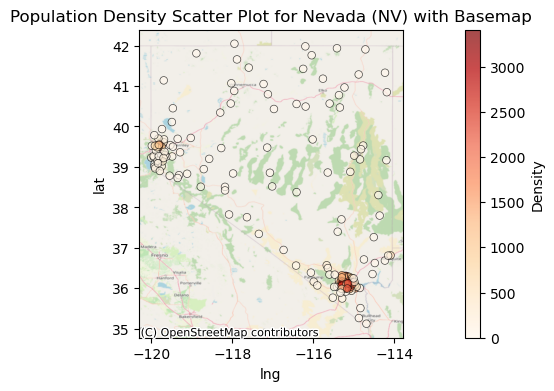

In [217]:
# Create a scatter plot with contextily basemap for the selected state (Nevada)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Nevada)
scatter = ax.scatter(NV_df['lng'], NV_df['lat'], c=NV_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Nevada (NV) with Basemap')

# Show the plot
plt.show()


In [218]:
# Filter counties with average density greater than 100 for Nevada
NV_high_density_df = result_df_NV[result_df_NV['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Nevada
NV_low_density_df = result_df_NV[result_df_NV['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NV}:')
print(NV_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NV}:')
print(NV_low_density_df.to_string(index=False))


Counties with Average Density > 100 in NV:
     County  Average Density
Carson City       213.933333
      Clark      1302.960526
     Washoe       574.430769


Counties with Average Density <= 100 in NV:
    County  Average Density
 Churchill         8.233333
   Douglas        58.112500
      Elko         2.723077
 Esmeralda        27.866667
    Eureka         1.466667
  Humboldt         2.057143
    Lander         0.500000
   Lincoln         1.040000
      Lyon        14.983333
   Malheur         0.200000
   Mineral         4.875000
       Nye        17.580000
  Pershing         2.500000
    Storey        38.000000
White Pine        36.966667


In [219]:
# Calculate the number of firebots for each county with average density > 100 in Nevada
NV_high_density_df['Number of Firebots'] = NV_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NV}:')
print(NV_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NV:
     County  Average Density  Number of Firebots
Carson City       213.933333            2.139333
      Clark      1302.960526           13.029605
     Washoe       574.430769            5.744308


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/3022938575.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NV_high_density_df['Number of Firebots'] = NV_high_density_df['Average Density'] / 100


In [220]:
# Filter counties with average density less than or equal to 100 for Nevada
NV_low_density_df = result_df_NV[result_df_NV['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NV_low_density_counties = len(NV_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Nevada (NV): {NV_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Nevada
total_firebots_high_density_NV = NV_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Nevada (NV):", total_firebots_high_density_NV)


Number of Counties with Average Density <= 100 in Nevada (NV): 15

Total Number of Firebots for High Density Counties in Nevada (NV): 20.91324628879892


In [221]:
# Display the total number of firebots for Nevada
print("Total Number of Firebots for Nevada:")
print(total_firebots_high_density_NV + NV_low_density_counties)

Total Number of Firebots for Nevada:
35.913246288798916


# New Hampshire

In [222]:
NH = 'NH'

# Filter the DataFrame for the selected state (New Hampshire)
NH_df = df[df['state_id'] == NH]

# Calculate the average population density per county
average_density_by_county_NH = NH_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NH = pd.DataFrame({
    'County': average_density_by_county_NH.index,
    'Average Density': average_density_by_county_NH.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NH}:')
print(result_df_NH.to_string(index=False))

Average Population Density by County in NH:
      County  Average Density
     Belknap        65.938462
     Carroll        25.406897
    Cheshire        43.004000
        Coos         9.035714
     Grafton        31.508333
Hillsborough       424.714706
   Merrimack        68.007143
      Oxford         0.300000
  Rockingham       202.244444
   Strafford       162.775000
    Sullivan        33.266667


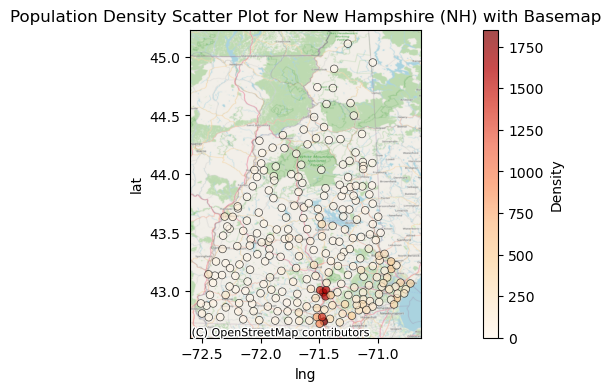

In [223]:
# Create a scatter plot with contextily basemap for the selected state (New Hampshire)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (New Hampshire)
scatter = ax.scatter(NH_df['lng'], NH_df['lat'], c=NH_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for New Hampshire (NH) with Basemap')

# Show the plot
plt.show()

In [224]:
# Filter counties with average density greater than 100 for New Hampshire
NH_high_density_df = result_df_NH[result_df_NH['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for New Hampshire
NH_low_density_df = result_df_NH[result_df_NH['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NH}:')
print(NH_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NH}:')
print(NH_low_density_df.to_string(index=False))

Counties with Average Density > 100 in NH:
      County  Average Density
Hillsborough       424.714706
  Rockingham       202.244444
   Strafford       162.775000


Counties with Average Density <= 100 in NH:
   County  Average Density
  Belknap        65.938462
  Carroll        25.406897
 Cheshire        43.004000
     Coos         9.035714
  Grafton        31.508333
Merrimack        68.007143
   Oxford         0.300000
 Sullivan        33.266667


In [225]:
# Calculate the number of firebots for each county with average density > 100 in New Hampshire
NH_high_density_df['Number of Firebots'] = NH_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NH}:')
print(NH_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NH:
      County  Average Density  Number of Firebots
Hillsborough       424.714706            4.247147
  Rockingham       202.244444            2.022444
   Strafford       162.775000            1.627750


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1456603767.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NH_high_density_df['Number of Firebots'] = NH_high_density_df['Average Density'] / 100


In [226]:
# Filter counties with average density less than or equal to 100 for New Hampshire
NH_low_density_df = result_df_NH[result_df_NH['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NH_low_density_counties = len(NH_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in New Hampshire (NH): {NH_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in New Hampshire
total_firebots_high_density_NH = NH_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in New Hampshire (NH):", total_firebots_high_density_NH)


Number of Counties with Average Density <= 100 in New Hampshire (NH): 8

Total Number of Firebots for High Density Counties in New Hampshire (NH): 7.897341503267973


In [227]:
# Display the total number of firebots for New Hampshire
print("Total Number of Firebots for New Hampshire:")
print(total_firebots_high_density_NH + NH_low_density_counties)

Total Number of Firebots for New Hampshire:
15.897341503267974


# New Jersey

In [228]:
NJ = 'NJ'

# Filter the DataFrame for the selected state (New Jersey)
NJ_df = df[df['state_id'] == NJ]

# Calculate the average population density per county
average_density_by_county_NJ = NJ_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NJ = pd.DataFrame({
    'County': average_density_by_county_NJ.index,
    'Average Density': average_density_by_county_NJ.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NJ}:')
print(result_df_NJ.to_string(index=False))

Average Population Density by County in NJ:
    County  Average Density
  Atlantic       471.696000
    Bergen      2267.683333
Burlington       515.136364
    Camden      1544.864706
  Cape May       212.993750
Cumberland       161.415789
     Essex      3948.064516
Gloucester       526.611538
    Hudson      9522.731250
 Hunterdon       165.880000
    Mercer      1826.618182
 Middlesex      1504.177778
  Monmouth       902.451020
    Morris       620.498000
     Ocean       666.506897
   Passaic      3635.388889
     Salem       120.072727
  Somerset       662.662963
    Sussex       184.073684
     Union      2773.173077
    Warren       124.237500


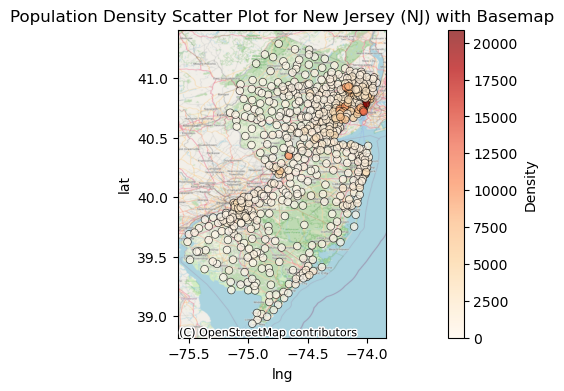

In [229]:
# Create a scatter plot with contextily basemap for the selected state (New Jersey)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (New Jersey)
scatter = ax.scatter(NJ_df['lng'], NJ_df['lat'], c=NJ_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for New Jersey (NJ) with Basemap')

# Show the plot
plt.show()

In [230]:
# Filter counties with average density greater than 100 for New Jersey
NJ_high_density_df = result_df_NJ[result_df_NJ['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for New Jersey
NJ_low_density_df = result_df_NJ[result_df_NJ['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NJ}:')
print(NJ_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NJ}:')
print(NJ_low_density_df.to_string(index=False))


Counties with Average Density > 100 in NJ:
    County  Average Density
  Atlantic       471.696000
    Bergen      2267.683333
Burlington       515.136364
    Camden      1544.864706
  Cape May       212.993750
Cumberland       161.415789
     Essex      3948.064516
Gloucester       526.611538
    Hudson      9522.731250
 Hunterdon       165.880000
    Mercer      1826.618182
 Middlesex      1504.177778
  Monmouth       902.451020
    Morris       620.498000
     Ocean       666.506897
   Passaic      3635.388889
     Salem       120.072727
  Somerset       662.662963
    Sussex       184.073684
     Union      2773.173077
    Warren       124.237500


Counties with Average Density <= 100 in NJ:
Empty DataFrame
Columns: [County, Average Density]
Index: []


In [231]:
# Calculate the number of firebots for each county with average density > 100 in New Jersey
NJ_high_density_df['Number of Firebots'] = NJ_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NJ}:')
print(NJ_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NJ:
    County  Average Density  Number of Firebots
  Atlantic       471.696000            4.716960
    Bergen      2267.683333           22.676833
Burlington       515.136364            5.151364
    Camden      1544.864706           15.448647
  Cape May       212.993750            2.129938
Cumberland       161.415789            1.614158
     Essex      3948.064516           39.480645
Gloucester       526.611538            5.266115
    Hudson      9522.731250           95.227313
 Hunterdon       165.880000            1.658800
    Mercer      1826.618182           18.266182
 Middlesex      1504.177778           15.041778
  Monmouth       902.451020            9.024510
    Morris       620.498000            6.204980
     Ocean       666.506897            6.665069
   Passaic      3635.388889           36.353889
     Salem       120.072727            1.200727
  Somerset       662.662963            6.626630
    Sussex       184.073684            1.8407

In [232]:
# Filter counties with average density less than or equal to 100 for New Jersey
NJ_low_density_df = result_df_NJ[result_df_NJ['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NJ_low_density_counties = len(NJ_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in New Jersey (NJ): {NJ_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in New Jersey
total_firebots_high_density_NJ = NJ_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in New Jersey (NJ):", total_firebots_high_density_NJ)


Number of Counties with Average Density <= 100 in New Jersey (NJ): 0

Total Number of Firebots for High Density Counties in New Jersey (NJ): 323.5693796373033


In [233]:
# Display the total number of firebots for New Jersey
print("Total Number of Firebots for New Jersey:")
print(total_firebots_high_density_NJ + NJ_low_density_counties)

Total Number of Firebots for New Jersey:
323.5693796373033


# New Mexico

In [234]:
NM = 'NM'

# Filter the DataFrame for the selected state (New Mexico)
NM_df = df[df['state_id'] == NM]

# Calculate the average population density per county
average_density_by_county_NM = NM_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NM = pd.DataFrame({
    'County': average_density_by_county_NM.index,
    'Average Density': average_density_by_county_NM.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NM}:')
print(result_df_NM.to_string(index=False))

Average Population Density by County in NM:
    County  Average Density
    Apache         3.200000
Bernalillo       798.341667
    Catron         0.328571
    Chaves         3.728571
    Cibola        13.057143
    Colfax         1.822222
     Curry         7.780000
   De Baca         0.166667
  Doña Ana       260.695652
      Eddy         3.442857
     Grant        42.360000
 Guadalupe         0.340000
   Harding         0.225000
   Hidalgo         2.320000
       Lea       780.200000
   Lincoln        36.360000
Los Alamos       332.500000
      Luna         3.150000
  McKinley        40.757895
      Mora         1.633333
     Otero        17.256250
      Quay         0.642857
Rio Arriba        10.600000
 Roosevelt         2.100000
  San Juan        44.412500
San Miguel         2.623529
  Sandoval        51.836842
  Santa Fe        66.383333
    Sierra         3.366667
   Socorro        12.340000
      Taos        14.855556
  Torrance         1.787500
     Union         0.242857
  Va

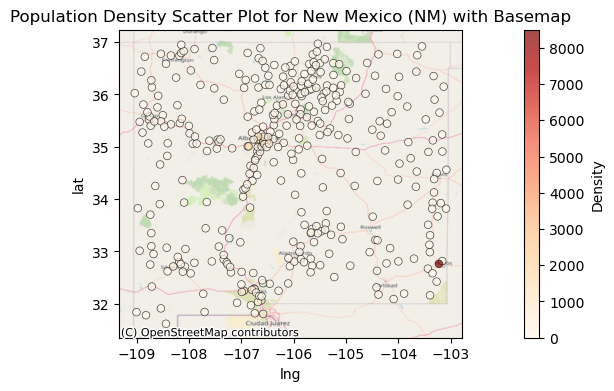

In [235]:
# Create a scatter plot with contextily basemap for the selected state (New Mexico)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (New Mexico)
scatter = ax.scatter(NM_df['lng'], NM_df['lat'], c=NM_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for New Mexico (NM) with Basemap')

# Show the plot
plt.show()

In [236]:
# Filter counties with average density greater than 100 for New Mexico
NM_high_density_df = result_df_NM[result_df_NM['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for New Mexico
NM_low_density_df = result_df_NM[result_df_NM['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NM}:')
print(NM_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NM}:')
print(NM_low_density_df.to_string(index=False))

Counties with Average Density > 100 in NM:
    County  Average Density
Bernalillo       798.341667
  Doña Ana       260.695652
       Lea       780.200000
Los Alamos       332.500000


Counties with Average Density <= 100 in NM:
    County  Average Density
    Apache         3.200000
    Catron         0.328571
    Chaves         3.728571
    Cibola        13.057143
    Colfax         1.822222
     Curry         7.780000
   De Baca         0.166667
      Eddy         3.442857
     Grant        42.360000
 Guadalupe         0.340000
   Harding         0.225000
   Hidalgo         2.320000
   Lincoln        36.360000
      Luna         3.150000
  McKinley        40.757895
      Mora         1.633333
     Otero        17.256250
      Quay         0.642857
Rio Arriba        10.600000
 Roosevelt         2.100000
  San Juan        44.412500
San Miguel         2.623529
  Sandoval        51.836842
  Santa Fe        66.383333
    Sierra         3.366667
   Socorro        12.340000
      Taos     

In [237]:
# Calculate the number of firebots for each county with average density > 100 in New Mexico
NM_high_density_df['Number of Firebots'] = NM_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NM}:')
print(NM_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NM:
    County  Average Density  Number of Firebots
Bernalillo       798.341667            7.983417
  Doña Ana       260.695652            2.606957
       Lea       780.200000            7.802000
Los Alamos       332.500000            3.325000


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2310040862.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NM_high_density_df['Number of Firebots'] = NM_high_density_df['Average Density'] / 100


In [238]:
# Filter counties with average density less than or equal to 100 for New Mexico
NM_low_density_df = result_df_NM[result_df_NM['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NM_low_density_counties = len(NM_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in New Mexico (NM): {NM_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in New Mexico
total_firebots_high_density_NM = NM_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in New Mexico (NM):", total_firebots_high_density_NM)


Number of Counties with Average Density <= 100 in New Mexico (NM): 30

Total Number of Firebots for High Density Counties in New Mexico (NM): 21.717373188405798


In [239]:
# Display the total number of firebots for New Mexico
print("Total Number of Firebots for New Mexico:")
print(total_firebots_high_density_NM + NM_low_density_counties)

Total Number of Firebots for New Mexico:
51.7173731884058


# New York

In [240]:
NY = 'NY'

# Filter the DataFrame for the selected state (New York)
NY_df = df[df['state_id'] == NY]

# Calculate the average population density per county
average_density_by_county_NY = NY_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NY = pd.DataFrame({
    'County': average_density_by_county_NY.index,
    'Average Density': average_density_by_county_NY.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NY}:')
print(result_df_NY.to_string(index=False))

Average Population Density by County in NY:
      County  Average Density
      Albany       692.838462
    Allegany        86.860714
       Bronx     16760.176000
      Broome       262.718182
 Cattaraugus        74.874074
      Cayuga       822.235294
  Chautauqua       131.437143
     Chemung       168.840000
    Chenango        31.206250
     Clinton        97.468000
    Columbia        84.874194
    Cortland        45.254545
    Delaware        24.617647
    Dutchess       286.782353
        Erie      1064.050000
       Essex        28.889655
    Franklin        19.786364
      Fulton        40.014286
     Genesee        54.153333
      Greene        33.316216
    Hamilton         3.076923
    Herkimer        31.152941
   Jefferson       129.223684
       Kings     17182.265789
       Lewis        14.368750
  Livingston        68.290000
     Madison        90.032000
      Monroe      1285.413636
  Montgomery       135.408333
      Nassau      2197.527536
    New York     20572.907

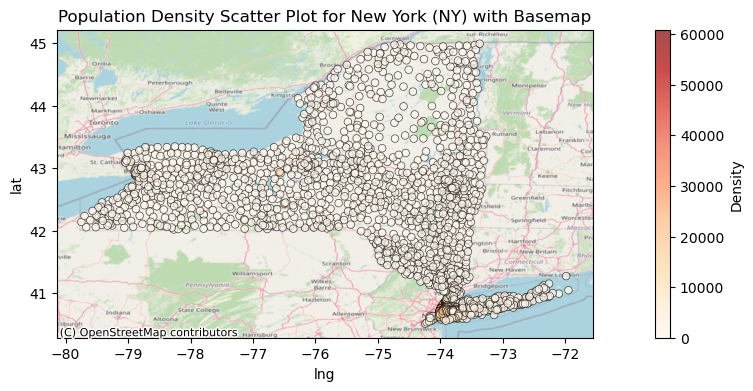

In [241]:
# Create a scatter plot with contextily basemap for the selected state (New York)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (New York)
scatter = ax.scatter(NY_df['lng'], NY_df['lat'], c=NY_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for New York (NY) with Basemap')

# Show the plot
plt.show()


In [242]:
# Filter counties with average density greater than 100 for New York
NY_high_density_df = result_df_NY[result_df_NY['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for New York
NY_low_density_df = result_df_NY[result_df_NY['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NY}:')
print(NY_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NY}:')
print(NY_low_density_df.to_string(index=False))

Counties with Average Density > 100 in NY:
     County  Average Density
     Albany       692.838462
      Bronx     16760.176000
     Broome       262.718182
     Cayuga       822.235294
 Chautauqua       131.437143
    Chemung       168.840000
   Dutchess       286.782353
       Erie      1064.050000
  Jefferson       129.223684
      Kings     17182.265789
     Monroe      1285.413636
 Montgomery       135.408333
     Nassau      2197.527536
   New York     20572.907246
    Niagara       695.535000
     Oneida       174.110870
   Onondaga       761.011111
    Ontario       117.521053
     Orange       193.804348
     Putnam       247.900000
     Queens     10143.639394
 Rensselaer       109.576923
   Richmond      3704.230769
   Rockland       883.173077
   Saratoga       172.054545
Schenectady       958.791667
    Suffolk       795.472222
   Tompkins       253.407692
     Ulster       126.300000
Westchester      1630.931081


Counties with Average Density <= 100 in NY:
      County

In [243]:
# Calculate the number of firebots for each county with average density > 100 in New York
NY_high_density_df['Number of Firebots'] = NY_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NY}:')
print(NY_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NY:
     County  Average Density  Number of Firebots
     Albany       692.838462            6.928385
      Bronx     16760.176000          167.601760
     Broome       262.718182            2.627182
     Cayuga       822.235294            8.222353
 Chautauqua       131.437143            1.314371
    Chemung       168.840000            1.688400
   Dutchess       286.782353            2.867824
       Erie      1064.050000           10.640500
  Jefferson       129.223684            1.292237
      Kings     17182.265789          171.822658
     Monroe      1285.413636           12.854136
 Montgomery       135.408333            1.354083
     Nassau      2197.527536           21.975275
   New York     20572.907246          205.729072
    Niagara       695.535000            6.955350
     Oneida       174.110870            1.741109
   Onondaga       761.011111            7.610111
    Ontario       117.521053            1.175211
     Orange       193.8043

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/498297364.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NY_high_density_df['Number of Firebots'] = NY_high_density_df['Average Density'] / 100


In [244]:
# Filter counties with average density less than or equal to 100 for New York
NY_low_density_df = result_df_NY[result_df_NY['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NY_low_density_counties = len(NY_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in New York (NY): {NY_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in New York
total_firebots_high_density_NY = NY_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in New York (NY):", total_firebots_high_density_NY)


Number of Counties with Average Density <= 100 in New York (NY): 32

Total Number of Firebots for High Density Counties in New York (NY): 826.5928341129885


In [245]:
# Display the total number of firebots for New York
print("Total Number of Firebots for New York:")
print(total_firebots_high_density_NY + NY_low_density_counties)

Total Number of Firebots for New York:
858.5928341129885


# North Carolina

In [246]:
NC = 'NC'

# Filter the DataFrame for the selected state (North Carolina)
NC_df = df[df['state_id'] == NC]

# Calculate the average population density per county
average_density_by_county_NC = NC_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_NC = pd.DataFrame({
    'County': average_density_by_county_NC.index,
    'Average Density': average_density_by_county_NC.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {NC}:')
print(result_df_NC.to_string(index=False))

Average Population Density by County in NC:
      County  Average Density
    Alamance       361.340000
   Alexander        46.200000
   Alleghany        14.550000
       Anson        22.542857
        Ashe        24.900000
       Avery        60.125000
    Beaufort        16.050000
      Bertie        21.675000
      Bladen        21.000000
   Brunswick       105.925000
    Buncombe       218.287500
       Burke       192.355556
    Cabarrus       287.471429
    Caldwell       120.940000
      Camden        17.333333
    Carteret       118.382353
     Caswell        19.200000
     Catawba       162.022222
     Chatham        59.018182
    Cherokee        27.466667
      Chowan        25.300000
        Clay        17.200000
   Cleveland       211.266667
    Columbus        23.200000
      Craven       216.188889
  Cumberland       356.588235
   Currituck        51.466667
        Dare       112.435714
    Davidson       175.062500
       Davie       215.566667
      Duplin        35.741

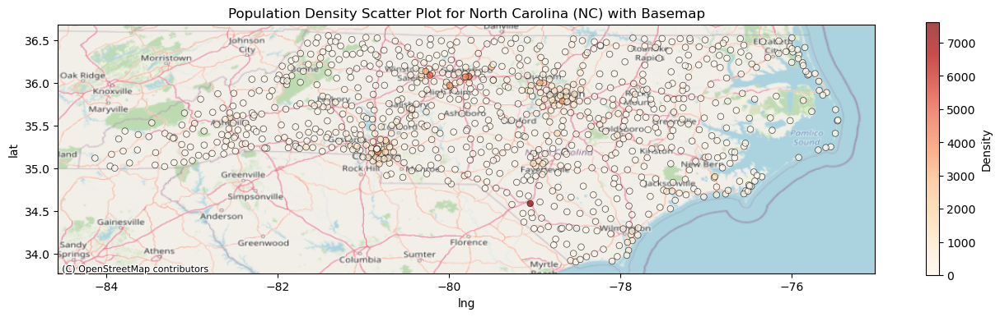

In [247]:
# Create a scatter plot with contextily basemap for the selected state (North Carolina)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (North Carolina)
scatter = ax.scatter(NC_df['lng'], NC_df['lat'], c=NC_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for North Carolina (NC) with Basemap')

# Show the plot
plt.show()

In [248]:
# Filter counties with average density greater than 100 for North Carolina
NC_high_density_df = result_df_NC[result_df_NC['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for North Carolina
NC_low_density_df = result_df_NC[result_df_NC['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {NC}:')
print(NC_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {NC}:')
print(NC_low_density_df.to_string(index=False))

Counties with Average Density > 100 in NC:
     County  Average Density
   Alamance       361.340000
  Brunswick       105.925000
   Buncombe       218.287500
      Burke       192.355556
   Cabarrus       287.471429
   Caldwell       120.940000
   Carteret       118.382353
    Catawba       162.022222
  Cleveland       211.266667
     Craven       216.188889
 Cumberland       356.588235
       Dare       112.435714
   Davidson       175.062500
      Davie       215.566667
     Durham       783.560000
    Forsyth       857.987500
     Gaston       333.792857
   Guilford       880.080769
    Harnett       224.818182
  Henderson       156.430769
    Iredell       132.722222
   Johnston       168.609091
    Lincoln       106.840000
Mecklenburg      1142.888235
       Nash       138.187500
New Hanover       468.060000
     Onslow       189.469231
     Orange       385.928571
 Perquimans       169.166667
       Pitt       124.791667
   Richmond       146.066667
    Robeson       549.586667


In [249]:
# Calculate the number of firebots for each county with average density > 100 in North Carolina
NC_high_density_df['Number of Firebots'] = NC_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {NC}:')
print(NC_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in NC:
     County  Average Density  Number of Firebots
   Alamance       361.340000            3.613400
  Brunswick       105.925000            1.059250
   Buncombe       218.287500            2.182875
      Burke       192.355556            1.923556
   Cabarrus       287.471429            2.874714
   Caldwell       120.940000            1.209400
   Carteret       118.382353            1.183824
    Catawba       162.022222            1.620222
  Cleveland       211.266667            2.112667
     Craven       216.188889            2.161889
 Cumberland       356.588235            3.565882
       Dare       112.435714            1.124357
   Davidson       175.062500            1.750625
      Davie       215.566667            2.155667
     Durham       783.560000            7.835600
    Forsyth       857.987500            8.579875
     Gaston       333.792857            3.337929
   Guilford       880.080769            8.800808
    Harnett       224.8181

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1142156974.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NC_high_density_df['Number of Firebots'] = NC_high_density_df['Average Density'] / 100


In [250]:
# Filter counties with average density less than or equal to 100 for North Carolina
NC_low_density_df = result_df_NC[result_df_NC['Average Density'] <= 100]

# Count the number of counties with average density <= 100
NC_low_density_counties = len(NC_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in North Carolina (NC): {NC_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in North Carolina
total_firebots_high_density_NC = NC_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in North Carolina (NC):", total_firebots_high_density_NC)


Number of Counties with Average Density <= 100 in North Carolina (NC): 61

Total Number of Firebots for High Density Counties in North Carolina (NC): 114.9318742104301


In [251]:
# Display the total number of firebots for North Carolina
print("Total Number of Firebots for North Carolina:")
print(total_firebots_high_density_NC + NC_low_density_counties)

Total Number of Firebots for North Carolina:
175.9318742104301


# North Dakota

In [252]:
ND = 'ND'

# Filter the DataFrame for the selected state (North Dakota)
ND_df = df[df['state_id'] == ND]

# Calculate the average population density per county
average_density_by_county_ND = ND_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_ND = pd.DataFrame({
    'County': average_density_by_county_ND.index,
    'Average Density': average_density_by_county_ND.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {ND}:')
print(result_df_ND.to_string(index=False))

Average Population Density by County in ND:
       County  Average Density
        Adams         0.850000
       Barnes         1.566667
       Benson         4.850000
     Billings         0.566667
    Bottineau         1.200000
       Bowman         0.675000
        Burke         0.950000
     Burleigh        59.008333
         Cass       290.068000
     Cavalier         0.670000
       Dickey         1.440000
       Divide         0.820000
         Dunn         1.028571
         Eddy         1.200000
       Emmons         0.800000
       Foster         1.500000
Golden Valley         0.900000
  Grand Forks       226.468750
        Grant         0.580000
       Griggs         9.440000
    Hettinger         0.600000
       Kidder         0.733333
      LaMoure         1.214286
        Logan         0.625000
      McHenry         1.408333
     McIntosh         1.000000
     McKenzie         1.533333
       McLean         4.715385
       Mercer         2.800000
       Morton         3.16

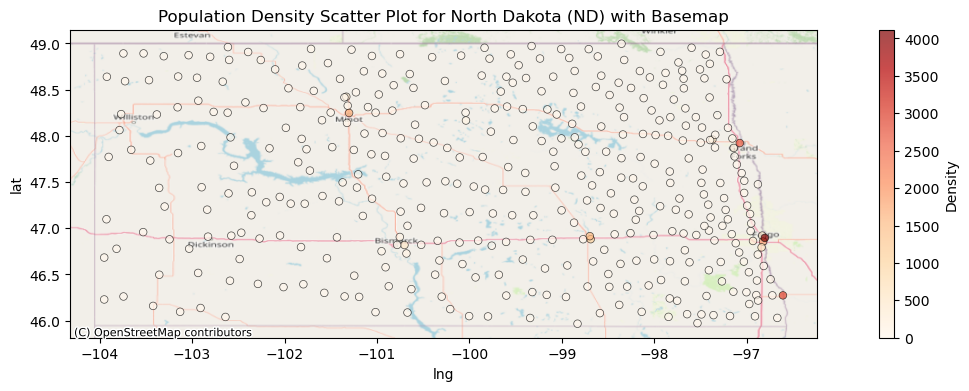

In [253]:
# Create a scatter plot with contextily basemap for the selected state (North Dakota)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (North Dakota)
scatter = ax.scatter(ND_df['lng'], ND_df['lat'], c=ND_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for North Dakota (ND) with Basemap')

# Show the plot
plt.show()

In [254]:
# Filter counties with average density greater than 100 for North Dakota
ND_high_density_df = result_df_ND[result_df_ND['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for North Dakota
ND_low_density_df = result_df_ND[result_df_ND['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {ND}:')
print(ND_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {ND}:')
print(ND_low_density_df.to_string(index=False))

Counties with Average Density > 100 in ND:
     County  Average Density
       Cass       290.068000
Grand Forks       226.468750
   Richland       196.120000
   Stutsman       206.476923
       Ward       163.164286


Counties with Average Density <= 100 in ND:
       County  Average Density
        Adams         0.850000
       Barnes         1.566667
       Benson         4.850000
     Billings         0.566667
    Bottineau         1.200000
       Bowman         0.675000
        Burke         0.950000
     Burleigh        59.008333
     Cavalier         0.670000
       Dickey         1.440000
       Divide         0.820000
         Dunn         1.028571
         Eddy         1.200000
       Emmons         0.800000
       Foster         1.500000
Golden Valley         0.900000
        Grant         0.580000
       Griggs         9.440000
    Hettinger         0.600000
       Kidder         0.733333
      LaMoure         1.214286
        Logan         0.625000
      McHenry         1.

In [255]:
# Calculate the number of firebots for each county with average density > 100 in North Dakota
ND_high_density_df['Number of Firebots'] = ND_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {ND}:')
print(ND_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in ND:
     County  Average Density  Number of Firebots
       Cass       290.068000            2.900680
Grand Forks       226.468750            2.264687
   Richland       196.120000            1.961200
   Stutsman       206.476923            2.064769
       Ward       163.164286            1.631643


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1261668561.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ND_high_density_df['Number of Firebots'] = ND_high_density_df['Average Density'] / 100


In [256]:
# Filter counties with average density less than or equal to 100 for North Dakota
ND_low_density_df = result_df_ND[result_df_ND['Average Density'] <= 100]

# Count the number of counties with average density <= 100
ND_low_density_counties = len(ND_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in North Dakota (ND): {ND_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in North Dakota
total_firebots_high_density_ND = ND_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in North Dakota (ND):", total_firebots_high_density_ND)


Number of Counties with Average Density <= 100 in North Dakota (ND): 48

Total Number of Firebots for High Density Counties in North Dakota (ND): 10.822979587912089


In [257]:
# Display the total number of firebots for North Dakota
print("Total Number of Firebots for North Dakota:")
print(total_firebots_high_density_ND + ND_low_density_counties)

Total Number of Firebots for North Dakota:
58.82297958791209


# Ohio

In [258]:
OH = 'OH'

# Filter the DataFrame for the selected state (Ohio)
OH_df = df[df['state_id'] == OH]

# Calculate the average population density per county
average_density_by_county_OH = OH_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_OH = pd.DataFrame({
    'County': average_density_by_county_OH.index,
    'Average Density': average_density_by_county_OH.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {OH}:')
print(result_df_OH.to_string(index=False))

Average Population Density by County in OH:
    County  Average Density
     Adams       209.880000
     Allen       225.000000
   Ashland        94.500000
 Ashtabula        52.986667
    Athens       143.771429
  Auglaize       175.450000
   Belmont       115.041667
     Brown       142.972727
    Butler       391.942857
   Carroll        67.091667
 Champaign       179.270000
     Clark       315.750000
  Clermont       225.187500
   Clinton       100.944444
Columbiana       105.336842
 Coshocton        67.155556
  Crawford       517.685714
  Cuyahoga      1403.840385
     Darke       164.943750
  Defiance        30.100000
  Delaware       316.963636
      Erie       105.971429
 Fairfield       191.528571
   Fayette       106.825000
  Franklin      1390.743182
    Fulton       106.125000
    Gallia        53.442857
    Geauga        88.490909
    Greene       436.917647
  Guernsey       103.053846
  Hamilton      1094.429630
   Hancock        82.458333
    Hardin        66.170000
  Ha

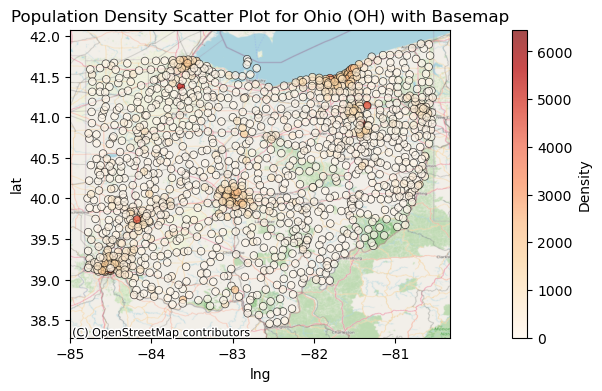

In [259]:
# Create a scatter plot with contextily basemap for the selected state (Ohio)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Ohio)
scatter = ax.scatter(OH_df['lng'], OH_df['lat'], c=OH_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Ohio (OH) with Basemap')

# Show the plot
plt.show()


In [260]:
# Filter counties with average density greater than 100 for Ohio
OH_high_density_df = result_df_OH[result_df_OH['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Ohio
OH_low_density_df = result_df_OH[result_df_OH['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {OH}:')
print(OH_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {OH}:')
print(OH_low_density_df.to_string(index=False))

Counties with Average Density > 100 in OH:
    County  Average Density
     Adams       209.880000
     Allen       225.000000
    Athens       143.771429
  Auglaize       175.450000
   Belmont       115.041667
     Brown       142.972727
    Butler       391.942857
 Champaign       179.270000
     Clark       315.750000
  Clermont       225.187500
   Clinton       100.944444
Columbiana       105.336842
  Crawford       517.685714
  Cuyahoga      1403.840385
     Darke       164.943750
  Delaware       316.963636
      Erie       105.971429
 Fairfield       191.528571
   Fayette       106.825000
  Franklin      1390.743182
    Fulton       106.125000
    Greene       436.917647
  Guernsey       103.053846
  Hamilton      1094.429630
  Highland       144.171429
    Holmes       109.626667
 Jefferson       196.075000
      Lake       517.975000
   Licking       203.647059
    Lorain       454.073333
     Lucas       936.896154
  Mahoning       461.017857
    Medina       199.338462
    M

In [261]:
# Calculate the number of firebots for each county with average density > 100 in Ohio
OH_high_density_df['Number of Firebots'] = OH_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {OH}:')
print(OH_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in OH:
    County  Average Density  Number of Firebots
     Adams       209.880000            2.098800
     Allen       225.000000            2.250000
    Athens       143.771429            1.437714
  Auglaize       175.450000            1.754500
   Belmont       115.041667            1.150417
     Brown       142.972727            1.429727
    Butler       391.942857            3.919429
 Champaign       179.270000            1.792700
     Clark       315.750000            3.157500
  Clermont       225.187500            2.251875
   Clinton       100.944444            1.009444
Columbiana       105.336842            1.053368
  Crawford       517.685714            5.176857
  Cuyahoga      1403.840385           14.038404
     Darke       164.943750            1.649437
  Delaware       316.963636            3.169636
      Erie       105.971429            1.059714
 Fairfield       191.528571            1.915286
   Fayette       106.825000            1.0682

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/640668015.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OH_high_density_df['Number of Firebots'] = OH_high_density_df['Average Density'] / 100


In [262]:
# Filter counties with average density less than or equal to 100 for Ohio
OH_low_density_df = result_df_OH[result_df_OH['Average Density'] <= 100]

# Count the number of counties with average density <= 100
OH_low_density_counties = len(OH_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Ohio (OH): {OH_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Ohio
total_firebots_high_density_OH = OH_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Ohio (OH):", total_firebots_high_density_OH)


Number of Counties with Average Density <= 100 in Ohio (OH): 33

Total Number of Firebots for High Density Counties in Ohio (OH): 176.75416906022406


In [263]:
# Display the total number of firebots for Ohio
print("Total Number of Firebots for Ohio:")
print(total_firebots_high_density_OH + OH_low_density_counties)

Total Number of Firebots for Ohio:
209.75416906022406


# Oklahoma

In [264]:
OK = 'OK'

# Filter the DataFrame for the selected state (Oklahoma)
OK_df = df[df['state_id'] == OK]

# Calculate the average population density per county
average_density_by_county_OK = OK_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_OK = pd.DataFrame({
    'County': average_density_by_county_OK.index,
    'Average Density': average_density_by_county_OK.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {OK}:')
print(result_df_OK.to_string(index=False))

Average Population Density by County in OK:
      County  Average Density
       Adair        12.300000
     Alfalfa         2.700000
       Atoka         4.433333
      Beaver         1.216667
     Beckham         8.220000
      Blaine         2.687500
       Bryan        32.576923
       Caddo         8.692308
    Canadian        72.550000
      Carter        27.800000
    Cherokee        15.842857
     Choctaw         7.042857
    Cimarron         0.425000
   Cleveland       370.269231
        Coal         8.000000
    Comanche        73.741667
      Cotton         3.016667
       Craig        15.500000
       Creek        70.278571
      Custer        11.266667
    Delaware        26.522222
       Dewey         1.857143
       Ellis         2.916667
    Garfield        33.968750
      Garvin        11.828571
       Grady        17.745455
       Grant         1.642857
       Greer         3.300000
      Harmon         1.566667
      Harper         0.900000
     Haskell        14.266

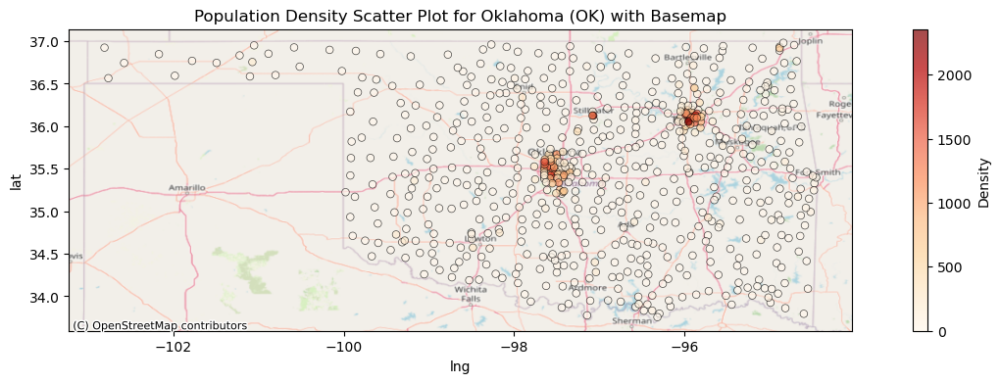

In [265]:
# Create a scatter plot with contextily basemap for the selected state (Oklahoma)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Oklahoma)
scatter = ax.scatter(OK_df['lng'], OK_df['lat'], c=OK_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Oklahoma (OK) with Basemap')

# Show the plot
plt.show()

In [266]:
# Filter counties with average density greater than 100 for Oklahoma
OK_high_density_df = result_df_OK[result_df_OK['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Oklahoma
OK_low_density_df = result_df_OK[result_df_OK['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {OK}:')
print(OK_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {OK}:')
print(OK_low_density_df.to_string(index=False))

Counties with Average Density > 100 in OK:
    County  Average Density
 Cleveland       370.269231
  Oklahoma       746.971154
    Ottawa       147.628571
     Payne       430.222222
     Tulsa       900.394118
Washington       146.133333


Counties with Average Density <= 100 in OK:
      County  Average Density
       Adair        12.300000
     Alfalfa         2.700000
       Atoka         4.433333
      Beaver         1.216667
     Beckham         8.220000
      Blaine         2.687500
       Bryan        32.576923
       Caddo         8.692308
    Canadian        72.550000
      Carter        27.800000
    Cherokee        15.842857
     Choctaw         7.042857
    Cimarron         0.425000
        Coal         8.000000
    Comanche        73.741667
      Cotton         3.016667
       Craig        15.500000
       Creek        70.278571
      Custer        11.266667
    Delaware        26.522222
       Dewey         1.857143
       Ellis         2.916667
    Garfield        33.96

In [267]:
# Calculate the number of firebots for each county with average density > 100 in Oklahoma
OK_high_density_df['Number of Firebots'] = OK_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {OK}:')
print(OK_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in OK:
    County  Average Density  Number of Firebots
 Cleveland       370.269231            3.702692
  Oklahoma       746.971154            7.469712
    Ottawa       147.628571            1.476286
     Payne       430.222222            4.302222
     Tulsa       900.394118            9.003941
Washington       146.133333            1.461333


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1365217837.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OK_high_density_df['Number of Firebots'] = OK_high_density_df['Average Density'] / 100


In [268]:
# Filter counties with average density less than or equal to 100 for Oklahoma
OK_low_density_df = result_df_OK[result_df_OK['Average Density'] <= 100]

# Count the number of counties with average density <= 100
OK_low_density_counties = len(OK_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Oklahoma (OK): {OK_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Oklahoma
total_firebots_high_density_OK = OK_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Oklahoma (OK):", total_firebots_high_density_OK)


Number of Counties with Average Density <= 100 in Oklahoma (OK): 71

Total Number of Firebots for High Density Counties in Oklahoma (OK): 27.4161862924657


In [269]:
# Display the total number of firebots for Oklahoma
print("Total Number of Firebots for Oklahoma:")
print(total_firebots_high_density_OK + OK_low_density_counties)

Total Number of Firebots for Oklahoma:
98.4161862924657


# Oregon

In [270]:
OR = 'OR'

# Filter the DataFrame for the selected state (Oregon)
OR_df = df[df['state_id'] == OR]

# Calculate the average population density per county
average_density_by_county_OR = OR_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_OR = pd.DataFrame({
    'County': average_density_by_county_OR.index,
    'Average Density': average_density_by_county_OR.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {OR}:')
print(result_df_OR.to_string(index=False))

Average Population Density by County in OR:
    County  Average Density
     Baker         1.410000
    Benton       473.566667
 Clackamas       523.266667
   Clatsop        57.114286
  Columbia       146.150000
      Coos        21.062500
     Crook         4.400000
     Curry         7.450000
 Deschutes        57.455556
   Douglas        52.734615
   Gilliam         0.650000
     Grant         1.318182
    Harney         0.622222
Hood River        20.533333
   Jackson       123.253333
 Jefferson         6.850000
 Josephine        25.110000
   Klamath         9.470588
      Lake         0.537500
      Lane       201.454286
   Lincoln        77.825000
      Linn        46.370588
   Malheur         3.146154
    Marion       450.823077
     Modoc         2.600000
    Morrow        10.860000
 Multnomah      2066.496970
      Polk        81.133333
   Sherman         2.800000
 Tillamook       101.484615
  Umatilla        22.215385
     Union         7.600000
   Wallowa         1.240000
    

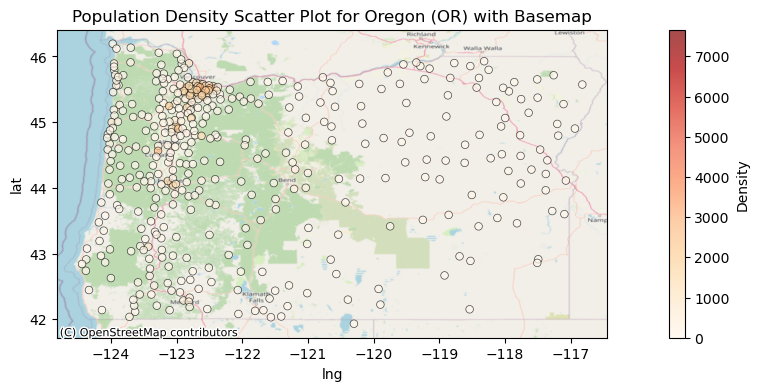

In [271]:
# Create a scatter plot with contextily basemap for the selected state (Oregon)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Oregon)
scatter = ax.scatter(OR_df['lng'], OR_df['lat'], c=OR_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Oregon (OR) with Basemap')

# Show the plot
plt.show()

In [272]:
# Filter counties with average density greater than 100 for Oregon
OR_high_density_df = result_df_OR[result_df_OR['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Oregon
OR_low_density_df = result_df_OR[result_df_OR['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {OR}:')
print(OR_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {OR}:')
print(OR_low_density_df.to_string(index=False))

Counties with Average Density > 100 in OR:
    County  Average Density
    Benton       473.566667
 Clackamas       523.266667
  Columbia       146.150000
   Jackson       123.253333
      Lane       201.454286
    Marion       450.823077
 Multnomah      2066.496970
 Tillamook       101.484615
Washington       872.643478
   Yamhill       237.618182


Counties with Average Density <= 100 in OR:
    County  Average Density
     Baker         1.410000
   Clatsop        57.114286
      Coos        21.062500
     Crook         4.400000
     Curry         7.450000
 Deschutes        57.455556
   Douglas        52.734615
   Gilliam         0.650000
     Grant         1.318182
    Harney         0.622222
Hood River        20.533333
 Jefferson         6.850000
 Josephine        25.110000
   Klamath         9.470588
      Lake         0.537500
   Lincoln        77.825000
      Linn        46.370588
   Malheur         3.146154
     Modoc         2.600000
    Morrow        10.860000
      Polk     

In [273]:
# Calculate the number of firebots for each county with average density > 100 in Oregon
OR_high_density_df['Number of Firebots'] = OR_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {OR}:')
print(OR_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in OR:
    County  Average Density  Number of Firebots
    Benton       473.566667            4.735667
 Clackamas       523.266667            5.232667
  Columbia       146.150000            1.461500
   Jackson       123.253333            1.232533
      Lane       201.454286            2.014543
    Marion       450.823077            4.508231
 Multnomah      2066.496970           20.664970
 Tillamook       101.484615            1.014846
Washington       872.643478            8.726435
   Yamhill       237.618182            2.376182


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1281947097.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OR_high_density_df['Number of Firebots'] = OR_high_density_df['Average Density'] / 100


In [274]:
# Filter counties with average density less than or equal to 100 for Oregon
OR_low_density_df = result_df_OR[result_df_OR['Average Density'] <= 100]

# Count the number of counties with average density <= 100
OR_low_density_counties = len(OR_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Oregon (OR): {OR_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Oregon
total_firebots_high_density_OR = OR_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Oregon (OR):", total_firebots_high_density_OR)


Number of Counties with Average Density <= 100 in Oregon (OR): 27

Total Number of Firebots for High Density Counties in Oregon (OR): 51.96757274464666


In [275]:
# Display the total number of firebots for Oregon
print("Total Number of Firebots for Oregon:")
print(total_firebots_high_density_OR + OR_low_density_counties)

Total Number of Firebots for Oregon:
78.96757274464666


# Pennsylvania

In [276]:
PA = 'PA'

# Filter the DataFrame for the selected state (Pennsylvania)
PA_df = df[df['state_id'] == PA]

# Calculate the average population density per county
average_density_by_county_PA = PA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_PA = pd.DataFrame({
    'County': average_density_by_county_PA.index,
    'Average Density': average_density_by_county_PA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {PA}:')
print(result_df_PA.to_string(index=False))

Average Population Density by County in PA:
        County  Average Density
         Adams       314.428571
     Allegheny      1225.460194
     Armstrong       253.488889
        Beaver       221.835000
       Bedford        65.908696
         Berks       781.460784
         Blair       268.986667
      Bradford        33.513043
         Bucks       535.972917
        Butler       137.667742
       Cambria       155.497872
       Cameron         3.133333
        Carbon       186.943750
        Centre       313.687097
       Chester       476.764103
       Clarion        52.972727
    Clearfield        56.012195
       Clinton        90.930769
      Columbia        73.807692
      Crawford        36.800000
    Cumberland       419.217647
       Dauphin       711.673077
      Delaware      1846.271795
           Elk       106.883333
          Erie       717.912121
       Fayette       146.662069
        Forest         8.028571
      Franklin       249.900000
        Fulton        11.150

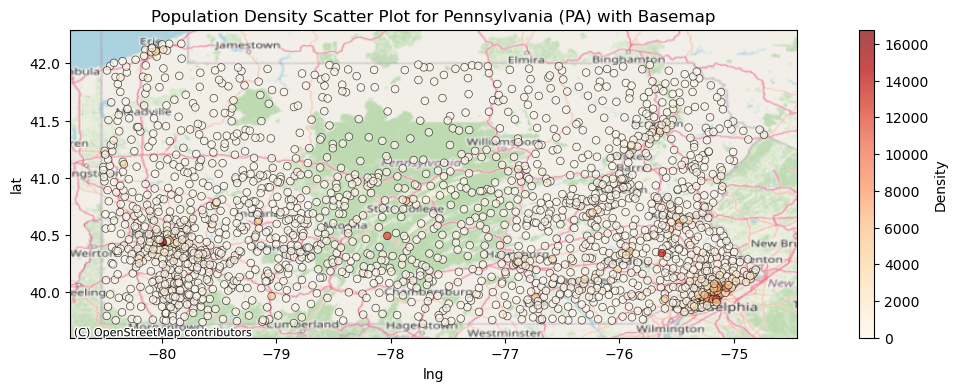

In [277]:
# Create a scatter plot with contextily basemap for the selected state (Pennsylvania)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Pennsylvania)
scatter = ax.scatter(PA_df['lng'], PA_df['lat'], c=PA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Pennsylvania (PA) with Basemap')

# Show the plot
plt.show()

In [278]:
# Filter counties with average density greater than 100 for Pennsylvania
PA_high_density_df = result_df_PA[result_df_PA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Pennsylvania
PA_low_density_df = result_df_PA[result_df_PA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {PA}:')
print(PA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {PA}:')
print(PA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in PA:
        County  Average Density
         Adams       314.428571
     Allegheny      1225.460194
     Armstrong       253.488889
        Beaver       221.835000
         Berks       781.460784
         Blair       268.986667
         Bucks       535.972917
        Butler       137.667742
       Cambria       155.497872
        Carbon       186.943750
        Centre       313.687097
       Chester       476.764103
    Cumberland       419.217647
       Dauphin       711.673077
      Delaware      1846.271795
           Elk       106.883333
          Erie       717.912121
       Fayette       146.662069
      Franklin       249.900000
        Greene       105.056522
    Huntingdon       487.878571
       Indiana       216.802174
     Jefferson       122.545833
    Lackawanna       559.133333
     Lancaster       478.983019
      Lawrence       352.962500
       Lebanon       752.093750
        Lehigh      1069.982143
       Luzerne       348.3707

In [279]:
# Calculate the number of firebots for each county with average density > 100 in Pennsylvania
PA_high_density_df['Number of Firebots'] = PA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {PA}:')
print(PA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in PA:
        County  Average Density  Number of Firebots
         Adams       314.428571            3.144286
     Allegheny      1225.460194           12.254602
     Armstrong       253.488889            2.534889
        Beaver       221.835000            2.218350
         Berks       781.460784            7.814608
         Blair       268.986667            2.689867
         Bucks       535.972917            5.359729
        Butler       137.667742            1.376677
       Cambria       155.497872            1.554979
        Carbon       186.943750            1.869437
        Centre       313.687097            3.136871
       Chester       476.764103            4.767641
    Cumberland       419.217647            4.192176
       Dauphin       711.673077            7.116731
      Delaware      1846.271795           18.462718
           Elk       106.883333            1.068833
          Erie       717.912121            7.179121
       Fayette       

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1318376443.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PA_high_density_df['Number of Firebots'] = PA_high_density_df['Average Density'] / 100


In [280]:
# Filter counties with average density less than or equal to 100 for Pennsylvania
PA_low_density_df = result_df_PA[result_df_PA['Average Density'] <= 100]

# Count the number of counties with average density <= 100
PA_low_density_counties = len(PA_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Pennsylvania (PA): {PA_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Pennsylvania
total_firebots_high_density_PA = PA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Pennsylvania (PA):", total_firebots_high_density_PA)


Number of Counties with Average Density <= 100 in Pennsylvania (PA): 23

Total Number of Firebots for High Density Counties in Pennsylvania (PA): 235.88824143305914


In [281]:
# Display the total number of firebots for Pennsylvania
print("Total Number of Firebots for Pennsylvania:")
print(total_firebots_high_density_PA + PA_low_density_counties)

Total Number of Firebots for Pennsylvania:
258.88824143305914


# Rhode Island

In [282]:
RI = 'RI'

# Filter the DataFrame for the selected state (Rhode Island)
RI_df = df[df['state_id'] == RI]

# Calculate the average population density per county
average_density_by_county_RI = RI_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_RI = pd.DataFrame({
    'County': average_density_by_county_RI.index,
    'Average Density': average_density_by_county_RI.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {RI}:')
print(result_df_RI.to_string(index=False))

Average Population Density by County in RI:
    County  Average Density
   Bristol       796.333333
      Kent       695.637500
   Newport       512.537500
Providence      1857.197619
Washington       160.195000


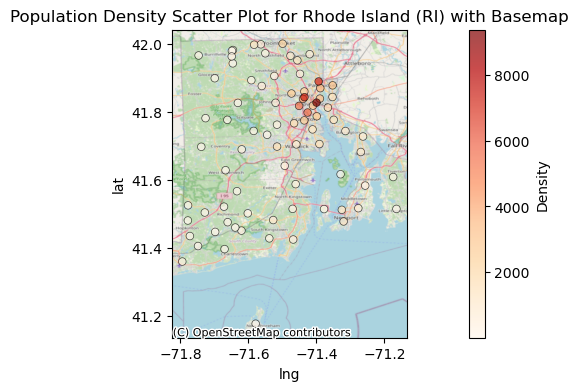

In [283]:
# Create a scatter plot with contextily basemap for the selected state (Rhode Island)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Rhode Island)
scatter = ax.scatter(RI_df['lng'], RI_df['lat'], c=RI_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Rhode Island (RI) with Basemap')

# Show the plot
plt.show()

In [284]:
# Filter counties with average density greater than 100 for Rhode Island
RI_high_density_df = result_df_RI[result_df_RI['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Rhode Island
RI_low_density_df = result_df_RI[result_df_RI['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {RI}:')
print(RI_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {RI}:')
print(RI_low_density_df.to_string(index=False))


Counties with Average Density > 100 in RI:
    County  Average Density
   Bristol       796.333333
      Kent       695.637500
   Newport       512.537500
Providence      1857.197619
Washington       160.195000


Counties with Average Density <= 100 in RI:
Empty DataFrame
Columns: [County, Average Density]
Index: []


In [285]:
# Calculate the number of firebots for each county with average density > 100 in Rhode Island
RI_high_density_df['Number of Firebots'] = RI_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {RI}:')
print(RI_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in RI:
    County  Average Density  Number of Firebots
   Bristol       796.333333            7.963333
      Kent       695.637500            6.956375
   Newport       512.537500            5.125375
Providence      1857.197619           18.571976
Washington       160.195000            1.601950


In [286]:
# Filter counties with average density less than or equal to 100 for Rhode Island
RI_low_density_df = result_df_RI[result_df_RI['Average Density'] <= 100]

# Count the number of counties with average density <= 100
RI_low_density_counties = len(RI_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Rhode Island (RI): {RI_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Rhode Island
total_firebots_high_density_RI = RI_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Rhode Island (RI):", total_firebots_high_density_RI)


Number of Counties with Average Density <= 100 in Rhode Island (RI): 0

Total Number of Firebots for High Density Counties in Rhode Island (RI): 40.21900952380953


In [287]:
# Display the total number of firebots for Rhode Island
print("Total Number of Firebots for Rhode Island:")
print(total_firebots_high_density_RI + RI_low_density_counties)

Total Number of Firebots for Rhode Island:
40.21900952380953


# South Carolina

In [288]:
SC = 'SC'

# Filter the DataFrame for the selected state (South Carolina)
SC_df = df[df['state_id'] == SC]

# Calculate the average population density per county
average_density_by_county_SC = SC_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_SC = pd.DataFrame({
    'County': average_density_by_county_SC.index,
    'Average Density': average_density_by_county_SC.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {SC}:')
print(result_df_SC.to_string(index=False))

Average Population Density by County in SC:
      County  Average Density
   Abbeville        41.450000
       Aiken       257.005882
   Allendale         6.180000
    Anderson       124.009091
     Bamberg        14.575000
    Barnwell        25.100000
    Beaufort       198.521429
    Berkeley       138.084615
     Calhoun        15.100000
  Charleston      1174.403846
    Cherokee        58.780000
     Chester        25.000000
Chesterfield        20.325000
   Clarendon        18.616667
    Colleton        12.618182
  Darlington        36.816667
      Dillon        22.033333
  Dorchester       229.875000
   Edgefield        32.516667
   Fairfield         9.420000
    Florence        74.372727
  Georgetown        45.800000
  Greenville       654.443478
   Greenwood        69.200000
     Hampton        16.644444
       Horry       252.287500
      Jasper        10.220000
     Kershaw        43.514286
   Lancaster       134.925000
     Laurens        43.250000
         Lee        30.675

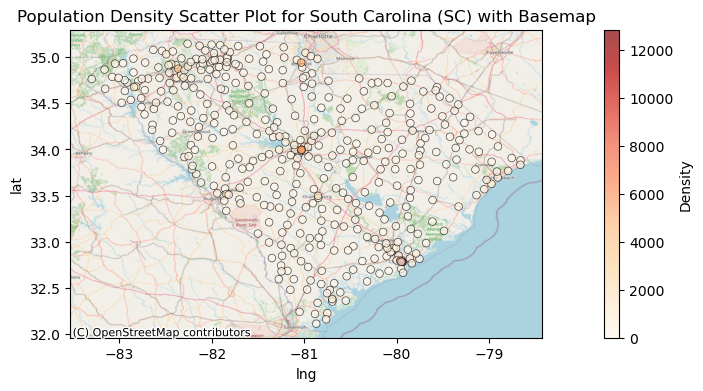

In [289]:
# Create a scatter plot with contextily basemap for the selected state (South Carolina)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (South Carolina)
scatter = ax.scatter(SC_df['lng'], SC_df['lat'], c=SC_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for South Carolina (SC) with Basemap')

# Show the plot
plt.show()

In [290]:
# Filter counties with average density greater than 100 for South Carolina
SC_high_density_df = result_df_SC[result_df_SC['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for South Carolina
SC_low_density_df = result_df_SC[result_df_SC['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {SC}:')
print(SC_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {SC}:')
print(SC_low_density_df.to_string(index=False))


Counties with Average Density > 100 in SC:
     County  Average Density
      Aiken       257.005882
   Anderson       124.009091
   Beaufort       198.521429
   Berkeley       138.084615
 Charleston      1174.403846
 Dorchester       229.875000
 Greenville       654.443478
      Horry       252.287500
  Lancaster       134.925000
  Lexington       251.838462
  McCormick       158.283333
 Orangeburg       163.100000
    Pickens       332.211111
   Richland      1143.333333
Spartanburg       222.903448
       York       622.816667


Counties with Average Density <= 100 in SC:
      County  Average Density
   Abbeville        41.450000
   Allendale         6.180000
     Bamberg        14.575000
    Barnwell        25.100000
     Calhoun        15.100000
    Cherokee        58.780000
     Chester        25.000000
Chesterfield        20.325000
   Clarendon        18.616667
    Colleton        12.618182
  Darlington        36.816667
      Dillon        22.033333
   Edgefield        32.51666

In [291]:
# Calculate the number of firebots for each county with average density > 100 in South Carolina
SC_high_density_df['Number of Firebots'] = SC_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {SC}:')
print(SC_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in SC:
     County  Average Density  Number of Firebots
      Aiken       257.005882            2.570059
   Anderson       124.009091            1.240091
   Beaufort       198.521429            1.985214
   Berkeley       138.084615            1.380846
 Charleston      1174.403846           11.744038
 Dorchester       229.875000            2.298750
 Greenville       654.443478            6.544435
      Horry       252.287500            2.522875
  Lancaster       134.925000            1.349250
  Lexington       251.838462            2.518385
  McCormick       158.283333            1.582833
 Orangeburg       163.100000            1.631000
    Pickens       332.211111            3.322111
   Richland      1143.333333           11.433333
Spartanburg       222.903448            2.229034
       York       622.816667            6.228167


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1639864908.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SC_high_density_df['Number of Firebots'] = SC_high_density_df['Average Density'] / 100


In [292]:
# Filter counties with average density less than or equal to 100 for South Carolina
SC_low_density_df = result_df_SC[result_df_SC['Average Density'] <= 100]

# Count the number of counties with average density <= 100
SC_low_density_counties = len(SC_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in South Carolina (SC): {SC_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in South Carolina
total_firebots_high_density_SC = SC_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in South Carolina (SC):", total_firebots_high_density_SC)


Number of Counties with Average Density <= 100 in South Carolina (SC): 30

Total Number of Firebots for High Density Counties in South Carolina (SC): 60.5804219589156


In [293]:
# Display the total number of firebots for South Carolina
print("Total Number of Firebots for South Carolina:")
print(total_firebots_high_density_SC + SC_low_density_counties)

Total Number of Firebots for South Carolina:
90.5804219589156


# South Dakota

In [295]:
SD = 'SD'

# Filter the DataFrame for the selected state (South Dakota)
SD_df = df[df['state_id'] == SD]

# Calculate the average population density per county
average_density_by_county_SD = SD_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_SD = pd.DataFrame({
    'County': average_density_by_county_SD.index,
    'Average Density': average_density_by_county_SD.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {SD}:')
print(result_df_SD.to_string(index=False))

Average Population Density by County in SD:
       County  Average Density
       Aurora         1.566667
       Beadle         3.925000
      Bennett         1.366667
    Bon Homme         4.920000
    Brookings       378.000000
        Brown         6.307143
        Brule         2.300000
      Buffalo         4.850000
        Butte         1.450000
     Campbell         0.966667
  Charles Mix         9.785714
        Clark         1.466667
         Clay        11.900000
    Codington        57.350000
       Corson         9.654545
       Custer         5.275000
      Davison        11.800000
          Day         1.928571
        Deuel         3.171429
        Dewey         1.414286
      Douglas         1.940000
      Edmunds         1.266667
   Fall River         1.220000
        Faulk         0.700000
        Grant         3.350000
      Gregory         1.266667
       Haakon         0.300000
       Hamlin         3.840000
         Hand         0.683333
       Hanson         2.50

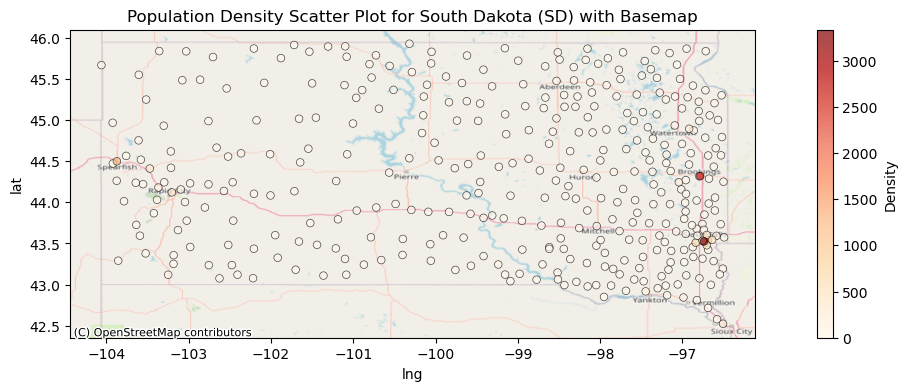

In [296]:
# Create a scatter plot with contextily basemap for the selected state (South Dakota)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (South Dakota)
scatter = ax.scatter(SD_df['lng'], SD_df['lat'], c=SD_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for South Dakota (SD) with Basemap')

# Show the plot
plt.show()

In [297]:
# Filter counties with average density greater than 100 for South Dakota
SD_high_density_df = result_df_SD[result_df_SD['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for South Dakota
SD_low_density_df = result_df_SD[result_df_SD['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {SD}:')
print(SD_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {SD}:')
print(SD_low_density_df.to_string(index=False))

Counties with Average Density > 100 in SD:
   County  Average Density
Brookings       378.000000
 Lawrence       172.957143
Minnehaha       408.647368


Counties with Average Density <= 100 in SD:
       County  Average Density
       Aurora         1.566667
       Beadle         3.925000
      Bennett         1.366667
    Bon Homme         4.920000
        Brown         6.307143
        Brule         2.300000
      Buffalo         4.850000
        Butte         1.450000
     Campbell         0.966667
  Charles Mix         9.785714
        Clark         1.466667
         Clay        11.900000
    Codington        57.350000
       Corson         9.654545
       Custer         5.275000
      Davison        11.800000
          Day         1.928571
        Deuel         3.171429
        Dewey         1.414286
      Douglas         1.940000
      Edmunds         1.266667
   Fall River         1.220000
        Faulk         0.700000
        Grant         3.350000
      Gregory         1.2666

In [298]:
# Calculate the number of firebots for each county with average density > 100 in South Dakota
SD_high_density_df['Number of Firebots'] = SD_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {SD}:')
print(SD_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in SD:
   County  Average Density  Number of Firebots
Brookings       378.000000            3.780000
 Lawrence       172.957143            1.729571
Minnehaha       408.647368            4.086474


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1379994961.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SD_high_density_df['Number of Firebots'] = SD_high_density_df['Average Density'] / 100


In [299]:
# Filter counties with average density less than or equal to 100 for South Dakota
SD_low_density_df = result_df_SD[result_df_SD['Average Density'] <= 100]

# Count the number of counties with average density <= 100
SD_low_density_counties = len(SD_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in South Dakota (SD): {SD_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in South Dakota
total_firebots_high_density_SD = SD_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in South Dakota (SD):", total_firebots_high_density_SD)


Number of Counties with Average Density <= 100 in South Dakota (SD): 63

Total Number of Firebots for High Density Counties in South Dakota (SD): 9.596045112781955


In [300]:
# Display the total number of firebots for South Dakota
print("Total Number of Firebots for South Dakota:")
print(total_firebots_high_density_SD + SD_low_density_counties)

Total Number of Firebots for South Dakota:
72.59604511278195


# Tennessee

In [301]:
TN = 'TN'

# Filter the DataFrame for the selected state (Tennessee)
TN_df = df[df['state_id'] == TN]

# Calculate the average population density per county
average_density_by_county_TN = TN_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_TN = pd.DataFrame({
    'County': average_density_by_county_TN.index,
    'Average Density': average_density_by_county_TN.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {TN}:')
print(result_df_TN.to_string(index=False))

Average Population Density by County in TN:
    County  Average Density
  Anderson        85.942857
   Bedford        33.580000
    Benton        12.150000
   Bledsoe        15.950000
    Blount       130.750000
   Bradley       127.240000
  Campbell        43.871429
    Cannon        21.250000
   Carroll        18.650000
    Carter       436.140000
  Cheatham        48.675000
   Chester        24.475000
 Claiborne        24.762500
      Clay        12.833333
     Cocke        27.750000
    Coffee        47.575000
  Crockett        81.440000
Cumberland        92.483333
  Davidson       824.350000
    DeKalb        23.200000
   Decatur        12.440000
   Dickson        36.785714
      Dyer        19.383333
   Fayette        69.388889
  Fentress        16.540000
  Franklin       125.722222
    Gibson        77.466667
     Giles        50.700000
  Grainger        28.000000
    Greene        41.071429
    Grundy        15.685714
   Hamblen       131.650000
  Hamilton       696.824000
   H

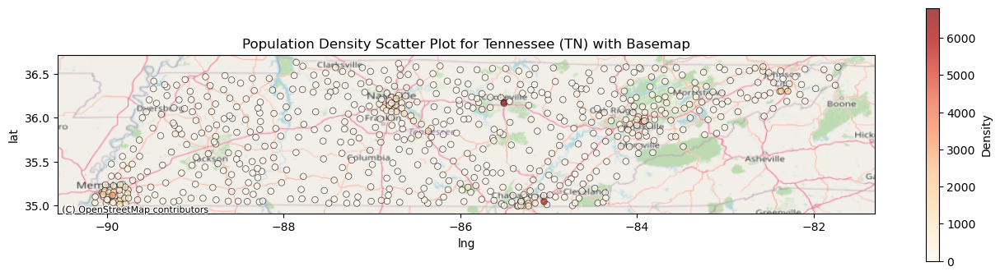

In [302]:
# Create a scatter plot with contextily basemap for the selected state (Tennessee)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Tennessee)
scatter = ax.scatter(TN_df['lng'], TN_df['lat'], c=TN_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Tennessee (TN) with Basemap')

# Show the plot
plt.show()

In [303]:
# Filter counties with average density greater than 100 for Tennessee
TN_high_density_df = result_df_TN[result_df_TN['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Tennessee
TN_low_density_df = result_df_TN[result_df_TN['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {TN}:')
print(TN_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {TN}:')
print(TN_low_density_df.to_string(index=False))


Counties with Average Density > 100 in TN:
    County  Average Density
    Blount       130.750000
   Bradley       127.240000
    Carter       436.140000
  Davidson       824.350000
  Franklin       125.722222
   Hamblen       131.650000
  Hamilton       696.824000
      Knox       704.447826
Montgomery       159.271429
    Putnam       893.962500
Rutherford       330.000000
    Shelby       868.215789
  Sullivan       233.712500
    Sumner       129.400000
Washington       409.700000
Williamson       168.660000


Counties with Average Density <= 100 in TN:
    County  Average Density
  Anderson        85.942857
   Bedford        33.580000
    Benton        12.150000
   Bledsoe        15.950000
  Campbell        43.871429
    Cannon        21.250000
   Carroll        18.650000
  Cheatham        48.675000
   Chester        24.475000
 Claiborne        24.762500
      Clay        12.833333
     Cocke        27.750000
    Coffee        47.575000
  Crockett        81.440000
Cumberland     

In [304]:
# Calculate the number of firebots for each county with average density > 100 in Tennessee
TN_high_density_df['Number of Firebots'] = TN_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {TN}:')
print(TN_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in TN:
    County  Average Density  Number of Firebots
    Blount       130.750000            1.307500
   Bradley       127.240000            1.272400
    Carter       436.140000            4.361400
  Davidson       824.350000            8.243500
  Franklin       125.722222            1.257222
   Hamblen       131.650000            1.316500
  Hamilton       696.824000            6.968240
      Knox       704.447826            7.044478
Montgomery       159.271429            1.592714
    Putnam       893.962500            8.939625
Rutherford       330.000000            3.300000
    Shelby       868.215789            8.682158
  Sullivan       233.712500            2.337125
    Sumner       129.400000            1.294000
Washington       409.700000            4.097000
Williamson       168.660000            1.686600


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1639657075.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TN_high_density_df['Number of Firebots'] = TN_high_density_df['Average Density'] / 100


In [305]:
# Filter counties with average density less than or equal to 100 for Tennessee
TN_low_density_df = result_df_TN[result_df_TN['Average Density'] <= 100]

# Count the number of counties with average density <= 100
TN_low_density_counties = len(TN_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Tennessee (TN): {TN_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Tennessee
total_firebots_high_density_TN = TN_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Tennessee (TN):", total_firebots_high_density_TN)


Number of Counties with Average Density <= 100 in Tennessee (TN): 79

Total Number of Firebots for High Density Counties in Tennessee (TN): 63.700462663542915


In [306]:
# Display the total number of firebots for Tennessee
print("Total Number of Firebots for Tennessee:")
print(total_firebots_high_density_TN + TN_low_density_counties)

Total Number of Firebots for Tennessee:
142.7004626635429


# Utah

In [307]:
UT = 'UT'

# Filter the DataFrame for the selected state (Utah)
UT_df = df[df['state_id'] == UT]

# Calculate the average population density per county
average_density_by_county_UT = UT_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_UT = pd.DataFrame({
    'County': average_density_by_county_UT.index,
    'Average Density': average_density_by_county_UT.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {UT}:')
print(result_df_UT.to_string(index=False))

Average Population Density by County in UT:
    County  Average Density
    Beaver         4.975000
 Box Elder        39.466667
     Cache       152.255556
    Carbon        24.350000
   Daggett         1.000000
     Davis       642.227273
  Duchesne         5.766667
     Emery         6.611111
  Garfield         3.987500
     Grand         0.833333
      Iron        16.340000
      Juab        16.675000
      Kane         1.250000
   Millard         7.454545
    Morgan         6.300000
     Piute         6.700000
      Rich         2.900000
 Salt Lake      1236.916667
  San Juan         1.937500
   Sanpete        13.760000
    Sevier        24.383333
    Summit        26.725000
    Tooele        17.625000
    Uintah         5.837500
      Utah       693.116667
   Wasatch        22.266667
Washington        77.935000
     Wayne         2.666667
     Weber       467.860000


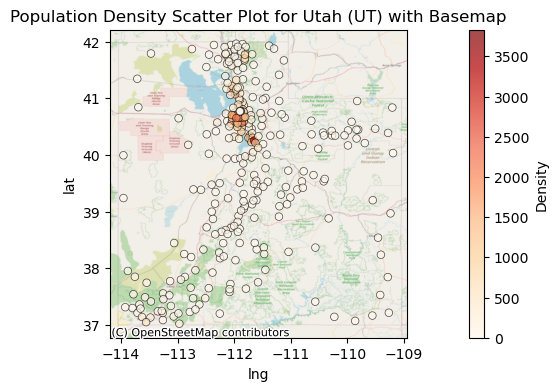

In [308]:
# Create a scatter plot with contextily basemap for the selected state (Utah)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Utah)
scatter = ax.scatter(UT_df['lng'], UT_df['lat'], c=UT_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Utah (UT) with Basemap')

# Show the plot
plt.show()

In [309]:
# Filter counties with average density greater than 100 for Utah
UT_high_density_df = result_df_UT[result_df_UT['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Utah
UT_low_density_df = result_df_UT[result_df_UT['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {UT}:')
print(UT_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {UT}:')
print(UT_low_density_df.to_string(index=False))

Counties with Average Density > 100 in UT:
   County  Average Density
    Cache       152.255556
    Davis       642.227273
Salt Lake      1236.916667
     Utah       693.116667
    Weber       467.860000


Counties with Average Density <= 100 in UT:
    County  Average Density
    Beaver         4.975000
 Box Elder        39.466667
    Carbon        24.350000
   Daggett         1.000000
  Duchesne         5.766667
     Emery         6.611111
  Garfield         3.987500
     Grand         0.833333
      Iron        16.340000
      Juab        16.675000
      Kane         1.250000
   Millard         7.454545
    Morgan         6.300000
     Piute         6.700000
      Rich         2.900000
  San Juan         1.937500
   Sanpete        13.760000
    Sevier        24.383333
    Summit        26.725000
    Tooele        17.625000
    Uintah         5.837500
   Wasatch        22.266667
Washington        77.935000
     Wayne         2.666667


In [310]:
# Calculate the number of firebots for each county with average density > 100 in Utah
UT_high_density_df['Number of Firebots'] = UT_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {UT}:')
print(UT_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in UT:
   County  Average Density  Number of Firebots
    Cache       152.255556            1.522556
    Davis       642.227273            6.422273
Salt Lake      1236.916667           12.369167
     Utah       693.116667            6.931167
    Weber       467.860000            4.678600


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1893293324.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UT_high_density_df['Number of Firebots'] = UT_high_density_df['Average Density'] / 100


In [311]:
# Filter counties with average density less than or equal to 100 for Utah
UT_low_density_df = result_df_UT[result_df_UT['Average Density'] <= 100]

# Count the number of counties with average density <= 100
UT_low_density_counties = len(UT_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Utah (UT): {UT_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Utah
total_firebots_high_density_UT = UT_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Utah (UT):", total_firebots_high_density_UT)


Number of Counties with Average Density <= 100 in Utah (UT): 24

Total Number of Firebots for High Density Counties in Utah (UT): 31.923761616161617


In [312]:
# Display the total number of firebots for Utah
print("Total Number of Firebots for Utah:")
print(total_firebots_high_density_UT + UT_low_density_counties)

Total Number of Firebots for Utah:
55.92376161616161


# Vermont

In [313]:
VT = 'VT'

# Filter the DataFrame for the selected state (Vermont)
VT_df = df[df['state_id'] == VT]

# Calculate the average population density per county
average_density_by_county_VT = VT_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_VT = pd.DataFrame({
    'County': average_density_by_county_VT.index,
    'Average Density': average_density_by_county_VT.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {VT}:')
print(result_df_VT.to_string(index=False))

Average Population Density by County in VT:
    County  Average Density
   Addison        16.640000
Bennington        22.500000
 Caledonia        27.081250
Chittenden       846.777778
     Essex        20.191667
  Franklin        26.300000
Grand Isle        35.380000
  Lamoille        19.636364
    Orange        24.819231
   Orleans        13.909091
   Rutland        25.223077
Washington        35.077273
   Windham        88.440000
   Windsor        47.054286


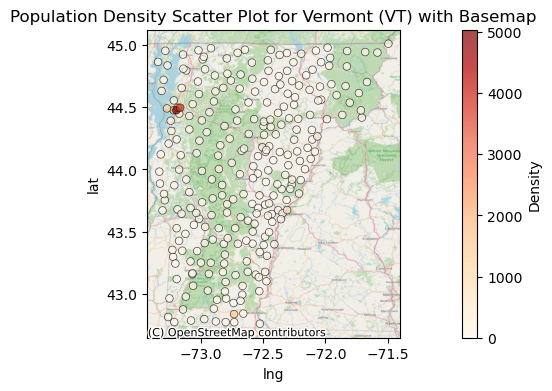

In [314]:
# Create a scatter plot with contextily basemap for the selected state (Vermont)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Vermont)
scatter = ax.scatter(VT_df['lng'], VT_df['lat'], c=VT_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Vermont (VT) with Basemap')

# Show the plot
plt.show()

In [315]:
# Filter counties with average density greater than 100 for Vermont
VT_high_density_df = result_df_VT[result_df_VT['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Vermont
VT_low_density_df = result_df_VT[result_df_VT['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {VT}:')
print(VT_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {VT}:')
print(VT_low_density_df.to_string(index=False))


Counties with Average Density > 100 in VT:
    County  Average Density
Chittenden       846.777778


Counties with Average Density <= 100 in VT:
    County  Average Density
   Addison        16.640000
Bennington        22.500000
 Caledonia        27.081250
     Essex        20.191667
  Franklin        26.300000
Grand Isle        35.380000
  Lamoille        19.636364
    Orange        24.819231
   Orleans        13.909091
   Rutland        25.223077
Washington        35.077273
   Windham        88.440000
   Windsor        47.054286


In [316]:
# Calculate the number of firebots for each county with average density > 100 in Vermont
VT_high_density_df['Number of Firebots'] = VT_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {VT}:')
print(VT_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in VT:
    County  Average Density  Number of Firebots
Chittenden       846.777778            8.467778


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2488410451.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VT_high_density_df['Number of Firebots'] = VT_high_density_df['Average Density'] / 100


In [317]:
# Filter counties with average density less than or equal to 100 for Vermont
VT_low_density_df = result_df_VT[result_df_VT['Average Density'] <= 100]

# Count the number of counties with average density <= 100
VT_low_density_counties = len(VT_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Vermont (VT): {VT_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Vermont
total_firebots_high_density_VT = VT_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Vermont (VT):", total_firebots_high_density_VT)


Number of Counties with Average Density <= 100 in Vermont (VT): 13

Total Number of Firebots for High Density Counties in Vermont (VT): 8.467777777777778


In [318]:
# Display the total number of firebots for Vermont
print("Total Number of Firebots for Vermont:")
print(total_firebots_high_density_VT + VT_low_density_counties)

Total Number of Firebots for Vermont:
21.467777777777776


# Texas REDO

In [319]:
TX = 'TX'

# Filter the DataFrame for the selected state (Texas)
TX_df = df[df['state_id'] == TX]

# Calculate the average population density per county
average_density_by_county_TX = TX_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_TX = pd.DataFrame({
    'County': average_density_by_county_TX.index,
    'Average Density': average_density_by_county_TX.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {TX}:')
print(result_df_TX.to_string(index=False))

Average Population Density by County in TX:
       County  Average Density
     Anderson      1176.000000
      Andrews         9.300000
     Angelina        61.057143
      Aransas       160.900000
       Archer        10.400000
    Armstrong         0.600000
     Atascosa        27.250000
       Austin        27.157143
       Bailey         1.425000
      Bandera         9.333333
      Bastrop        33.800000
       Baylor         1.600000
          Bee         7.433333
         Bell       276.182353
        Bexar      1042.997143
       Blanco         4.650000
       Borden         0.350000
       Bosque         6.287500
        Bowie       106.800000
     Brazoria       229.062500
       Brazos      1548.555556
     Brewster        76.120000
      Briscoe         0.900000
       Brooks         4.150000
        Brown        10.885714
     Burleson        47.400000
       Burnet        18.975000
     Caldwell        36.500000
      Calhoun        35.150000
     Callahan         5.37

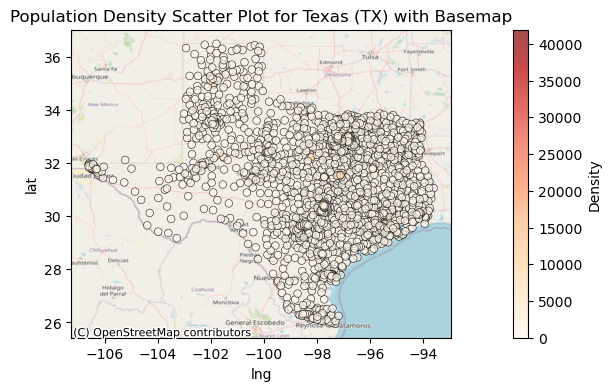

In [320]:
# Create a scatter plot with contextily basemap for the selected state (Texas)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Texas)
scatter = ax.scatter(TX_df['lng'], TX_df['lat'], c=TX_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Texas (TX) with Basemap')

# Show the plot
plt.show()


In [321]:
# Filter counties with average density greater than 100 for Texas
TX_high_density_df = result_df_TX[result_df_TX['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Texas
TX_low_density_df = result_df_TX[result_df_TX['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {TX}:')
print(TX_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {TX}:')
print(TX_low_density_df.to_string(index=False))

Counties with Average Density > 100 in TX:
     County  Average Density
   Anderson      1176.000000
    Aransas       160.900000
       Bell       276.182353
      Bexar      1042.997143
      Bowie       106.800000
   Brazoria       229.062500
     Brazos      1548.555556
    Cameron       224.062500
     Collin      1013.672414
    Coryell      1206.677778
     Dallas      1495.724706
     Denton      2321.025926
      Ector       216.320000
    El Paso       785.858065
      Ellis       102.623077
      Erath      1999.480000
  Fort Bend       604.238095
  Galveston       551.327778
      Gregg       214.114286
  Guadalupe       197.771429
     Harris      1631.077273
       Hays       149.557143
    Hidalgo       390.310345
     Howard      1250.120000
  Jefferson       457.005882
    Johnson       161.300000
    Lubbock       800.375000
   McLennan       826.595000
    Midland       553.000000
 Montgomery       373.540909
      Moore       133.850000
Nacogdoches       650.620000


In [322]:
# Calculate the number of firebots for each county with average density > 100 in Texas
TX_high_density_df['Number of Firebots'] = TX_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {TX}:')
print(TX_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in TX:
     County  Average Density  Number of Firebots
   Anderson      1176.000000           11.760000
    Aransas       160.900000            1.609000
       Bell       276.182353            2.761824
      Bexar      1042.997143           10.429971
      Bowie       106.800000            1.068000
   Brazoria       229.062500            2.290625
     Brazos      1548.555556           15.485556
    Cameron       224.062500            2.240625
     Collin      1013.672414           10.136724
    Coryell      1206.677778           12.066778
     Dallas      1495.724706           14.957247
     Denton      2321.025926           23.210259
      Ector       216.320000            2.163200
    El Paso       785.858065            7.858581
      Ellis       102.623077            1.026231
      Erath      1999.480000           19.994800
  Fort Bend       604.238095            6.042381
  Galveston       551.327778            5.513278
      Gregg       214.1142

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/3739443689.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TX_high_density_df['Number of Firebots'] = TX_high_density_df['Average Density'] / 100


In [323]:
# Filter counties with average density less than or equal to 100 for Texas
TX_low_density_df = result_df_TX[result_df_TX['Average Density'] <= 100]

# Count the number of counties with average density <= 100
TX_low_density_counties = len(TX_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Texas (TX): {TX_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Texas
total_firebots_high_density_TX = TX_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Texas (TX):", total_firebots_high_density_TX)


Number of Counties with Average Density <= 100 in Texas (TX): 206

Total Number of Firebots for High Density Counties in Texas (TX): 307.9873374139274


In [324]:
# Display the total number of firebots for Texas
print("Total Number of Firebots for Texas:")
print(total_firebots_high_density_TX + TX_low_density_counties)

Total Number of Firebots for Texas:
513.9873374139274


# Virginia

In [325]:
VA = 'VA'

# Filter the DataFrame for the selected state (Virginia)
VA_df = df[df['state_id'] == VA]

# Calculate the average population density per county
average_density_by_county_VA = VA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_VA = pd.DataFrame({
    'County': average_density_by_county_VA.index,
    'Average Density': average_density_by_county_VA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {VA}:')
print(result_df_VA.to_string(index=False))

Average Population Density by County in VA:
         County  Average Density
       Accomack        34.087879
      Albemarle       690.080000
     Alexandria      4067.933333
      Alleghany       193.120000
         Amelia        15.650000
        Amherst        68.400000
     Appomattox        19.166667
      Arlington      3534.690909
        Augusta        49.304545
           Bath         7.850000
        Bedford        57.492857
          Bland         5.775000
      Botetourt       188.800000
        Bristol       607.500000
      Brunswick         8.850000
       Buchanan        15.100000
     Buckingham        10.937500
       Campbell        66.744444
       Caroline        16.100000
        Carroll        19.975000
   Charles City         5.600000
      Charlotte         8.225000
Charlottesville         0.000000
     Chesapeake       806.583333
   Chesterfield       480.646154
         Clarke        23.633333
          Craig         3.900000
       Culpeper        35.400000

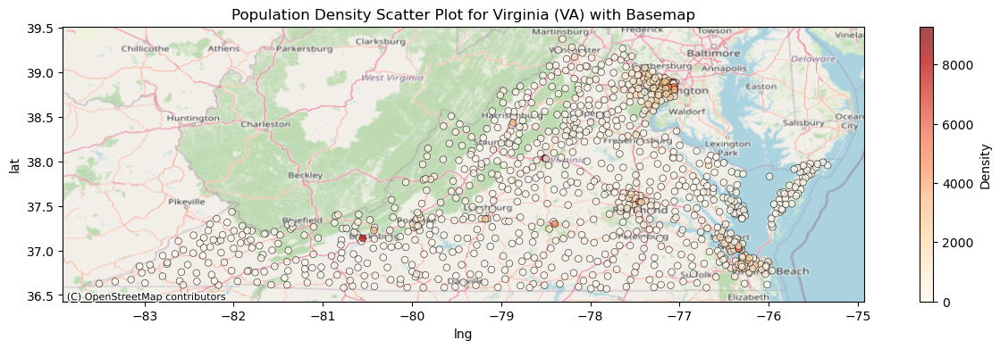

In [326]:
# Create a scatter plot with contextily basemap for the selected state (Virginia)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Virginia)
scatter = ax.scatter(VA_df['lng'], VA_df['lat'], c=VA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Virginia (VA) with Basemap')

# Show the plot
plt.show()


In [327]:
# Filter counties with average density greater than 100 for Virginia
VA_high_density_df = result_df_VA[result_df_VA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Virginia
VA_low_density_df = result_df_VA[result_df_VA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {VA}:')
print(VA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {VA}:')
print(VA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in VA:
        County  Average Density
     Albemarle       690.080000
    Alexandria      4067.933333
     Alleghany       193.120000
     Arlington      3534.690909
     Botetourt       188.800000
       Bristol       607.500000
    Chesapeake       806.583333
  Chesterfield       480.646154
       Fairfax      1456.732558
  Falls Church      2552.400000
Fredericksburg      1051.100000
    Gloucester       250.366667
       Hampton      1308.320000
       Hanover       111.711111
  Harrisonburg      3318.800000
       Henrico       852.330769
    James City       162.850000
       Loudoun       515.305882
     Lynchburg      1932.200000
      Manassas      1492.500000
    Montgomery       524.200000
  Newport News      1083.412500
       Norfolk      1925.864286
      Poquoson       313.800000
    Portsmouth      1150.428571
      Powhatan       190.850000
 Prince Edward       922.214286
 Prince George       198.080000
Prince William       844.3866

In [328]:
# Calculate the number of firebots for each county with average density > 100 in Virginia
VA_high_density_df['Number of Firebots'] = VA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {VA}:')
print(VA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in VA:
        County  Average Density  Number of Firebots
     Albemarle       690.080000            6.900800
    Alexandria      4067.933333           40.679333
     Alleghany       193.120000            1.931200
     Arlington      3534.690909           35.346909
     Botetourt       188.800000            1.888000
       Bristol       607.500000            6.075000
    Chesapeake       806.583333            8.065833
  Chesterfield       480.646154            4.806462
       Fairfax      1456.732558           14.567326
  Falls Church      2552.400000           25.524000
Fredericksburg      1051.100000           10.511000
    Gloucester       250.366667            2.503667
       Hampton      1308.320000           13.083200
       Hanover       111.711111            1.117111
  Harrisonburg      3318.800000           33.188000
       Henrico       852.330769            8.523308
    James City       162.850000            1.628500
       Loudoun       

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1586109040.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VA_high_density_df['Number of Firebots'] = VA_high_density_df['Average Density'] / 100


In [329]:
# Filter counties with average density less than or equal to 100 for Virginia
VA_low_density_df = result_df_VA[result_df_VA['Average Density'] <= 100]

# Count the number of counties with average density <= 100
VA_low_density_counties = len(VA_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Virginia (VA): {VA_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Virginia
total_firebots_high_density_VA = VA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Virginia (VA):", total_firebots_high_density_VA)


Number of Counties with Average Density <= 100 in Virginia (VA): 73

Total Number of Firebots for High Density Counties in Virginia (VA): 459.28066989998524


In [330]:
# Display the total number of firebots for Virginia
print("Total Number of Firebots for Virginia:")
print(total_firebots_high_density_VA + VA_low_density_counties)

Total Number of Firebots for Virginia:
532.2806698999852


# Washington

In [331]:
WA = 'WA'

# Filter the DataFrame for the selected state (Washington)
WA_df = df[df['state_id'] == WA]

# Calculate the average population density per county
average_density_by_county_WA = WA_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_WA = pd.DataFrame({
    'County': average_density_by_county_WA.index,
    'Average Density': average_density_by_county_WA.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {WA}:')
print(result_df_WA.to_string(index=False))

Average Population Density by County in WA:
      County  Average Density
       Adams         3.680000
      Asotin        19.200000
      Benton       278.372727
      Chelan        45.407692
     Clallam        31.775000
       Clark       804.989474
    Columbia         1.550000
     Cowlitz        41.250000
     Douglas        12.200000
       Ferry         1.788889
    Franklin        17.780000
    Garfield         1.200000
       Grant        16.142857
Grays Harbor        57.425000
      Island       140.475000
   Jefferson        46.700000
        King      2348.352326
      Kitsap       719.475000
    Kittitas        91.070000
   Klickitat         9.235714
       Lewis        55.719048
     Lincoln         2.158333
       Mason        44.822222
    Okanogan        19.473684
     Pacific        30.030769
Pend Oreille         5.100000
      Pierce       944.008772
    San Juan        26.755556
      Skagit       146.415385
    Skamania        35.750000
   Snohomish       973.622

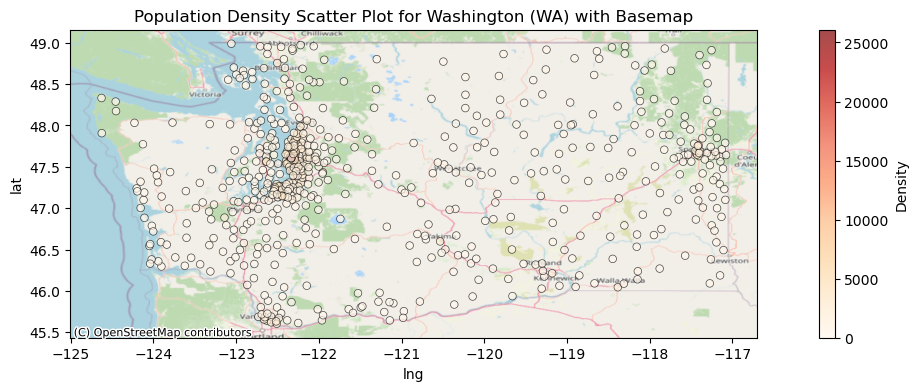

In [332]:
# Create a scatter plot with contextily basemap for the selected state (Washington)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Washington)
scatter = ax.scatter(WA_df['lng'], WA_df['lat'], c=WA_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Washington (WA) with Basemap')

# Show the plot
plt.show()


In [333]:
# Filter counties with average density greater than 100 for Washington
WA_high_density_df = result_df_WA[result_df_WA['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Washington
WA_low_density_df = result_df_WA[result_df_WA['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {WA}:')
print(WA_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {WA}:')
print(WA_low_density_df.to_string(index=False))

Counties with Average Density > 100 in WA:
     County  Average Density
     Benton       278.372727
      Clark       804.989474
     Island       140.475000
       King      2348.352326
     Kitsap       719.475000
     Pierce       944.008772
     Skagit       146.415385
  Snohomish       973.622222
    Spokane       564.852500
   Thurston       395.842857
Walla Walla       199.712500
    Whatcom       225.243750
     Yakima       134.145000


Counties with Average Density <= 100 in WA:
      County  Average Density
       Adams         3.680000
      Asotin        19.200000
      Chelan        45.407692
     Clallam        31.775000
    Columbia         1.550000
     Cowlitz        41.250000
     Douglas        12.200000
       Ferry         1.788889
    Franklin        17.780000
    Garfield         1.200000
       Grant        16.142857
Grays Harbor        57.425000
   Jefferson        46.700000
    Kittitas        91.070000
   Klickitat         9.235714
       Lewis        55.71

In [334]:
# Calculate the number of firebots for each county with average density > 100 in Washington
WA_high_density_df['Number of Firebots'] = WA_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {WA}:')
print(WA_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in WA:
     County  Average Density  Number of Firebots
     Benton       278.372727            2.783727
      Clark       804.989474            8.049895
     Island       140.475000            1.404750
       King      2348.352326           23.483523
     Kitsap       719.475000            7.194750
     Pierce       944.008772            9.440088
     Skagit       146.415385            1.464154
  Snohomish       973.622222            9.736222
    Spokane       564.852500            5.648525
   Thurston       395.842857            3.958429
Walla Walla       199.712500            1.997125
    Whatcom       225.243750            2.252438
     Yakima       134.145000            1.341450


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/1417118397.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WA_high_density_df['Number of Firebots'] = WA_high_density_df['Average Density'] / 100


In [335]:
# Filter counties with average density less than or equal to 100 for Washington
WA_low_density_df = result_df_WA[result_df_WA['Average Density'] <= 100]

# Count the number of counties with average density <= 100
WA_low_density_counties = len(WA_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Washington (WA): {WA_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Washington
total_firebots_high_density_WA = WA_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Washington (WA):", total_firebots_high_density_WA)


Number of Counties with Average Density <= 100 in Washington (WA): 26

Total Number of Firebots for High Density Counties in Washington (WA): 78.75507512448621


In [336]:
# Display the total number of firebots for Washington
print("Total Number of Firebots for Washington:")
print(total_firebots_high_density_WA + WA_low_density_counties)

Total Number of Firebots for Washington:
104.75507512448621


# West Virginia

In [337]:
WV = 'WV'

# Filter the DataFrame for the selected state (West Virginia)
WV_df = df[df['state_id'] == WV]

# Calculate the average population density per county
average_density_by_county_WV = WV_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_WV = pd.DataFrame({
    'County': average_density_by_county_WV.index,
    'Average Density': average_density_by_county_WV.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {WV}:')
print(result_df_WV.to_string(index=False))

Average Population Density by County in WV:
    County  Average Density
   Barbour        28.266667
  Berkeley       242.690000
     Boone        26.942857
   Braxton         8.692308
    Brooke       173.142857
    Cabell       829.266667
   Calhoun         6.660000
      Clay         9.466667
 Doddridge        10.300000
   Fayette        42.911905
    Gilmer        11.166667
     Grant         8.942857
Greenbrier        13.811111
 Hampshire        11.941176
   Hancock       143.700000
     Hardy         8.862500
  Harrison        91.341176
   Jackson        26.509091
 Jefferson       181.700000
   Kanawha       184.131818
     Lewis        11.337500
   Lincoln        19.942857
     Logan        37.343333
    Marion       137.057143
  Marshall       179.937500
     Mason        72.038462
  McDowell        25.529412
    Mercer        40.882353
   Mineral       151.400000
     Mingo        33.150000
Monongalia       354.475000
    Monroe        11.063636
    Morgan        21.200000
  Ni

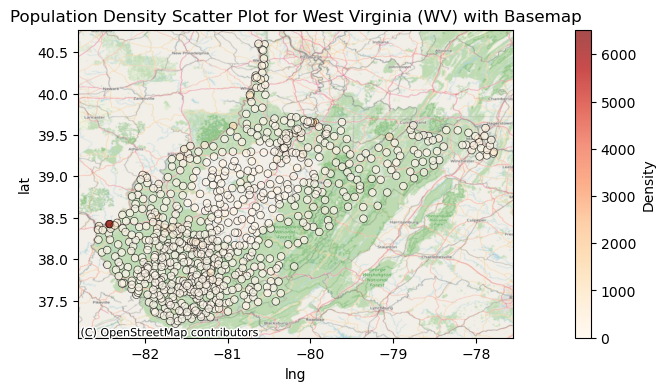

In [338]:
# Create a scatter plot with contextily basemap for the selected state (West Virginia)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (West Virginia)
scatter = ax.scatter(WV_df['lng'], WV_df['lat'], c=WV_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for West Virginia (WV) with Basemap')

# Show the plot
plt.show()


In [339]:
# Filter counties with average density greater than 100 for West Virginia
WV_high_density_df = result_df_WV[result_df_WV['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for West Virginia
WV_low_density_df = result_df_WV[result_df_WV['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {WV}:')
print(WV_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {WV}:')
print(WV_low_density_df.to_string(index=False))

Counties with Average Density > 100 in WV:
    County  Average Density
  Berkeley       242.690000
    Brooke       173.142857
    Cabell       829.266667
   Hancock       143.700000
 Jefferson       181.700000
   Kanawha       184.131818
    Marion       137.057143
  Marshall       179.937500
   Mineral       151.400000
Monongalia       354.475000
      Ohio       220.325000
 Pleasants       173.750000
    Putnam       168.309091
    Wetzel       102.445455
      Wood       117.845455


Counties with Average Density <= 100 in WV:
    County  Average Density
   Barbour        28.266667
     Boone        26.942857
   Braxton         8.692308
   Calhoun         6.660000
      Clay         9.466667
 Doddridge        10.300000
   Fayette        42.911905
    Gilmer        11.166667
     Grant         8.942857
Greenbrier        13.811111
 Hampshire        11.941176
     Hardy         8.862500
  Harrison        91.341176
   Jackson        26.509091
     Lewis        11.337500
   Lincoln     

In [340]:
# Calculate the number of firebots for each county with average density > 100 in West Virginia
WV_high_density_df['Number of Firebots'] = WV_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {WV}:')
print(WV_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in WV:
    County  Average Density  Number of Firebots
  Berkeley       242.690000            2.426900
    Brooke       173.142857            1.731429
    Cabell       829.266667            8.292667
   Hancock       143.700000            1.437000
 Jefferson       181.700000            1.817000
   Kanawha       184.131818            1.841318
    Marion       137.057143            1.370571
  Marshall       179.937500            1.799375
   Mineral       151.400000            1.514000
Monongalia       354.475000            3.544750
      Ohio       220.325000            2.203250
 Pleasants       173.750000            1.737500
    Putnam       168.309091            1.683091
    Wetzel       102.445455            1.024455
      Wood       117.845455            1.178455


/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/2090936830.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WV_high_density_df['Number of Firebots'] = WV_high_density_df['Average Density'] / 100


In [341]:
# Filter counties with average density less than or equal to 100 for West Virginia
WV_low_density_df = result_df_WV[result_df_WV['Average Density'] <= 100]

# Count the number of counties with average density <= 100
WV_low_density_counties = len(WV_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in West Virginia (WV): {WV_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in West Virginia
total_firebots_high_density_WV = WV_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in West Virginia (WV):", total_firebots_high_density_WV)


Number of Counties with Average Density <= 100 in West Virginia (WV): 40

Total Number of Firebots for High Density Counties in West Virginia (WV): 33.601759848484846


In [342]:
# Display the total number of firebots for West Virginia
print("Total Number of Firebots for West Virginia:")
print(total_firebots_high_density_WV + WV_low_density_counties)

Total Number of Firebots for West Virginia:
73.60175984848485


# Wisconsin

In [343]:
WI = 'WI'

# Filter the DataFrame for the selected state (Wisconsin)
WI_df = df[df['state_id'] == WI]

# Calculate the average population density per county
average_density_by_county_WI = WI_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_WI = pd.DataFrame({
    'County': average_density_by_county_WI.index,
    'Average Density': average_density_by_county_WI.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {WI}:')
print(result_df_WI.to_string(index=False))

Average Population Density by County in WI:
     County  Average Density
      Adams        19.528571
    Ashland        11.377778
     Barron        46.281818
   Bayfield         4.940000
      Brown       773.171429
    Buffalo         8.440000
    Burnett         8.683333
    Calumet       281.160000
   Chippewa        19.811111
      Clark        11.335714
   Columbia        46.200000
   Crawford        29.855556
       Dane       905.628571
      Dodge        60.985000
       Door        19.850000
    Douglas        13.690000
       Dunn        15.344444
 Eau Claire       166.428571
   Florence         2.650000
Fond du Lac       106.893333
     Forest         4.728571
      Grant        40.909524
      Green        21.285714
 Green Lake        95.700000
       Iowa        15.081818
       Iron        19.828571
    Jackson         8.957143
  Jefferson        51.660000
     Juneau        71.655556
    Kenosha       553.354545
   Kewaunee        23.625000
  La Crosse       151.866667

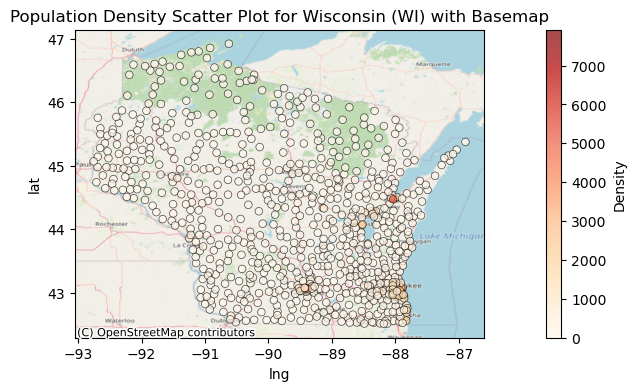

In [344]:
# Create a scatter plot with contextily basemap for the selected state (Wisconsin)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Wisconsin)
scatter = ax.scatter(WI_df['lng'], WI_df['lat'], c=WI_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Wisconsin (WI) with Basemap')

# Show the plot
plt.show()

In [345]:
# Filter counties with average density greater than 100 for Wisconsin
WI_high_density_df = result_df_WI[result_df_WI['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Wisconsin
WI_low_density_df = result_df_WI[result_df_WI['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {WI}:')
print(WI_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {WI}:')
print(WI_low_density_df.to_string(index=False))


Counties with Average Density > 100 in WI:
     County  Average Density
      Brown       773.171429
    Calumet       281.160000
       Dane       905.628571
 Eau Claire       166.428571
Fond du Lac       106.893333
    Kenosha       553.354545
  La Crosse       151.866667
  Manitowoc       105.250000
  Milwaukee      2018.933333
  Outagamie       403.053333
    Ozaukee       164.375000
     Racine       443.053846
   Richland       112.185714
       Rock       127.876923
  Sheboygan       154.928571
 Washington       127.581818
   Waukesha       369.138462
    Waupaca       262.666667
  Winnebago       409.625000


Counties with Average Density <= 100 in WI:
     County  Average Density
      Adams        19.528571
    Ashland        11.377778
     Barron        46.281818
   Bayfield         4.940000
    Buffalo         8.440000
    Burnett         8.683333
   Chippewa        19.811111
      Clark        11.335714
   Columbia        46.200000
   Crawford        29.855556
      Dodge 

In [346]:
# Calculate the number of firebots for each county with average density > 100 in Wisconsin
WI_high_density_df['Number of Firebots'] = WI_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {WI}:')
print(WI_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in WI:
     County  Average Density  Number of Firebots
      Brown       773.171429            7.731714
    Calumet       281.160000            2.811600
       Dane       905.628571            9.056286
 Eau Claire       166.428571            1.664286
Fond du Lac       106.893333            1.068933
    Kenosha       553.354545            5.533545
  La Crosse       151.866667            1.518667
  Manitowoc       105.250000            1.052500
  Milwaukee      2018.933333           20.189333
  Outagamie       403.053333            4.030533
    Ozaukee       164.375000            1.643750
     Racine       443.053846            4.430538
   Richland       112.185714            1.121857
       Rock       127.876923            1.278769
  Sheboygan       154.928571            1.549286
 Washington       127.581818            1.275818
   Waukesha       369.138462            3.691385
    Waupaca       262.666667            2.626667
  Winnebago       409.6250

/var/folders/f1/f4pv93hj5mzbv8wfv_s18dr80000gn/T/ipykernel_8199/3575614646.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WI_high_density_df['Number of Firebots'] = WI_high_density_df['Average Density'] / 100


In [347]:
# Filter counties with average density less than or equal to 100 for Wisconsin
WI_low_density_df = result_df_WI[result_df_WI['Average Density'] <= 100]

# Count the number of counties with average density <= 100
WI_low_density_counties = len(WI_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Wisconsin (WI): {WI_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Wisconsin
total_firebots_high_density_WI = WI_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Wisconsin (WI):", total_firebots_high_density_WI)


Number of Counties with Average Density <= 100 in Wisconsin (WI): 53

Total Number of Firebots for High Density Counties in Wisconsin (WI): 76.37171784881785


In [348]:
# Display the total number of firebots for Wisconsin
print("Total Number of Firebots for Wisconsin:")
print(total_firebots_high_density_WI + WI_low_density_counties)

Total Number of Firebots for Wisconsin:
129.37171784881787


# Wyoming

In [349]:
WY = 'WY'

# Filter the DataFrame for the selected state (Wyoming)
WY_df = df[df['state_id'] == WY]

# Calculate the average population density per county
average_density_by_county_WY = WY_df.groupby('county_name')['density'].mean()

# Create a DataFrame from the grouped result
result_df_WY = pd.DataFrame({
    'County': average_density_by_county_WY.index,
    'Average Density': average_density_by_county_WY.values
})

# Display the result for the selected state in table format
print(f'Average Population Density by County in {WY}:')
print(result_df_WY.to_string(index=False))

Average Population Density by County in WY:
     County  Average Density
     Albany         5.366667
   Big Horn         3.916667
 Bonneville         1.000000
   Campbell         3.028571
     Carbon         1.781818
   Converse         1.000000
      Crook         1.000000
    Fremont         3.966667
     Goshen         1.877778
Hot Springs         4.050000
    Johnson         1.233333
    Laramie        33.833333
    Larimer         0.100000
    Lincoln        14.280000
    Natrona        82.716667
   Niobrara         0.500000
       Park         6.114286
     Platte         1.980000
   Sheridan         5.045455
   Sublette         0.833333
     Summit         6.000000
 Sweetwater         7.072727
      Teton         6.671429
      Uinta         5.180000
   Washakie         2.650000
     Weston         0.800000


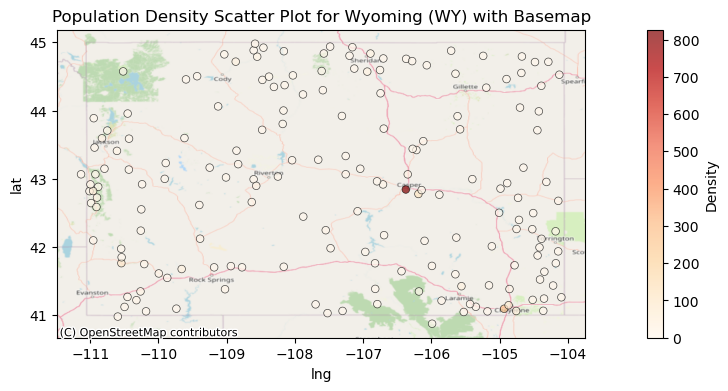

In [350]:
# Create a scatter plot with contextily basemap for the selected state (Wyoming)
fig, ax = plt.subplots(figsize=(16, 4))

# Scatter plot with latitude and longitude for the selected state (Wyoming)
scatter = ax.scatter(WY_df['lng'], WY_df['lat'], c=WY_df['density'], cmap='OrRd', s=30, edgecolors='k', linewidths=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, label='Density')

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set axis labels
ax.set_xlabel('lng')
ax.set_ylabel('lat')

# Set plot title
ax.set_title(f'Population Density Scatter Plot for Wyoming (WY) with Basemap')

# Show the plot
plt.show()

In [351]:
# Filter counties with average density greater than 100 for Wyoming
WY_high_density_df = result_df_WY[result_df_WY['Average Density'] > 100]

# Filter counties with average density less than or equal to 100 for Wyoming
WY_low_density_df = result_df_WY[result_df_WY['Average Density'] <= 100]

# Display the results
print(f'Counties with Average Density > 100 in {WY}:')
print(WY_high_density_df.to_string(index=False))

print('\n')

print(f'Counties with Average Density <= 100 in {WY}:')
print(WY_low_density_df.to_string(index=False))


Counties with Average Density > 100 in WY:
Empty DataFrame
Columns: [County, Average Density]
Index: []


Counties with Average Density <= 100 in WY:
     County  Average Density
     Albany         5.366667
   Big Horn         3.916667
 Bonneville         1.000000
   Campbell         3.028571
     Carbon         1.781818
   Converse         1.000000
      Crook         1.000000
    Fremont         3.966667
     Goshen         1.877778
Hot Springs         4.050000
    Johnson         1.233333
    Laramie        33.833333
    Larimer         0.100000
    Lincoln        14.280000
    Natrona        82.716667
   Niobrara         0.500000
       Park         6.114286
     Platte         1.980000
   Sheridan         5.045455
   Sublette         0.833333
     Summit         6.000000
 Sweetwater         7.072727
      Teton         6.671429
      Uinta         5.180000
   Washakie         2.650000
     Weston         0.800000


In [352]:
# Calculate the number of firebots for each county with average density > 100 in Wyoming
WY_high_density_df['Number of Firebots'] = WY_high_density_df['Average Density'] / 100

# Display the results
print(f'Counties with Average Density > 100 in {WY}:')
print(WY_high_density_df[['County', 'Average Density', 'Number of Firebots']].to_string(index=False))


Counties with Average Density > 100 in WY:
Empty DataFrame
Columns: [County, Average Density, Number of Firebots]
Index: []


In [353]:
# Filter counties with average density less than or equal to 100 for Wyoming
WY_low_density_df = result_df_WY[result_df_WY['Average Density'] <= 100]

# Count the number of counties with average density <= 100
WY_low_density_counties = len(WY_low_density_df)

# Display the result
print(f'Number of Counties with Average Density <= 100 in Wyoming (WY): {WY_low_density_counties}')

# Calculate the total sum of firebots for counties with average density > 100 in Wyoming
total_firebots_high_density_WY = WY_high_density_df['Number of Firebots'].sum()

print("\nTotal Number of Firebots for High Density Counties in Wyoming (WY):", total_firebots_high_density_WY)


Number of Counties with Average Density <= 100 in Wyoming (WY): 26

Total Number of Firebots for High Density Counties in Wyoming (WY): 0.0


In [354]:
# Display the total number of firebots for Wyoming
print("Total Number of Firebots for Wyoming:")
print(total_firebots_high_density_WY + WY_low_density_counties)

Total Number of Firebots for Wyoming:
26.0


In [355]:
total_firebots = (
    406.7103515406163 + 381.8443515406163 + 28.04380955144454 +
    40.27264227161727 + 354.67742158813047 + 103.04391549284193 +
    64.37400750775046 + 14.376228471325833 + 255.16001062422626 +
    225.14157623692853 + 22.176703947368424 + 58.556762121212124 +
    187.27434348710142 + 198.23226042011044 + 118.21999794372294 +
    126.88014334163898 + 186.10231731903286 + 153.87783888118247 +
    17.925475981620718 + 86.54115214300919 + 153.1230570396908 +
    154.3691577199428 + 144.918368661716 + 109.17028993506494 +
    158.5103179292929 + 58.70288333333333 + 113.4821468072468 +
    35.913246288798916 + 15.897341503267974 + 323.5693796373033 +
    51.7173731884058 + 858.5928341129885 + 175.9318742104301 +
    58.82297958791209 + 209.75416906022406 + 98.4161862924657 +
    78.96757274464666 + 258.88824143305914 + 40.21900952380953 +
    90.5804219589156 + 72.59604511278195 + 142.7004626635429 +
    55.92376161616161 + 21.467777777777776 + 513.9873374139274 +
    532.2806698999852 + 104.75507512448621 + 73.60175984848485 +
    129.37171784881787 + 26.0
)

print("Total Number of all Firebots:", total_firebots)


Total Number of all Firebots: 7891.662768685977


In [356]:
total_firebots = 7891.662768685977
cost_per_firebot = 110000

total_cost = total_firebots * cost_per_firebot
print("Total Cost in $:", total_cost)

Total Cost in $: 868082904.5554575


In [357]:
# approximately 869 million

In [376]:
383.8203515406163+123.5128701776594+36.24134865461336+28.04380955144454+40.27264227161727+354.67742158813047+103.04391549284193+64.37400750775046+14.376228471325833+255.16001062422626+225.14157623692853+22.176703947368424+58.556762121212124+187.27434348710142+198.23226042011044+118.21999794372294+126.88014334163898+186.10231731903286+153.87783888118247+17.925475981620718+86.54115214300919+153.1230570396908+154.3691577199428+144.918368661716+109.17028993506494+158.5103179292929+58.70288333333333+113.4821468072468+35.913246288798916+15.897341503267974+323.5693796373033+51.7173731884058+858.5928341129885+175.9318742104301+58.82297958791209+209.75416906022406+98.4161862924657+78.96757274464666+258.88824143305914+40.21900952380953+90.5804219589156+72.59604511278195+142.7004626635429+55.92376161616161+21.467777777777776+513.9873374139274+532.2806698999852+104.75507512448621+73.60175984848485+129.37171784881787+26.0

7646.682635977633

In [377]:
7646.682635977633 * 110000

841135089.9575397